# **Loading necessaires**

In [33]:
# Bibliothèques standards
import os
import re
import time
import string
import warnings
import html
import unicodedata
import ast
from itertools import product
from collections import Counter

# Traitement des données et calculs numériques
import numpy as np
import pandas as pd
import scipy.sparse

# Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

# Traitement du langage naturel (NLP)
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from bs4 import BeautifulSoup
from unidecode import unidecode
from langdetect import detect
from deep_translator import GoogleTranslator
import spacy

# Machine Learning et prétraitement
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn.metrics import classification_report, confusion_matrix, f1_score, accuracy_score

# Rééchantillonnage (gestion des classes déséquilibrées)
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# Modèles externes
import fasttext
from xgboost import XGBClassifier

# Outils utilitaires
from tqdm import tqdm
from tqdm.notebook import tqdm as tqdm_notebook
from joblib import Parallel, delayed, dump

# Configuration
warnings.filterwarnings('always')
tqdm.pandas()

# Téléchargement des ressources nécessaires de NLTK (à exécuter une seule fois)
nltk.download('stopwords')
nltk.download('punkt')


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\rudy_\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\rudy_\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [34]:
X_train_try = pd.read_csv("./Preprocessing/dfs/X_train_fullpreprocessed.csv")  
X_test_try = pd.read_csv("./Preprocessing/dfs/X_test_fullpreprocessed.csv")
X_val_try = pd.read_csv("./Preprocessing/dfs/X_val_fullpreprocessed.csv")

X_train = X_train_try.drop(columns=["prdtypecode"])
y_train =  X_train_try["prdtypecode"]
X_val = X_val_try.drop(columns=["prdtypecode"])
y_val =  X_val_try["prdtypecode"]
X_test = X_test_try.drop(columns=["prdtypecode"])
y_test =  X_test_try["prdtypecode"]

In [35]:
# Dictionnaire associant les codes produits aux labels textuels
labelcat = {
    10: "Livre occasion",
    40: "Jeu vidéo, accessoire tech.",
    50: "Accessoire Console",
    60: "Console de jeu",
    1140: "Figurine",
    1160: "Carte Collection",
    1180: "Jeu Plateau",
    1280: "Jouet enfant, déguisement",
    1281: "Jeu de société",
    1300: "Jouet tech",
    1301: "Paire de chaussettes",
    1302: "Jeu extérieur, vêtement",
    1320: "Autour du bébé",
    1560: "Mobilier intérieur",
    1920: "Chambre",
    1940: "Cuisine",
    2060: "Décoration intérieure",
    2220: "Animal",
    2280: "Revues et journaux",
    2403: "Magazines, livres et BDs",
    2462: "Jeu occasion",
    2522: "Bureautique et papeterie",
    2582: "Mobilier extérieur",
    2583: "Autour de la piscine",
    2585: "Bricolage",
    2705: "Livre neuf",
    2905: "Jeu PC",
}

# **Vectorisation TF IDF - No resampling** 

## Vectorisation multiples parametres

In [36]:
# Colonnes à vectoriser
text_columns = ["txt_0_tok_stp_lem", "txt_fr_tok_stp_lem"]

# Grille de paramètres TF-IDF
param_grid = list(product([5000, 10000], [1, 5], [0.85, 0.95]))

# Dossier de sortie
output_dir = "vectorized_data"
os.makedirs(output_dir, exist_ok=True)

# === Conversion de listes encodées en chaînes ===
for col in text_columns:
    if X_train[col].apply(lambda x: isinstance(x, str) and x.startswith("[")).any():
        X_train[col] = X_train[col].apply(lambda x: " ".join(eval(x)) if isinstance(x, str) and x.startswith("[") else x)
        X_val[col] = X_val[col].apply(lambda x: " ".join(eval(x)) if isinstance(x, str) and x.startswith("[") else x)
        X_test[col] = X_test[col].apply(lambda x: " ".join(eval(x)) if isinstance(x, str) and x.startswith("[") else x)

# === Vectorisation et sauvegarde ===
for col in text_columns:
    col_dir = os.path.join(output_dir, col)
    os.makedirs(col_dir, exist_ok=True)

    for max_features, min_df, max_df in param_grid:
        tfidf = TfidfVectorizer(max_features=max_features, min_df=min_df, max_df=max_df)

        # Vectorisation
        X_train_tfidf = tfidf.fit_transform(X_train[col])
        X_val_tfidf = tfidf.transform(X_val[col])
        X_test_tfidf = tfidf.transform(X_test[col])

        # Nom du paramètre pour les fichiers
        param_str = f"maxfeat_{max_features}_mindf_{min_df}_maxdf_{str(max_df).replace('.', '')}"

        # Sauvegarde des matrices
        scipy.sparse.save_npz(os.path.join(col_dir, f"X_train_tfidf_{param_str}.npz"), X_train_tfidf)
        scipy.sparse.save_npz(os.path.join(col_dir, f"X_val_tfidf_{param_str}.npz"), X_val_tfidf)
        scipy.sparse.save_npz(os.path.join(col_dir, f"X_test_tfidf_{param_str}.npz"), X_test_tfidf)

        # Sauvegarde du vocabulaire (optionnel)
        with open(os.path.join(col_dir, f"vocab_{param_str}.txt"), "w", encoding="utf-8") as f:
            for word in tfidf.get_feature_names_out():
                f.write(word + "\n")

        # Sauvegarde du vectorizer
        vectorizer_filename = os.path.join(col_dir, f"vectorizer_tfidf_{param_str}.joblib")
        dump(tfidf, vectorizer_filename)

print("\nVectorisation et sauvegarde terminées.")



Vectorisation et sauvegarde terminées.


## SVM

### SVM - Choix meilleur vectorisation

In [37]:
# Dossier contenant les matrices vectorisées
vectorized_dir = "vectorized_data"

# Grille d'hyperparamètres (régularisation C)
param_grid = {'C': [0.01, 0.1, 1, 10]}

# Liste pour stocker les résultats
results = []

# Affichage de la taille attendue de y_train
print(f"Taille attendue de y_train : {len(y_train)}")

# Boucle sur les colonnes textuelles vectorisées
for col in ["txt_0_tok_stp_lem", "txt_fr_tok_stp_lem"]:
    col_dir = os.path.join(vectorized_dir, col)

    # Boucle sur les fichiers TF-IDF de train
    for filename in os.listdir(col_dir):
        if filename.startswith("X_train_tfidf_") and filename.endswith(".npz"):
            param_str = filename.replace("X_train_tfidf_", "").replace(".npz", "")

            # Chargement de la matrice TF-IDF
            X_train_tfidf = scipy.sparse.load_npz(os.path.join(col_dir, filename))

            # Vérification des dimensions
            if X_train_tfidf.shape[0] != len(y_train):
                print(f"Problème détecté : {col} - {param_str}")
                print(f"Taille de X_train_tfidf : {X_train_tfidf.shape[0]}, Taille de y_train : {len(y_train)}")
                continue  # Sauter cette config

            # Initialisation du modèle et de GridSearchCV
            model = LinearSVC(class_weight='balanced', max_iter=5000, random_state=42)
            grid_search = GridSearchCV(model, param_grid, cv=5, scoring='f1_weighted', n_jobs=-1)

            # Recherche des meilleurs hyperparamètres
            grid_search.fit(X_train_tfidf, y_train)

            # Récupération des meilleurs résultats
            best_f1 = grid_search.best_score_
            best_params = grid_search.best_params_

            # Stockage des résultats
            results.append((col, param_str, best_f1, best_params))

# Création du DataFrame trié par F1-score
df_results = pd.DataFrame(results, columns=["Text Column", "TF-IDF Params", "F1 Score", "Best Params"])
df_results = df_results.sort_values(by="F1 Score", ascending=False)

# Sauvegarde des résultats
df_results.to_csv("df_results.csv", index=False)

# Affichage du tableau
display(df_results)


Taille attendue de y_train : 65588


,Text Column,TF-IDF Params,F1 Score,Best Params
0,txt_0_tok_stp_lem,maxfeat_10000_mindf_1_maxdf_085,0.800908,{'C': 1}
1,txt_0_tok_stp_lem,maxfeat_10000_mindf_1_maxdf_095,0.800908,{'C': 1}
2,txt_0_tok_stp_lem,maxfeat_10000_mindf_5_maxdf_085,0.800835,{'C': 1}
3,txt_0_tok_stp_lem,maxfeat_10000_mindf_5_maxdf_095,0.800835,{'C': 1}
10,txt_fr_tok_stp_lem,maxfeat_10000_mindf_5_maxdf_085,0.792136,{'C': 1}
11,txt_fr_tok_stp_lem,maxfeat_10000_mindf_5_maxdf_095,0.792136,{'C': 1}
8,txt_fr_tok_stp_lem,maxfeat_10000_mindf_1_maxdf_085,0.791975,{'C': 1}
9,txt_fr_tok_stp_lem,maxfeat_10000_mindf_1_maxdf_095,0.791975,{'C': 1}
6,txt_0_tok_stp_lem,maxfeat_5000_mindf_5_maxdf_085,0.781789,{'C': 1}
7,txt_0_tok_stp_lem,maxfeat_5000_mindf_5_maxdf_095,0.781789,{'C': 1}


### Evaluation SVM - best vectorisation - Non traduit
MODELE CHOISI EN VECTORISATION TF IDF CAR MEILLEUR F1 SCORE OBSERVE : sera sauvegardé et utilisé pour demo

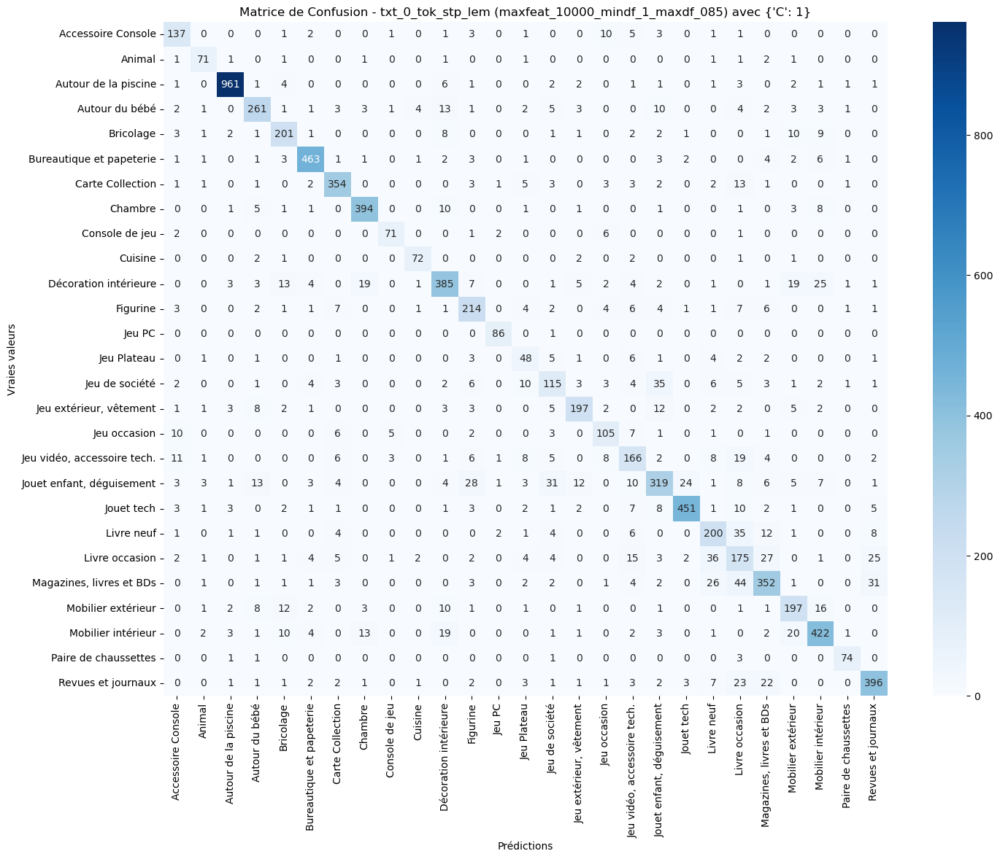


Meilleure configuration: txt_0_tok_stp_lem - maxfeat_10000_mindf_1_maxdf_085
F1 Score Weighted sur Validation: 0.8176
Meilleurs hyperparamètres: {'C': 1}

Classification Report sur Validation:
                              precision    recall  f1-score   support

         Accessoire Console       0.74      0.83      0.78       166
                     Animal       0.82      0.87      0.84        82
       Autour de la piscine       0.98      0.97      0.97       989
             Autour du bébé       0.83      0.81      0.82       324
                  Bricolage       0.79      0.82      0.80       244
   Bureautique et papeterie       0.93      0.93      0.93       496
           Carte Collection       0.89      0.89      0.89       396
                    Chambre       0.91      0.92      0.91       427
             Console de jeu       0.87      0.86      0.86        83
                    Cuisine       0.88      0.89      0.88        81
      Décoration intérieure       0.82      0

In [32]:
# Récupération de la meilleure configuration trouvée
best_row = df_results.iloc[0]
best_col, best_param, best_f1, best_params = best_row

# Chargement des matrices TF-IDF correspondantes (train et val)
X_train_best = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_col, f"X_train_tfidf_{best_param}.npz"))
X_val_best = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_col, f"X_val_tfidf_{best_param}.npz"))

# Entraînement du modèle avec les meilleurs hyperparamètres
best_model = LinearSVC(class_weight='balanced', max_iter=5000, random_state=42, **best_params)
best_model.fit(X_train_best, y_train)

# Prédictions sur l'ensemble de validation
y_pred_val = best_model.predict(X_val_best)

# Conversion des codes en labels textuels
y_true_labels = [labelcat.get(code, f"Code {code}") for code in y_val]
y_pred_labels = [labelcat.get(code, f"Code {code}") for code in y_pred_val]

# Rapport de classification
best_classification_report = classification_report(y_true_labels, y_pred_labels)

# Matrice de confusion triée par label
sorted_labels = sorted(labelcat.values())
cm_sorted = confusion_matrix(y_true_labels, y_pred_labels, labels=sorted_labels)

# Affichage de la matrice de confusion
plt.figure(figsize=(16, 12))
sns.heatmap(cm_sorted, annot=True, fmt="d", cmap="Blues", xticklabels=sorted_labels, yticklabels=sorted_labels)
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.title(f"Matrice de Confusion - {best_col} ({best_param}) avec {best_params}")
plt.show()

# Résumé des performances
print(f"\nMeilleure configuration: {best_col} - {best_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_true_labels, y_pred_labels, average='weighted'):.4f}")
print(f"Meilleurs hyperparamètres: {best_params}")
print("\nClassification Report sur Validation:\n", best_classification_report)

# Dossier de sauvegarde
save_dir = r"C:\Users\rudy_\Documents\Datascientest\Projet Rakuten\FINALE\Machine Learning\TF IDF\Sauvegarde"
os.makedirs(save_dir, exist_ok=True) 

# Nom de fichier explicite
model_filename = f"model_tfidf_{best_col}_{best_param}_LinearSVC.joblib"
model_path = os.path.join(save_dir, model_filename)

# Sauvegarde du modèle
dump(best_model, model_path)
print(f"\n Modèle LinearSVC sauvegardé dans : {model_path}")


### Evaluation SVM - best vectorisation - Traduit FR

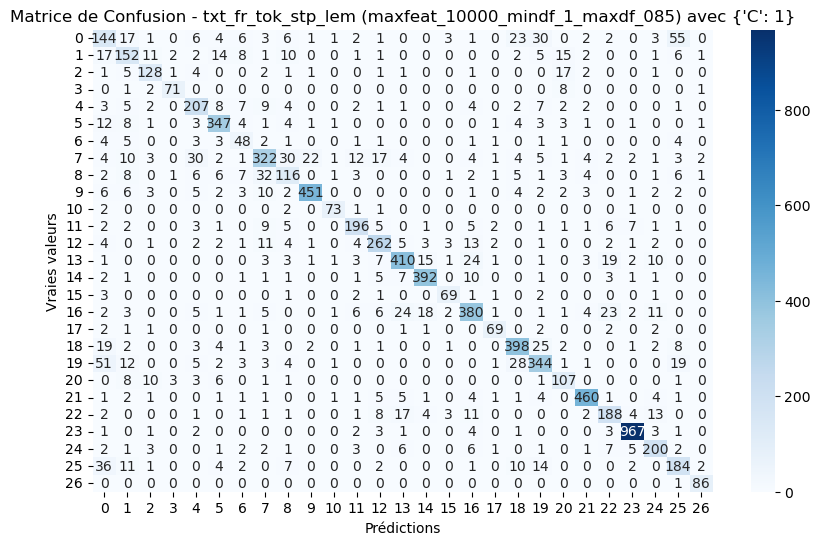


Configuration Spécifiée: txt_fr_tok_stp_lem - maxfeat_10000_mindf_1_maxdf_085
F1 Score Weighted sur Validation: 0.8036
Hyperparamètre utilisé: {'C': 1}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.45      0.46      0.45       311
          40       0.58      0.61      0.59       251
          50       0.76      0.77      0.76       166
          60       0.91      0.86      0.88        83
        1140       0.71      0.78      0.74       267
        1160       0.85      0.88      0.86       396
        1180       0.49      0.63      0.55        76
        1280       0.76      0.66      0.71       487
        1281       0.57      0.56      0.56       207
        1300       0.94      0.89      0.92       505
        1301       0.90      0.91      0.91        80
        1302       0.81      0.79      0.80       249
        1320       0.80      0.81      0.80       324
        1560       0.85      0.81      0.83       

In [67]:
# Meilleure configuration manuellement spécifiée
best_col = "txt_fr_tok_stp_lem"
best_param = "maxfeat_10000_mindf_1_maxdf_085"
best_params = {'C': 1}

# Chargement des matrices TF-IDF (train et val)
X_train_best = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_col, f"X_train_tfidf_{best_param}.npz"))
X_val_best = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_col, f"X_val_tfidf_{best_param}.npz"))

# Entraînement du modèle avec la configuration choisie
best_model = LinearSVC(class_weight='balanced', max_iter=5000, random_state=42, **best_params)
best_model.fit(X_train_best, y_train)

# Prédictions sur les données de validation
y_pred_val = best_model.predict(X_val_best)

# Rapport de classification et matrice de confusion
best_classification_report = classification_report(y_val, y_pred_val)
best_confusion_matrix = confusion_matrix(y_val, y_pred_val)

# Affichage de la matrice de confusion
plt.figure(figsize=(10, 6))
sns.heatmap(best_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - {best_col} ({best_param}) avec {best_params}")
plt.show()

# Résumé des performances sur validation
print(f"\nConfiguration Spécifiée: {best_col} - {best_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val, average='weighted'):.4f}")
print(f"Hyperparamètre utilisé: {best_params}")
print("\nClassification Report sur Validation:\n", best_classification_report)


## Random Forest

### RF - Choix meilleur vectorisation

In [4]:
# Dossier des matrices vectorisées
vectorized_dir = "vectorized_data"

# Grille d'hyperparamètres pour Random Forest
rf_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10, 20, None],
}

# Liste pour stocker les résultats
rf_results = []

# Boucle sur les colonnes vectorisées
for col in ["txt_0_tok_stp_lem", "txt_fr_tok_stp_lem"]:
    col_dir = os.path.join(vectorized_dir, col)

    # Boucle sur les fichiers TF-IDF d'entraînement
    for filename in os.listdir(col_dir):
        if filename.startswith("X_train_tfidf_") and filename.endswith(".npz"):
            param_str = filename.replace("X_train_tfidf_", "").replace(".npz", "")

            # Chargement de la matrice TF-IDF
            X_train_tfidf = scipy.sparse.load_npz(os.path.join(col_dir, filename))

            # Initialisation du modèle Random Forest avec GridSearchCV
            rf_model = RandomForestClassifier(class_weight="balanced", random_state=42, n_jobs=-1)
            rf_grid_search = GridSearchCV(rf_model, rf_param_grid, cv=5, scoring='f1_weighted', n_jobs=-1)

            # Entraînement et recherche des meilleurs hyperparamètres
            rf_grid_search.fit(X_train_tfidf, y_train)

            # Meilleurs résultats
            best_rf_f1 = rf_grid_search.best_score_
            best_rf_params = rf_grid_search.best_params_

            # Stockage des résultats
            rf_results.append((col, param_str, best_rf_f1, best_rf_params))

# Résultats sous forme de DataFrame trié
df_rf_results = pd.DataFrame(rf_results, columns=["Text Column", "TF-IDF Params", "F1 Score", "Best Params"])
df_rf_results = df_rf_results.sort_values(by="F1 Score", ascending=False)

# Sauvegarde des résultats
df_rf_results.to_csv("df_rf_results.csv", index=False)

# Affichage
display(df_rf_results)


,Text Column,TF-IDF Params,F1 Score,Best Params
0,txt_0_tok_stp_lem,maxfeat_10000_mindf_1_maxdf_085,0.776284,"{'max_depth': None, 'n_estimators': 200}"
1,txt_0_tok_stp_lem,maxfeat_10000_mindf_1_maxdf_095,0.776284,"{'max_depth': None, 'n_estimators': 200}"
2,txt_0_tok_stp_lem,maxfeat_10000_mindf_5_maxdf_085,0.776177,"{'max_depth': None, 'n_estimators': 200}"
3,txt_0_tok_stp_lem,maxfeat_10000_mindf_5_maxdf_095,0.776177,"{'max_depth': None, 'n_estimators': 200}"
4,txt_0_tok_stp_lem,maxfeat_5000_mindf_1_maxdf_085,0.767179,"{'max_depth': None, 'n_estimators': 200}"
5,txt_0_tok_stp_lem,maxfeat_5000_mindf_1_maxdf_095,0.767179,"{'max_depth': None, 'n_estimators': 200}"
6,txt_0_tok_stp_lem,maxfeat_5000_mindf_5_maxdf_085,0.766344,"{'max_depth': None, 'n_estimators': 200}"
7,txt_0_tok_stp_lem,maxfeat_5000_mindf_5_maxdf_095,0.766344,"{'max_depth': None, 'n_estimators': 200}"
10,txt_fr_tok_stp_lem,maxfeat_10000_mindf_5_maxdf_085,0.764469,"{'max_depth': None, 'n_estimators': 200}"
11,txt_fr_tok_stp_lem,maxfeat_10000_mindf_5_maxdf_095,0.764469,"{'max_depth': None, 'n_estimators': 200}"


### Evaluation RF - best vectorisation - Non traduit

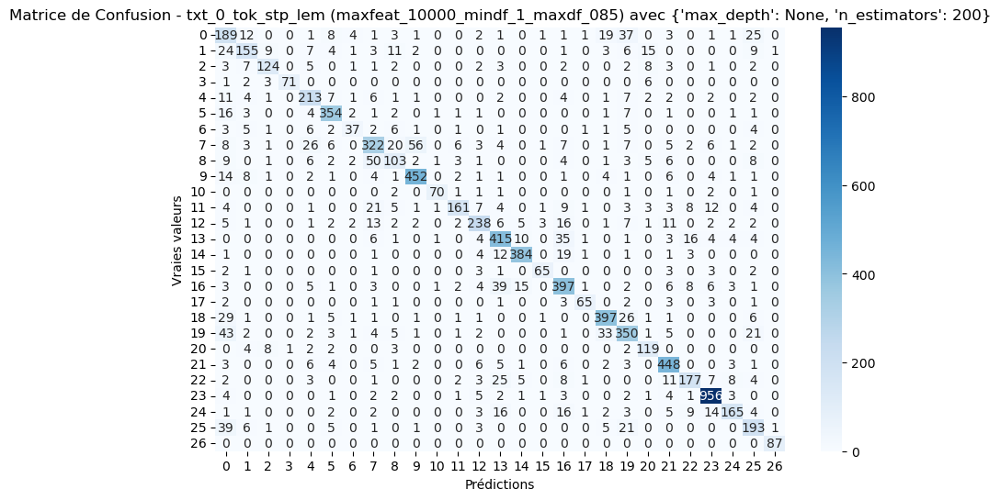


Meilleure configuration Random Forest: txt_0_tok_stp_lem - maxfeat_10000_mindf_1_maxdf_085
F1 Score Weighted sur Validation: 0.7952
Meilleurs hyperparamètres: {'max_depth': None, 'n_estimators': 200}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.45      0.61      0.52       311
          40       0.72      0.62      0.67       251
          50       0.83      0.75      0.78       166
          60       0.99      0.86      0.92        83
        1140       0.73      0.80      0.76       267
        1160       0.87      0.89      0.88       396
        1180       0.71      0.49      0.58        76
        1280       0.71      0.66      0.69       487
        1281       0.60      0.50      0.54       207
        1300       0.86      0.90      0.88       505
        1301       0.93      0.88      0.90        80
        1302       0.88      0.65      0.74       249
        1320       0.81      0.73      0.77       324
  

In [5]:
# Récupération de la meilleure configuration Random Forest
best_rf_row = df_rf_results.iloc[0]
best_rf_col, best_rf_param, best_rf_f1, best_rf_params = best_rf_row

# Chargement des matrices TF-IDF (train et val) pour la meilleure config
X_train_best_rf = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_rf_col, f"X_train_tfidf_{best_rf_param}.npz"))
X_val_best_rf = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_rf_col, f"X_val_tfidf_{best_rf_param}.npz"))

# Entraînement du modèle Random Forest avec les meilleurs hyperparamètres
best_rf_model = RandomForestClassifier(class_weight="balanced", random_state=42, **best_rf_params, n_jobs=-1)
best_rf_model.fit(X_train_best_rf, y_train)

# Prédictions sur les données de validation
y_pred_val_rf = best_rf_model.predict(X_val_best_rf)

# Rapport de classification et matrice de confusion
best_rf_classification_report = classification_report(y_val, y_pred_val_rf)
best_rf_confusion_matrix = confusion_matrix(y_val, y_pred_val_rf)

# Affichage de la matrice de confusion
plt.figure(figsize=(10, 6))
sns.heatmap(best_rf_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - {best_rf_col} ({best_rf_param}) avec {best_rf_params}")
plt.show()

# Résumé des performances sur validation
print(f"\nMeilleure configuration Random Forest: {best_rf_col} - {best_rf_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val_rf, average='weighted'):.4f}")
print(f"Meilleurs hyperparamètres: {best_rf_params}")
print("\nClassification Report sur Validation:\n", best_rf_classification_report)


### Evaluation FR - best vectorisation - Traduit FR

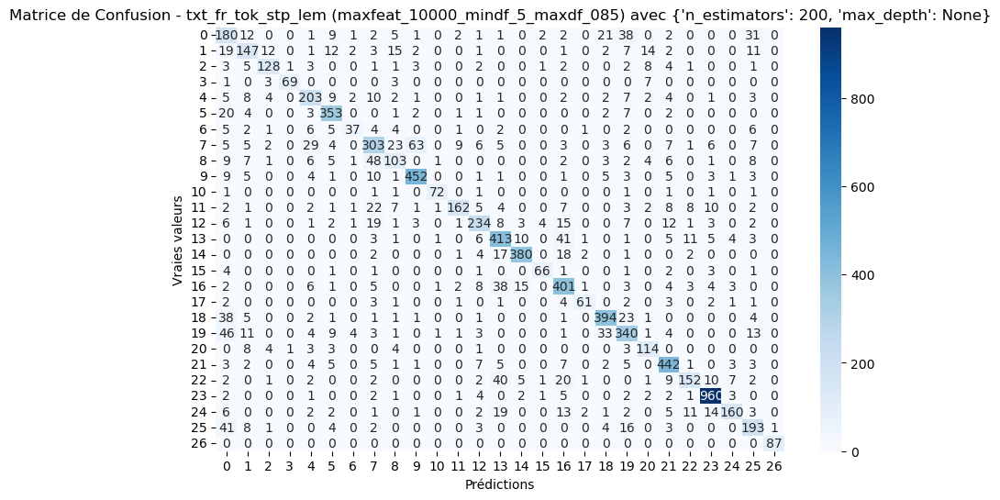


Meilleure configuration Random Forest: txt_fr_tok_stp_lem - maxfeat_10000_mindf_5_maxdf_085
F1 Score Weighted sur Validation: 0.7829
Meilleurs hyperparamètres: {'n_estimators': 200, 'max_depth': None}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.44      0.58      0.50       311
          40       0.64      0.59      0.61       251
          50       0.82      0.77      0.79       166
          60       0.97      0.83      0.90        83
        1140       0.72      0.76      0.74       267
        1160       0.83      0.89      0.86       396
        1180       0.76      0.49      0.59        76
        1280       0.67      0.62      0.64       487
        1281       0.58      0.50      0.54       207
        1300       0.85      0.90      0.87       505
        1301       0.94      0.90      0.92        80
        1302       0.89      0.65      0.75       249
        1320       0.79      0.72      0.76       324
 

In [10]:
# Configuration choisie manuellement pour Random Forest
best_rf_col = "txt_fr_tok_stp_lem"
best_rf_param = "maxfeat_10000_mindf_5_maxdf_085"
best_rf_params = {'n_estimators': 200, 'max_depth': None}

# Chargement des matrices TF-IDF (train et validation)
vectorized_dir = "vectorized_data"
X_train_best_rf = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_rf_col, f"X_train_tfidf_{best_rf_param}.npz"))
X_val_best_rf = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_rf_col, f"X_val_tfidf_{best_rf_param}.npz"))

# Entraînement du modèle avec les hyperparamètres spécifiés
best_rf_model = RandomForestClassifier(class_weight="balanced", random_state=42, **best_rf_params, n_jobs=-1)
best_rf_model.fit(X_train_best_rf, y_train)

# Prédictions sur les données de validation
y_pred_val_rf = best_rf_model.predict(X_val_best_rf)

# Rapport de classification et matrice de confusion
best_rf_classification_report = classification_report(y_val, y_pred_val_rf)
best_rf_confusion_matrix = confusion_matrix(y_val, y_pred_val_rf)

# Affichage de la matrice de confusion
plt.figure(figsize=(10, 6))
sns.heatmap(best_rf_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - {best_rf_col} ({best_rf_param}) avec {best_rf_params}")
plt.show()

# Résumé des performances sur validation
print(f"\nMeilleure configuration Random Forest: {best_rf_col} - {best_rf_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val_rf, average='weighted'):.4f}")
print(f"Meilleurs hyperparamètres: {best_rf_params}")
print("\nClassification Report sur Validation:\n", best_rf_classification_report)


## Logistic Regression

### LR (SGD) - Choix meilleur vectorisation

In [13]:
# Grille d'hyperparamètres pour SGDClassifier
sgd_param_grid = {
    'alpha': [1e-3, 1e-2],
    'penalty': ['l2'],
    'loss': ['log_loss'],
    'max_iter': [1000]
}

# Liste pour stocker les résultats
sgd_results = []

# Dossier des matrices vectorisées
vectorized_dir = "vectorized_data"

# Boucle sur les colonnes textuelles
for col in ["txt_0_tok_stp_lem", "txt_fr_tok_stp_lem"]:
    col_dir = os.path.join(vectorized_dir, col)

    # Boucle sur les fichiers TF-IDF d'entraînement
    for filename in os.listdir(col_dir):
        if filename.startswith("X_train_tfidf_") and filename.endswith(".npz"):
            param_str = filename.replace("X_train_tfidf_", "").replace(".npz", "")

            # Chargement de la matrice TF-IDF
            X_train_tfidf = scipy.sparse.load_npz(os.path.join(col_dir, filename))

            # Initialisation du modèle avec GridSearchCV
            sgd_model = SGDClassifier(class_weight="balanced", random_state=42)
            sgd_grid_search = GridSearchCV(sgd_model, sgd_param_grid, cv=3, scoring='f1_weighted', n_jobs=-1)

            # Entraînement et recherche des meilleurs hyperparamètres
            sgd_grid_search.fit(X_train_tfidf, y_train)

            # Stockage des résultats
            sgd_results.append((col, param_str, sgd_grid_search.best_score_, sgd_grid_search.best_params_))

# Résultats sous forme de DataFrame trié
df_sgd_results = pd.DataFrame(sgd_results, columns=["Text Column", "TF-IDF Params", "F1 Score", "Best Params"])
df_sgd_results = df_sgd_results.sort_values(by="F1 Score", ascending=False)

# Sauvegarde des résultats
df_sgd_results.to_csv("df_sgd_results.csv", index=False)

# Affichage
display(df_sgd_results)


,Text Column,TF-IDF Params,F1 Score,Best Params
0,txt_0_tok_stp_lem,maxfeat_10000_mindf_1_maxdf_085,0.699632,"{'alpha': 0.001, 'loss': 'log_loss', 'max_iter..."
1,txt_0_tok_stp_lem,maxfeat_10000_mindf_1_maxdf_095,0.699632,"{'alpha': 0.001, 'loss': 'log_loss', 'max_iter..."
2,txt_0_tok_stp_lem,maxfeat_10000_mindf_5_maxdf_085,0.699483,"{'alpha': 0.001, 'loss': 'log_loss', 'max_iter..."
3,txt_0_tok_stp_lem,maxfeat_10000_mindf_5_maxdf_095,0.699483,"{'alpha': 0.001, 'loss': 'log_loss', 'max_iter..."
8,txt_fr_tok_stp_lem,maxfeat_10000_mindf_1_maxdf_085,0.692043,"{'alpha': 0.001, 'loss': 'log_loss', 'max_iter..."
9,txt_fr_tok_stp_lem,maxfeat_10000_mindf_1_maxdf_095,0.692043,"{'alpha': 0.001, 'loss': 'log_loss', 'max_iter..."
10,txt_fr_tok_stp_lem,maxfeat_10000_mindf_5_maxdf_085,0.691679,"{'alpha': 0.001, 'loss': 'log_loss', 'max_iter..."
11,txt_fr_tok_stp_lem,maxfeat_10000_mindf_5_maxdf_095,0.691679,"{'alpha': 0.001, 'loss': 'log_loss', 'max_iter..."
4,txt_0_tok_stp_lem,maxfeat_5000_mindf_1_maxdf_085,0.691195,"{'alpha': 0.001, 'loss': 'log_loss', 'max_iter..."
5,txt_0_tok_stp_lem,maxfeat_5000_mindf_1_maxdf_095,0.691195,"{'alpha': 0.001, 'loss': 'log_loss', 'max_iter..."


### Evaluation LR (SGD) - best vectorisation - Non traduit

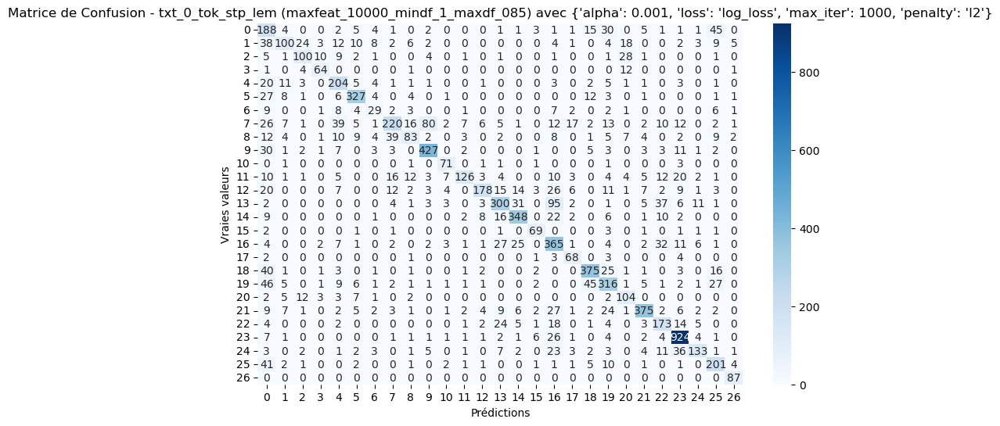


Meilleure configuration SGDClassifier: txt_0_tok_stp_lem - maxfeat_10000_mindf_1_maxdf_085
F1 Score Weighted sur Validation: 0.7052
Meilleurs hyperparamètres: {'alpha': 0.001, 'loss': 'log_loss', 'max_iter': 1000, 'penalty': 'l2'}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.34      0.60      0.43       311
          40       0.63      0.40      0.49       251
          50       0.66      0.60      0.63       166
          60       0.74      0.77      0.75        83
        1140       0.61      0.76      0.68       267
        1160       0.84      0.83      0.83       396
        1180       0.43      0.38      0.41        76
        1280       0.71      0.45      0.55       487
        1281       0.60      0.40      0.48       207
        1300       0.80      0.85      0.82       505
        1301       0.74      0.89      0.81        80
        1302       0.83      0.51      0.63       249
        1320       0.84  

In [14]:
# Chargement des meilleurs résultats SGDClassifier
df_sgd_results = pd.read_csv("df_sgd_results.csv")
best_sgd_row = df_sgd_results.iloc[0]
best_sgd_col, best_sgd_param, best_sgd_f1, best_sgd_params = best_sgd_row

# Chargement des matrices TF-IDF (train et val) pour la meilleure config
vectorized_dir = "vectorized_data"
X_train_best_sgd = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_sgd_col, f"X_train_tfidf_{best_sgd_param}.npz"))
X_val_best_sgd = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_sgd_col, f"X_val_tfidf_{best_sgd_param}.npz"))

# Entraînement du modèle SGDClassifier avec la meilleure configuration
best_sgd_model = SGDClassifier(class_weight="balanced", random_state=42, **eval(best_sgd_params))
best_sgd_model.fit(X_train_best_sgd, y_train)

# Prédictions sur les données de validation
y_pred_val_sgd = best_sgd_model.predict(X_val_best_sgd)

# Rapport de classification et matrice de confusion
best_sgd_classification_report = classification_report(y_val, y_pred_val_sgd)
best_sgd_confusion_matrix = confusion_matrix(y_val, y_pred_val_sgd)

# Affichage de la matrice de confusion
plt.figure(figsize=(10, 6))
sns.heatmap(best_sgd_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - {best_sgd_col} ({best_sgd_param}) avec {best_sgd_params}")
plt.show()

# Résumé des performances sur validation
print(f"\nMeilleure configuration SGDClassifier: {best_sgd_col} - {best_sgd_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val_sgd, average='weighted'):.4f}")
print(f"Meilleurs hyperparamètres: {best_sgd_params}")
print("\nClassification Report sur Validation:\n", best_sgd_classification_report)


### Evaluation LR (SGD) - best vectorisation - Traduit FR

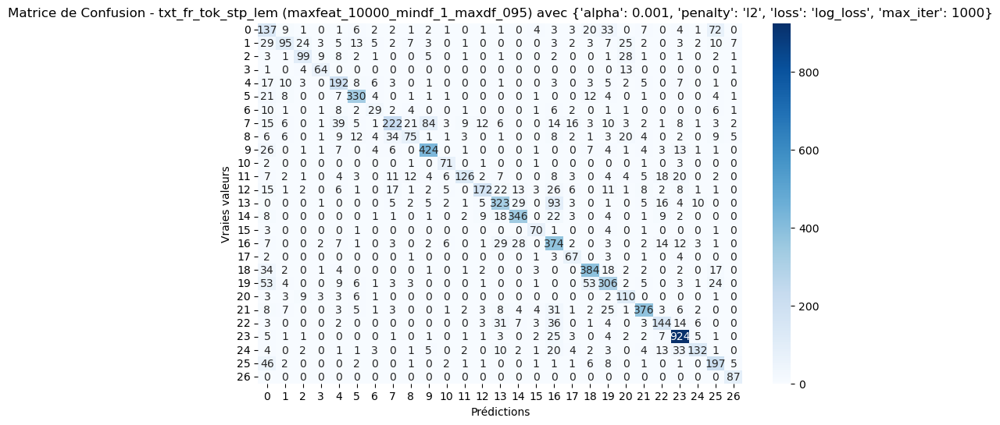


Meilleure configuration SGDClassifier: txt_fr_tok_stp_lem - maxfeat_10000_mindf_1_maxdf_095
F1 Score Weighted sur Validation: 0.6945
Meilleurs hyperparamètres: {'alpha': 0.001, 'penalty': 'l2', 'loss': 'log_loss', 'max_iter': 1000}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.29      0.44      0.35       311
          40       0.60      0.38      0.46       251
          50       0.67      0.60      0.63       166
          60       0.74      0.77      0.75        83
        1140       0.61      0.72      0.66       267
        1160       0.82      0.83      0.82       396
        1180       0.46      0.38      0.42        76
        1280       0.70      0.46      0.55       487
        1281       0.57      0.36      0.44       207
        1300       0.78      0.84      0.81       505
        1301       0.72      0.89      0.79        80
        1302       0.83      0.51      0.63       249
        1320       0.80 

In [17]:
# Configuration manuelle sélectionnée pour SGDClassifier
best_sgd_col = "txt_fr_tok_stp_lem"
best_sgd_param = "maxfeat_10000_mindf_1_maxdf_095"
best_sgd_params = {'alpha': 1e-3, 'penalty': 'l2', 'loss': 'log_loss', 'max_iter': 1000}

# Chargement des matrices TF-IDF (train et validation)
vectorized_dir = "vectorized_data"
X_train_best_sgd = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_sgd_col, f"X_train_tfidf_{best_sgd_param}.npz"))
X_val_best_sgd = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_sgd_col, f"X_val_tfidf_{best_sgd_param}.npz"))

# Entraînement du modèle SGDClassifier avec les meilleurs hyperparamètres
best_sgd_model = SGDClassifier(class_weight="balanced", random_state=42, **best_sgd_params)
best_sgd_model.fit(X_train_best_sgd, y_train)

# Prédictions sur les données de validation
y_pred_val_sgd = best_sgd_model.predict(X_val_best_sgd)

# Rapport de classification et matrice de confusion
best_sgd_classification_report = classification_report(y_val, y_pred_val_sgd)
best_sgd_confusion_matrix = confusion_matrix(y_val, y_pred_val_sgd)

# Affichage de la matrice de confusion
plt.figure(figsize=(10, 6))
sns.heatmap(best_sgd_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - {best_sgd_col} ({best_sgd_param}) avec {best_sgd_params}")
plt.show()

# Résumé des performances sur validation
print(f"\nMeilleure configuration SGDClassifier: {best_sgd_col} - {best_sgd_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val_sgd, average='weighted'):.4f}")
print(f"Meilleurs hyperparamètres: {best_sgd_params}")
print("\nClassification Report sur Validation:\n", best_sgd_classification_report)


# **Vectorisation TF IDF - Resampling** 


## Vectorisation multiples parametres et resampling smote/undersampling

In [7]:
# Dossier de sortie pour les données vectorisées
output_dir = "vectorized_data"
os.makedirs(output_dir, exist_ok=True)

# Colonnes textuelles à vectoriser
text_columns = ["txt_0_tok_stp_lem", "txt_fr_tok_stp_lem"]

# Grille de paramètres TF-IDF : (max_features, min_df, max_df)
param_grid = list(product([5000, 10000], [1, 5], [0.85, 0.95]))

# Nettoyage des textes si encodés en listes de tokens
for col in text_columns:
    if X_train[col].apply(lambda x: isinstance(x, str) and x.startswith("[")).any():
        X_train[col] = X_train[col].apply(lambda x: " ".join(eval(x)) if isinstance(x, str) and x.startswith("[") else x)

# Boucle sur les colonnes textuelles
for col in text_columns:
    col_dir = os.path.join(output_dir, col)
    os.makedirs(col_dir, exist_ok=True)

    # Boucle sur les combinaisons de paramètres TF-IDF
    for max_features, min_df, max_df in param_grid:
        # Initialisation du vectoriseur TF-IDF
        tfidf = TfidfVectorizer(max_features=max_features, min_df=min_df, max_df=max_df)

        # Vectorisation du jeu d'entraînement
        X_train_tfidf = tfidf.fit_transform(X_train[col])

        # Nom des fichiers associés à la config
        param_str = f"maxfeat_{max_features}_mindf_{min_df}_maxdf_{max_df}".replace(".", "")
        raw_filename = os.path.join(col_dir, f"X_train_tfidf_{param_str}.npz")

        # Sauvegarde de la matrice brute TF-IDF
        scipy.sparse.save_npz(raw_filename, X_train_tfidf)

        # Sauvegarde du vocabulaire
        vocab_filename = os.path.join(col_dir, f"vocab_{param_str}.txt")
        with open(vocab_filename, "w", encoding="utf-8") as f:
            for word in tfidf.get_feature_names_out():
                f.write(word + "\n")

        print(f"Vectorisation terminée pour {col} avec {param_str}")

        # Rééquilibrage des classes
        class_counts = Counter(y_train)
        max_count = max(class_counts.values())

        # Définition de la stratégie d'undersampling
        threshold_under = int(max_count * 0.7)
        sampling_strategy_under = {cls: int(count * 0.8) for cls, count in class_counts.items() if count > threshold_under}

        # Définition de la stratégie SMOTE (oversampling)
        sampling_strategy_smote = {}
        for cls, count in class_counts.items():
            if count < 2000:
                sampling_strategy_smote[cls] = 3000
            elif count < int(max_count * 0.4):
                sampling_strategy_smote[cls] = min(4200, count * 2)

        # Application de l'undersampling
        under = RandomUnderSampler(sampling_strategy=sampling_strategy_under, random_state=42)
        X_res, y_res = under.fit_resample(X_train_tfidf, y_train)

        # Application de SMOTE
        smote = SMOTE(sampling_strategy=sampling_strategy_smote, random_state=42)
        X_res, y_res = smote.fit_resample(X_res, y_res)

        # Sauvegarde des matrices rééquilibrées
        resampled_filename = os.path.join(col_dir, f"X_train_tfidf_resampled_{param_str}.npz")
        scipy.sparse.save_npz(resampled_filename, X_res)

        # Sauvegarde des labels rééquilibrés
        y_resampled_filename = os.path.join(col_dir, f"X_train_tfidf_resampled_{param_str}_y.csv")
        pd.Series(y_res).to_csv(y_resampled_filename, index=False, header=False)

        print(f"Rééquilibrage terminé et sauvegardé pour {col} avec {param_str}")

print("Vectorisation et rééquilibrage terminés pour toutes les configurations.")


Vectorisation terminée pour txt_0_tok_stp_lem avec maxfeat_5000_mindf_1_maxdf_085
Rééquilibrage terminé et sauvegardé pour txt_0_tok_stp_lem avec maxfeat_5000_mindf_1_maxdf_085
Vectorisation terminée pour txt_0_tok_stp_lem avec maxfeat_5000_mindf_1_maxdf_095
Rééquilibrage terminé et sauvegardé pour txt_0_tok_stp_lem avec maxfeat_5000_mindf_1_maxdf_095
Vectorisation terminée pour txt_0_tok_stp_lem avec maxfeat_5000_mindf_5_maxdf_085
Rééquilibrage terminé et sauvegardé pour txt_0_tok_stp_lem avec maxfeat_5000_mindf_5_maxdf_085
Vectorisation terminée pour txt_0_tok_stp_lem avec maxfeat_5000_mindf_5_maxdf_095
Rééquilibrage terminé et sauvegardé pour txt_0_tok_stp_lem avec maxfeat_5000_mindf_5_maxdf_095
Vectorisation terminée pour txt_0_tok_stp_lem avec maxfeat_10000_mindf_1_maxdf_085
Rééquilibrage terminé et sauvegardé pour txt_0_tok_stp_lem avec maxfeat_10000_mindf_1_maxdf_085
Vectorisation terminée pour txt_0_tok_stp_lem avec maxfeat_10000_mindf_1_maxdf_095
Rééquilibrage terminé et sauve

## SVM

### SVM - Choix meilleur vectorisation

In [133]:
# Validation croisée stratifiée à 5 folds
cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Dossier contenant les matrices TF-IDF rééquilibrées
vectorized_dir = "vectorized_data"

# Grille d'hyperparamètres (régularisation C)
param_grid = {'C': [0.01, 0.1, 1, 10]}

# Liste pour stocker les résultats
resampled_results = []

# Boucle sur les colonnes textuelles rééquilibrées
for col in ["txt_0_tok_stp_lem", "txt_fr_tok_stp_lem"]:
    col_dir = os.path.join(vectorized_dir, col)

    # Recherche du fichier de labels rééchantillonnés
    y_train_files = [f for f in os.listdir(col_dir) if f.startswith("X_train_tfidf_resampled_") and f.endswith("_y.csv")]
    if not y_train_files:
        print(f"Aucun fichier de labels trouvé pour {col}.")
        continue

    y_train_filepath = os.path.join(col_dir, y_train_files[0])
    y_train_resampled = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

    # Boucle sur les matrices rééchantillonnées
    for filename in os.listdir(col_dir):
        if filename.startswith("X_train_tfidf_resampled_") and filename.endswith(".npz"):
            param_str = filename.replace("X_train_tfidf_resampled_", "").replace(".npz", "")

            # Chargement de la matrice TF-IDF
            X_train_resampled_tfidf = scipy.sparse.load_npz(os.path.join(col_dir, filename))

            # Vérification des dimensions
            print(f"Vérification - {col} | {param_str}")
            print(f"Shape de X : {X_train_resampled_tfidf.shape} | y : {len(y_train_resampled)}")

            if X_train_resampled_tfidf.shape[0] != len(y_train_resampled):
                print(" Incohérence détectée — configuration ignorée.")
                continue

            # Initialisation de GridSearchCV avec LinearSVC
            model = LinearSVC(max_iter=5000, random_state=42)
            grid_search = GridSearchCV(model, param_grid, cv=cv_strategy, scoring='f1_weighted', n_jobs=-1, verbose=1)

            # Exécution de la recherche d'hyperparamètres
            grid_search.fit(X_train_resampled_tfidf, y_train_resampled)

            # Meilleurs résultats
            best_f1 = grid_search.best_score_
            best_params = grid_search.best_params_

            # Stockage des résultats
            resampled_results.append((col, param_str, best_f1, best_params))

# Création du DataFrame trié par F1-score
df_resampled_results = pd.DataFrame(resampled_results, columns=["Text Column", "TF-IDF Params", "F1 Score", "Best Params"])
df_resampled_results = df_resampled_results.sort_values(by="F1 Score", ascending=False)

# Sauvegarde des résultats
df_resampled_results.to_csv("df_resampled_results.csv", index=False)

# Affichage des meilleurs résultats
print(df_resampled_results)

# Meilleure configuration identifiée
best_config = df_resampled_results.iloc[0]
print(f"\nMeilleure configuration : {best_config['Text Column']} - {best_config['TF-IDF Params']}")
print(f"F1 Score : {best_config['F1 Score']:.2f} | Hyperparamètres : {best_config['Best Params']}")


Vérification - txt_0_tok_stp_lem | maxfeat_10000_mindf_1_maxdf_085
Shape de X_train_resampled_tfidf : (95033, 10000)
Taille de y_train_resampled : 95033
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Vérification - txt_0_tok_stp_lem | maxfeat_10000_mindf_1_maxdf_095
Shape de X_train_resampled_tfidf : (95033, 10000)
Taille de y_train_resampled : 95033
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Vérification - txt_0_tok_stp_lem | maxfeat_10000_mindf_5_maxdf_085
Shape de X_train_resampled_tfidf : (95033, 10000)
Taille de y_train_resampled : 95033
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Vérification - txt_0_tok_stp_lem | maxfeat_10000_mindf_5_maxdf_095
Shape de X_train_resampled_tfidf : (95033, 10000)
Taille de y_train_resampled : 95033
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Vérification - txt_0_tok_stp_lem | maxfeat_5000_mindf_1_maxdf_085
Shape de X_train_resampled_tfidf : (95033, 5000)
Taille de y_train_resampled : 950

### Evaluation SVM - best vectorisation - Non traduit

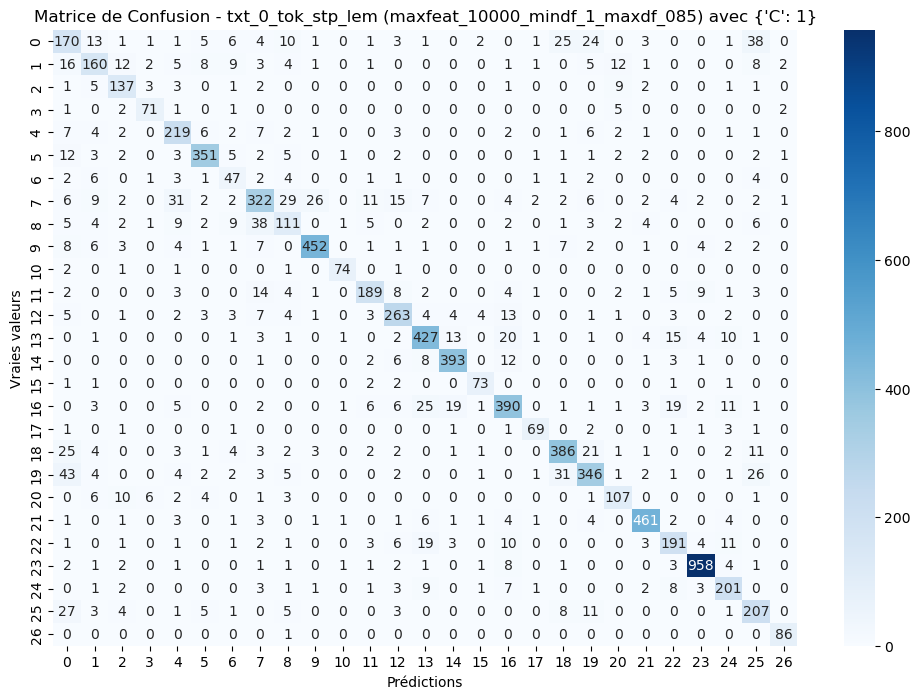


Meilleure configuration: txt_0_tok_stp_lem - maxfeat_10000_mindf_1_maxdf_085
F1 Score Weighted sur Validation: 0.8141
Meilleurs hyperparamètres: {'C': 1}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.50      0.55      0.52       311
          40       0.68      0.64      0.66       251
          50       0.74      0.83      0.78       166
          60       0.84      0.86      0.85        83
        1140       0.72      0.82      0.77       267
        1160       0.90      0.89      0.89       396
        1180       0.48      0.62      0.54        76
        1280       0.75      0.66      0.70       487
        1281       0.57      0.54      0.55       207
        1300       0.93      0.90      0.91       505
        1301       0.93      0.93      0.93        80
        1302       0.83      0.76      0.79       249
        1320       0.79      0.81      0.80       324
        1560       0.83      0.85      0.84     

In [135]:
# Dossier contenant les matrices rééchantillonnées
vectorized_dir = "vectorized_data"

# Chargement des résultats de recherche d'hyperparamètres
df_resampled_results = pd.read_csv("df_resampled_results.csv")
best_row = df_resampled_results.iloc[0]

# Extraction de la meilleure configuration
best_col = best_row["Text Column"]
best_param = best_row["TF-IDF Params"]
best_f1 = best_row["F1 Score"]
best_params = eval(best_row["Best Params"])

# Chargement des matrices TF-IDF (train rééchantillonné et validation)
X_train_best = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_col, f"X_train_tfidf_resampled_{best_param}.npz"))
X_val_best = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_col, f"X_val_tfidf_{best_param}.npz"))

# Chargement des labels d'entraînement rééchantillonnés
y_train_filepath = os.path.join(vectorized_dir, best_col, f"X_train_tfidf_resampled_{best_param}_y.csv")
y_train_resampled = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

# Entraînement du modèle avec les meilleurs hyperparamètres
best_model = LinearSVC(max_iter=5000, random_state=42, **best_params)
best_model.fit(X_train_best, y_train_resampled)

# Prédictions sur l'ensemble de validation
y_pred_val = best_model.predict(X_val_best)

# Rapport de classification et matrice de confusion
best_classification_report = classification_report(y_val, y_pred_val)
best_confusion_matrix = confusion_matrix(y_val, y_pred_val)

# Affichage de la matrice de confusion
plt.figure(figsize=(12, 8))
sns.heatmap(best_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - {best_col} ({best_param}) avec {best_params}")
plt.show()

# Résumé des performances sur validation
print(f"\nMeilleure configuration: {best_col} - {best_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val, average='weighted'):.4f}")
print(f"Meilleurs hyperparamètres: {best_params}")
print("\nClassification Report sur Validation:\n", best_classification_report)


### Evaluation SVM - best vectorisation - Traduit FR

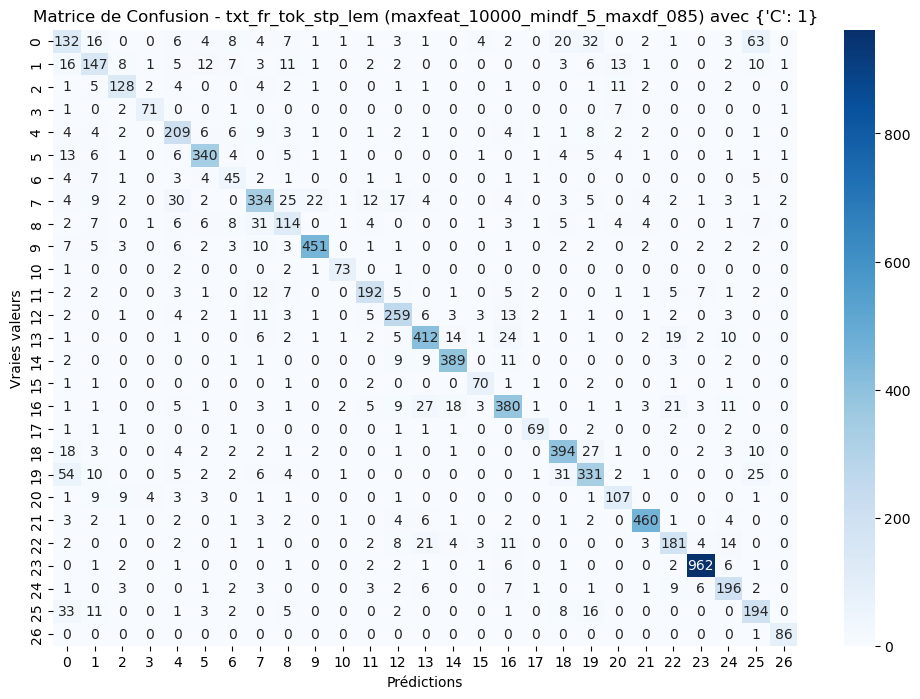


Meilleure configuration: txt_fr_tok_stp_lem - maxfeat_10000_mindf_5_maxdf_085
F1 Score Weighted sur Validation: 0.7982
Meilleurs hyperparamètres: {'C': 1}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.43      0.42      0.43       311
          40       0.60      0.59      0.59       251
          50       0.78      0.77      0.78       166
          60       0.90      0.86      0.88        83
        1140       0.68      0.78      0.73       267
        1160       0.87      0.86      0.86       396
        1180       0.47      0.59      0.53        76
        1280       0.75      0.69      0.72       487
        1281       0.57      0.55      0.56       207
        1300       0.93      0.89      0.91       505
        1301       0.89      0.91      0.90        80
        1302       0.82      0.77      0.79       249
        1320       0.77      0.80      0.78       324
        1560       0.83      0.82      0.82    

In [137]:
# Dossier des données vectorisées rééchantillonnées
vectorized_dir = "vectorized_data"

# Chargement des résultats sauvegardés (non utilisé ici mais disponible)
df_resampled_results = pd.read_csv("df_resampled_results.csv")

# Configuration manuelle sélectionnée
best_col = "txt_fr_tok_stp_lem"
best_param = "maxfeat_10000_mindf_5_maxdf_085"
best_params = {'C': 1}

# Chargement des matrices TF-IDF (train rééchantillonné et validation)
X_train_best = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_col, f"X_train_tfidf_resampled_{best_param}.npz"))
X_val_best = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_col, f"X_val_tfidf_{best_param}.npz"))

# Chargement des labels rééchantillonnés
y_train_filepath = os.path.join(vectorized_dir, best_col, f"X_train_tfidf_resampled_{best_param}_y.csv")
y_train_resampled = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

# Entraînement du modèle avec la meilleure configuration
best_model = LinearSVC(max_iter=5000, random_state=42, **best_params)
best_model.fit(X_train_best, y_train_resampled)

# Prédictions sur les données de validation
y_pred_val = best_model.predict(X_val_best)

# Rapport de classification et matrice de confusion
best_classification_report = classification_report(y_val, y_pred_val)
best_confusion_matrix = confusion_matrix(y_val, y_pred_val)

# Affichage de la matrice de confusion
plt.figure(figsize=(12, 8))
sns.heatmap(best_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - {best_col} ({best_param}) avec {best_params}")
plt.show()

# Résumé des performances sur validation
print(f"\nMeilleure configuration: {best_col} - {best_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val, average='weighted'):.4f}")
print(f"Meilleurs hyperparamètres: {best_params}")
print("\nClassification Report sur Validation:\n", best_classification_report)


## RF

### RF - Choix meilleur vectorisation

In [139]:
# Validation croisée stratifiée (5 folds)
cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Dossier des matrices vectorisées rééchantillonnées
vectorized_dir = "vectorized_data"

# Grille d'hyperparamètres pour Random Forest
rf_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, None]
}

# Liste des résultats
rf_resampled_results = []

# Boucle sur les colonnes textuelles
for col in ["txt_0_tok_stp_lem", "txt_fr_tok_stp_lem"]:
    col_dir = os.path.join(vectorized_dir, col)

    # Recherche du fichier contenant les labels rééchantillonnés
    y_train_files = [f for f in os.listdir(col_dir) if f.endswith("_y.csv")]
    if not y_train_files:
        print(f"Aucun fichier de labels trouvé pour {col}.")
        continue

    y_train_filepath = os.path.join(col_dir, y_train_files[0])
    y_train_resampled = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

    # Boucle sur les matrices rééchantillonnées
    for filename in os.listdir(col_dir):
        if filename.startswith("X_train_tfidf_resampled_") and filename.endswith(".npz"):
            param_str = filename.replace("X_train_tfidf_resampled_", "").replace(".npz", "")

            # Chargement de la matrice TF-IDF
            X_train_resampled_tfidf = scipy.sparse.load_npz(os.path.join(col_dir, filename))

            # Initialisation de GridSearchCV avec RandomForestClassifier
            rf_model = RandomForestClassifier(random_state=42, n_jobs=-1)
            grid_search_rf = GridSearchCV(
                rf_model,
                rf_param_grid,
                cv=cv_strategy,
                scoring='f1_weighted',
                n_jobs=-1,
                verbose=1
            )

            # Entraînement du modèle
            grid_search_rf.fit(X_train_resampled_tfidf, y_train_resampled)

            # Meilleurs résultats
            best_rf_f1 = grid_search_rf.best_score_
            best_rf_params = grid_search_rf.best_params_

            # Stockage
            rf_resampled_results.append((col, param_str, best_rf_f1, best_rf_params))

# Compilation des résultats dans un DataFrame
df_rf_resampled_results = pd.DataFrame(
    rf_resampled_results,
    columns=["Text Column", "TF-IDF Params", "F1 Score", "Best Params"]
)

# Tri des résultats par F1-score décroissant
df_rf_resampled_results = df_rf_resampled_results.sort_values(by="F1 Score", ascending=False)

# Sauvegarde des résultats
df_rf_resampled_results.to_csv("df_rf_resampled_results.csv", index=False)

# Affichage du tableau complet
print(df_rf_resampled_results)

# Affichage de la meilleure configuration
best_rf_config = df_rf_resampled_results.iloc[0]
print(f"\nMeilleure configuration Random Forest : {best_rf_config['Text Column']} - {best_rf_config['TF-IDF Params']}")
print(f"F1 Score : {best_rf_config['F1 Score']:.2f} | Hyperparamètres : {best_rf_config['Best Params']}")


Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
           Text Column                  

### Evaluation RF - best vectorisation - Non traduit

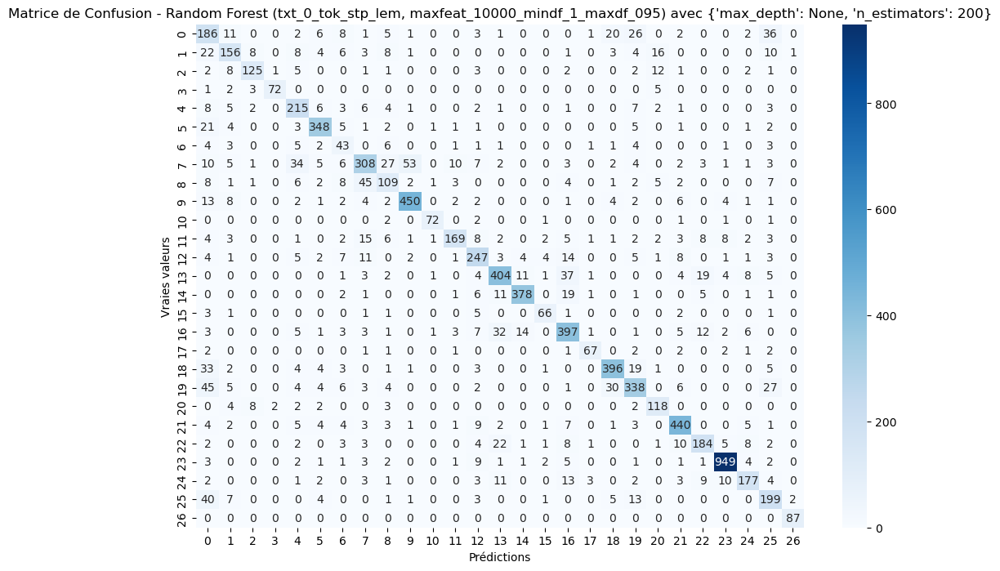


Meilleure configuration Random Forest: txt_0_tok_stp_lem - maxfeat_10000_mindf_1_maxdf_095
F1 Score Weighted sur Validation: 0.7967
Meilleurs hyperparamètres: {'max_depth': None, 'n_estimators': 200}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.44      0.60      0.51       311
          40       0.68      0.62      0.65       251
          50       0.84      0.75      0.80       166
          60       0.96      0.87      0.91        83
        1140       0.69      0.81      0.74       267
        1160       0.87      0.88      0.88       396
        1180       0.38      0.57      0.46        76
        1280       0.74      0.63      0.68       487
        1281       0.57      0.53      0.55       207
        1300       0.88      0.89      0.88       505
        1301       0.94      0.90      0.92        80
        1302       0.87      0.68      0.76       249
        1320       0.75      0.76      0.75       324
  

In [140]:
# Dossier des matrices vectorisées rééchantillonnées
vectorized_dir = "vectorized_data"

# Chargement des meilleurs résultats (Random Forest)
df_resampled_results = pd.read_csv("df_rf_resampled_results.csv")
best_row = df_resampled_results.iloc[0]

# Récupération de la meilleure configuration
best_col = best_row["Text Column"]
best_param = best_row["TF-IDF Params"]
best_f1 = best_row["F1 Score"]
best_params = eval(best_row["Best Params"])

# Extraction des hyperparamètres
n_estimators = best_params.get("n_estimators", 200)
max_depth = best_params.get("max_depth", None)

# Chargement des matrices TF-IDF (train et val)
X_train_best = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_col, f"X_train_tfidf_resampled_{best_param}.npz"))
X_val_best = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_col, f"X_val_tfidf_{best_param}.npz"))

# Chargement des labels d'entraînement rééchantillonnés
y_train_filepath = os.path.join(vectorized_dir, best_col, f"X_train_tfidf_resampled_{best_param}_y.csv")
y_train_resampled = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

# Entraînement du modèle Random Forest
best_model = RandomForestClassifier(n_estimators=n_estimators, max_depth=max_depth, random_state=42, n_jobs=-1)
best_model.fit(X_train_best, y_train_resampled)

# Prédictions sur les données de validation
y_pred_val = best_model.predict(X_val_best)

# Rapport de classification et matrice de confusion
best_classification_report = classification_report(y_val, y_pred_val)
best_confusion_matrix = confusion_matrix(y_val, y_pred_val)

# Affichage de la matrice de confusion
plt.figure(figsize=(12, 8))
sns.heatmap(best_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - Random Forest ({best_col}, {best_param}) avec {best_params}")
plt.show()

# Résumé des performances
print(f"\nMeilleure configuration Random Forest: {best_col} - {best_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val, average='weighted'):.4f}")
print(f"Meilleurs hyperparamètres: {best_params}")
print("\nClassification Report sur Validation:\n", best_classification_report)


### Evaluation RF - best vectorisation - Traduit FR

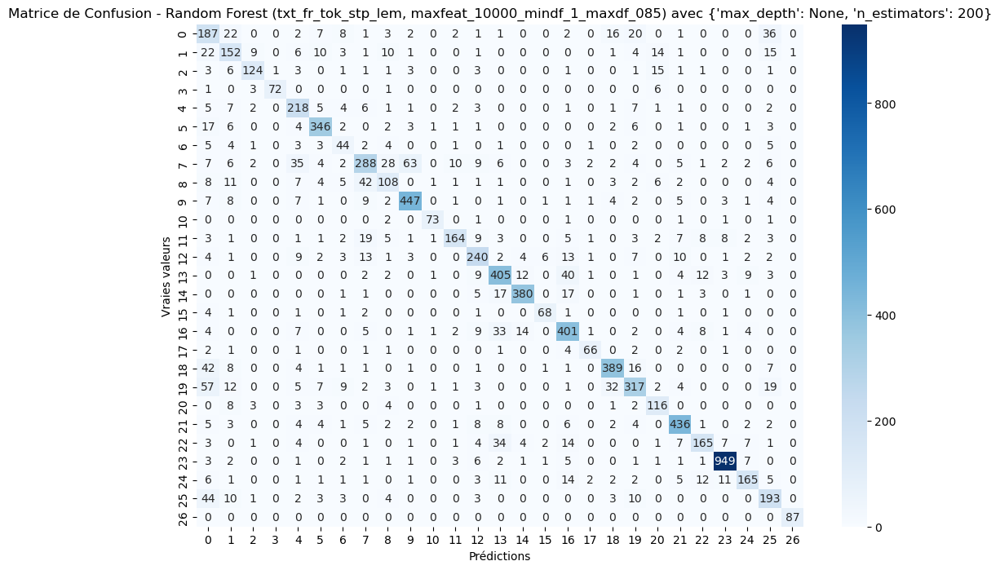


Meilleure configuration Random Forest: txt_fr_tok_stp_lem - maxfeat_10000_mindf_1_maxdf_085
F1 Score Weighted sur Validation: 0.7843
Meilleurs hyperparamètres: {'max_depth': None, 'n_estimators': 200}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.43      0.60      0.50       311
          40       0.56      0.61      0.58       251
          50       0.84      0.75      0.79       166
          60       0.99      0.87      0.92        83
        1140       0.66      0.82      0.73       267
        1160       0.86      0.87      0.87       396
        1180       0.47      0.58      0.52        76
        1280       0.71      0.59      0.65       487
        1281       0.58      0.52      0.55       207
        1300       0.84      0.89      0.86       505
        1301       0.92      0.91      0.92        80
        1302       0.86      0.66      0.75       249
        1320       0.75      0.74      0.74       324
 

In [142]:
# Dossier contenant les matrices rééchantillonnées
vectorized_dir = "vectorized_data"

# Chargement des résultats sauvegardés (Random Forest)
df_resampled_results = pd.read_csv("df_rf_resampled_results.csv")
best_row = df_resampled_results.iloc[0]

# Définition manuelle de la configuration (colonne et TF-IDF params)
best_col = "txt_fr_tok_stp_lem"
best_param = "maxfeat_10000_mindf_1_maxdf_085"

# Extraction des meilleurs hyperparamètres
best_params = eval(best_row["Best Params"])
n_estimators = best_params.get("n_estimators", 200)
max_depth = best_params.get("max_depth", None)

# Chargement des matrices TF-IDF (train et validation)
X_train_best = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_col, f"X_train_tfidf_resampled_{best_param}.npz"))
X_val_best = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_col, f"X_val_tfidf_{best_param}.npz"))

# Chargement des labels d'entraînement rééchantillonnés
y_train_filepath = os.path.join(vectorized_dir, best_col, f"X_train_tfidf_resampled_{best_param}_y.csv")
y_train_resampled = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

# Entraînement du modèle Random Forest
best_model = RandomForestClassifier(n_estimators=n_estimators, max_depth=max_depth, random_state=42, n_jobs=-1)
best_model.fit(X_train_best, y_train_resampled)

# Prédictions sur les données de validation
y_pred_val = best_model.predict(X_val_best)

# Rapport de classification et matrice de confusion
best_classification_report = classification_report(y_val, y_pred_val)
best_confusion_matrix = confusion_matrix(y_val, y_pred_val)

# Affichage de la matrice de confusion
plt.figure(figsize=(12, 8))
sns.heatmap(best_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - Random Forest ({best_col}, {best_param}) avec {best_params}")
plt.show()

# Résumé des performances
print(f"\nMeilleure configuration Random Forest: {best_col} - {best_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val, average='weighted'):.4f}")
print(f"Meilleurs hyperparamètres: {best_params}")
print("\nClassification Report sur Validation:\n", best_classification_report)


## Logistic Regression

### LR (SGD) - Choix meilleur vectorisation

In [143]:
# Validation croisée stratifiée (5 folds)
cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Dossier des matrices vectorisées rééchantillonnées
vectorized_dir = "vectorized_data"

# Grille d'hyperparamètres pour SGDClassifier (régression logistique)
sgd_param_grid = {
    'alpha': [1e-4, 1e-3],
    'max_iter': [1000, 5000]
}

# Liste des résultats
sgd_resampled_results = []

# Boucle sur les colonnes textuelles
for col in ["txt_0_tok_stp_lem", "txt_fr_tok_stp_lem"]:
    col_dir = os.path.join(vectorized_dir, col)

    # Recherche du fichier contenant les labels rééchantillonnés
    y_train_files = [f for f in os.listdir(col_dir) if f.endswith("_y.csv")]
    if not y_train_files:
        print(f"Aucun fichier de labels trouvé pour {col}.")
        continue

    y_train_filepath = os.path.join(col_dir, y_train_files[0])
    y_train_resampled = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

    # Boucle sur les matrices rééchantillonnées
    for filename in os.listdir(col_dir):
        if filename.startswith("X_train_tfidf_resampled_") and filename.endswith(".npz"):
            param_str = filename.replace("X_train_tfidf_resampled_", "").replace(".npz", "")

            # Chargement de la matrice TF-IDF
            X_train_resampled_tfidf = scipy.sparse.load_npz(os.path.join(col_dir, filename))

            # Initialisation de GridSearchCV avec SGDClassifier (log_loss)
            sgd_model = SGDClassifier(loss="log_loss", penalty="l2", random_state=42)
            grid_search_sgd = GridSearchCV(
                sgd_model,
                sgd_param_grid,
                cv=cv_strategy,
                scoring='f1_weighted',
                n_jobs=-1,
                verbose=1
            )

            # Entraînement et recherche des meilleurs hyperparamètres
            grid_search_sgd.fit(X_train_resampled_tfidf, y_train_resampled)

            # Meilleurs résultats
            best_sgd_f1 = grid_search_sgd.best_score_
            best_sgd_params = grid_search_sgd.best_params_

            # Stockage
            sgd_resampled_results.append((col, param_str, best_sgd_f1, best_sgd_params))

# Compilation des résultats dans un DataFrame
df_sgd_resampled_results = pd.DataFrame(
    sgd_resampled_results,
    columns=["Text Column", "TF-IDF Params", "F1 Score", "Best Params"]
)

# Tri par F1-score décroissant
df_sgd_resampled_results = df_sgd_resampled_results.sort_values(by="F1 Score", ascending=False)

# Sauvegarde des résultats
df_sgd_resampled_results.to_csv("df_sgd_resampled_results.csv", index=False)

# Affichage du tableau complet
print(df_sgd_resampled_results)

# Affichage de la meilleure configuration
best_sgd_config = df_sgd_resampled_results.iloc[0]
print(f"\nMeilleure configuration SGDClassifier : {best_sgd_config['Text Column']} - {best_sgd_config['TF-IDF Params']}")
print(f"F1 Score : {best_sgd_config['F1 Score']:.2f} | Hyperparamètres : {best_sgd_config['Best Params']}")


Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
           Text Column                  

### Evaluation LR (SGD) - best vectorisation - Non traduit

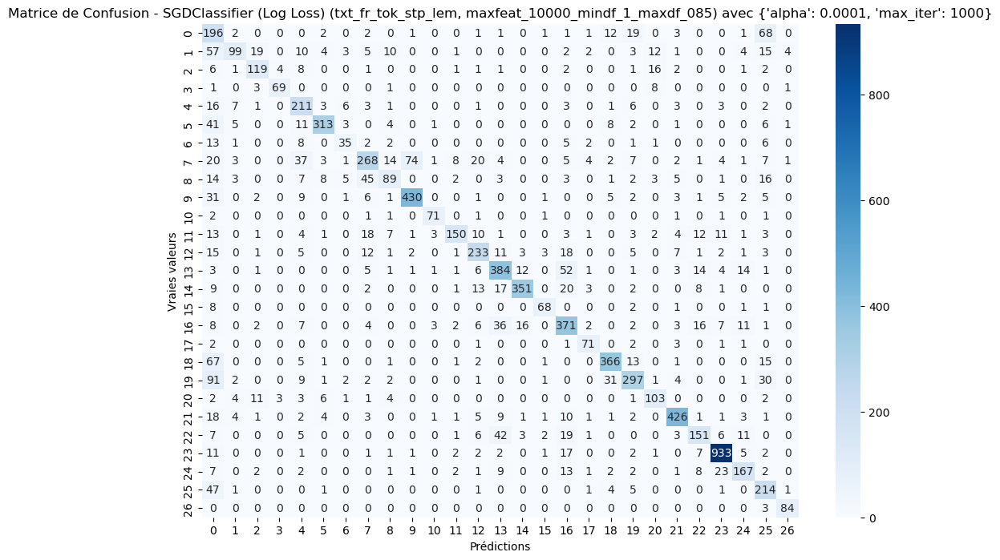


Meilleure configuration SGDClassifier (Régression Logistique): txt_fr_tok_stp_lem - maxfeat_10000_mindf_1_maxdf_085
F1 Score Weighted sur Validation: 0.7494
Meilleurs hyperparamètres: {'alpha': 0.0001, 'max_iter': 1000}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.28      0.63      0.39       311
          40       0.75      0.39      0.52       251
          50       0.73      0.72      0.72       166
          60       0.91      0.83      0.87        83
        1140       0.61      0.79      0.69       267
        1160       0.90      0.79      0.84       396
        1180       0.61      0.46      0.53        76
        1280       0.70      0.55      0.62       487
        1281       0.63      0.43      0.51       207
        1300       0.84      0.85      0.85       505
        1301       0.88      0.89      0.88        80
        1302       0.86      0.60      0.71       249
        1320       0.75      0.72   

In [144]:
# Dossier des matrices vectorisées rééchantillonnées
vectorized_dir = "vectorized_data"

# Chargement des résultats de GridSearch (SGDClassifier)
df_resampled_results = pd.read_csv("df_sgd_resampled_results.csv")
best_row = df_resampled_results.iloc[0]

# Récupération de la meilleure configuration
best_col = best_row["Text Column"]
best_param = best_row["TF-IDF Params"]
best_f1 = best_row["F1 Score"]
best_params = eval(best_row["Best Params"])

# Extraction des hyperparamètres
alpha = best_params.get("alpha", 1e-4)
max_iter = best_params.get("max_iter", 1000)

# Chargement des matrices TF-IDF (train et validation)
X_train_best = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_col, f"X_train_tfidf_resampled_{best_param}.npz"))
X_val_best = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_col, f"X_val_tfidf_{best_param}.npz"))

# Chargement des labels d'entraînement rééchantillonnés
y_train_filepath = os.path.join(vectorized_dir, best_col, f"X_train_tfidf_resampled_{best_param}_y.csv")
y_train_resampled = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

# Entraînement du modèle SGDClassifier (régression logistique)
best_model = SGDClassifier(loss="log_loss", alpha=alpha, max_iter=max_iter, penalty="l2", random_state=42)
best_model.fit(X_train_best, y_train_resampled)

# Prédictions sur les données de validation
y_pred_val = best_model.predict(X_val_best)

# Rapport de classification et matrice de confusion
best_classification_report = classification_report(y_val, y_pred_val)
best_confusion_matrix = confusion_matrix(y_val, y_pred_val)

# Affichage de la matrice de confusion
plt.figure(figsize=(12, 8))
sns.heatmap(best_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - SGDClassifier (Log Loss) ({best_col}, {best_param}) avec {best_params}")
plt.show()

# Résumé des performances
print(f"\nMeilleure configuration SGDClassifier (Régression Logistique): {best_col} - {best_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val, average='weighted'):.4f}")
print(f"Meilleurs hyperparamètres: {best_params}")
print("\nClassification Report sur Validation:\n", best_classification_report)


### Evaluation LR (SGD) - best vectorisation - Traduit FR

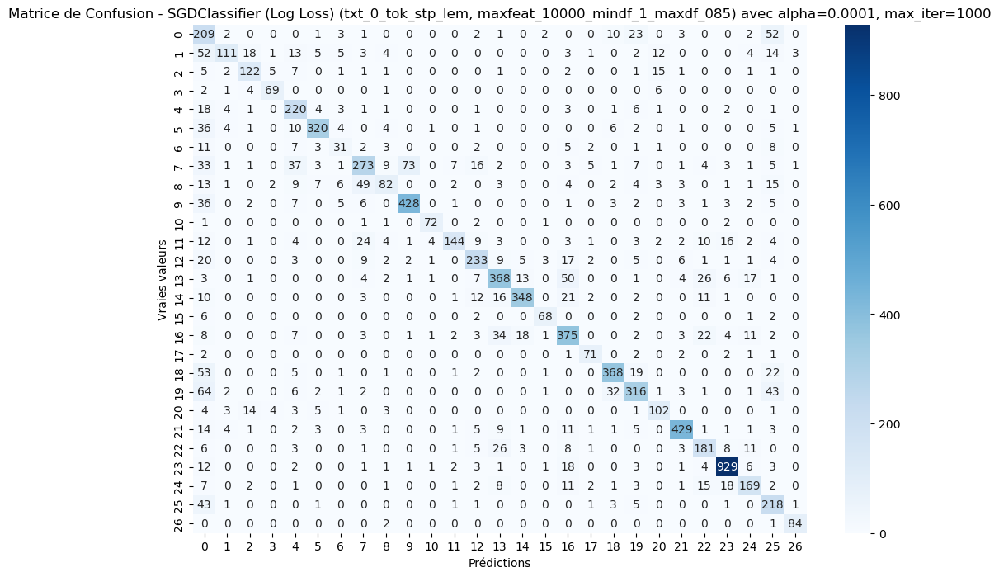


Meilleure configuration SGDClassifier (Régression Logistique): txt_0_tok_stp_lem - maxfeat_10000_mindf_1_maxdf_085
F1 Score Weighted sur Validation: 0.7572
Meilleurs hyperparamètres: alpha=0.0001, max_iter=1000

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.31      0.67      0.42       311
          40       0.82      0.44      0.57       251
          50       0.73      0.73      0.73       166
          60       0.85      0.83      0.84        83
        1140       0.64      0.82      0.72       267
        1160       0.90      0.81      0.85       396
        1180       0.50      0.41      0.45        76
        1280       0.71      0.56      0.62       487
        1281       0.67      0.40      0.50       207
        1300       0.84      0.85      0.85       505
        1301       0.89      0.90      0.89        80
        1302       0.88      0.58      0.70       249
        1320       0.76      0.72      0.74  

In [146]:
# Dossier des matrices rééchantillonnées
vectorized_dir = "vectorized_data"

# Chargement des résultats (SGDClassifier)
df_resampled_results = pd.read_csv("df_sgd_resampled_results.csv")
best_row = df_resampled_results.iloc[0]

# Configuration manuelle pour le texte traduit
best_col = "txt_0_tok_stp_lem"
best_param = "maxfeat_10000_mindf_1_maxdf_085"

# Hyperparamètres retenus (manuellement définis ici)
alpha = 1e-4
max_iter = 1000

# Chargement des matrices TF-IDF (train + val)
X_train_best = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_col, f"X_train_tfidf_resampled_{best_param}.npz"))
X_val_best = scipy.sparse.load_npz(os.path.join(vectorized_dir, best_col, f"X_val_tfidf_{best_param}.npz"))

# Chargement des labels d'entraînement rééchantillonnés
y_train_filepath = os.path.join(vectorized_dir, best_col, f"X_train_tfidf_resampled_{best_param}_y.csv")
y_train_resampled = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

# Entraînement du modèle SGDClassifier (régression logistique)
best_model = SGDClassifier(loss="log_loss", alpha=alpha, max_iter=max_iter, penalty="l2", random_state=42)
best_model.fit(X_train_best, y_train_resampled)

# Prédictions sur la validation
y_pred_val = best_model.predict(X_val_best)

# Rapport de classification et matrice de confusion
best_classification_report = classification_report(y_val, y_pred_val)
best_confusion_matrix = confusion_matrix(y_val, y_pred_val)

# Affichage de la matrice de confusion
plt.figure(figsize=(12, 8))
sns.heatmap(best_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - SGDClassifier (Log Loss) ({best_col}, {best_param})\nalpha={alpha}, max_iter={max_iter}")
plt.show()

# Résumé des performances
print(f"\nMeilleure configuration SGDClassifier (Régression Logistique): {best_col} - {best_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val, average='weighted'):.4f}")
print(f"Meilleurs hyperparamètres: alpha={alpha}, max_iter={max_iter}")
print("\nClassification Report sur Validation:\n", best_classification_report)


# **Vectorisation Fasttext - No Resampling**

## Vectorisation multiples paramètres

In [173]:
# Colonnes textuelles à vectoriser
text_columns = ["txt_0_tok_stp_lem", "txt_fr_tok_stp_lem"]

# Grille de paramètres FastText (modèle, dim, epoch, minCount, wordNgrams)
param_grid = list(product(["skipgram"], [50, 100], [5], [2], [1, 2]))

# Dossier de sortie pour les embeddings
output_dir = "vectorized_data_fasttext"
os.makedirs(output_dir, exist_ok=True)

# Correction du format des textes (listes → chaînes)
for col in text_columns:
    if X_train[col].apply(lambda x: isinstance(x, str) and x.startswith("[")).any():
        X_train[col] = X_train[col].apply(lambda x: " ".join(eval(x)) if isinstance(x, str) else x)
        X_val[col] = X_val[col].apply(lambda x: " ".join(eval(x)) if isinstance(x, str) else x)

# Boucle sur les colonnes textuelles
for col in text_columns:
    col_dir = os.path.join(output_dir, col)
    os.makedirs(col_dir, exist_ok=True)

    # Sauvegarde des textes d'entraînement pour FastText
    train_text_file = os.path.join(col_dir, "train_texts.txt")
    X_train[col].to_csv(train_text_file, index=False, header=False)

    # Boucle sur les combinaisons de paramètres
    for model_type, dim, epoch, min_count, word_ngrams in param_grid:
        print(f"Entraînement FastText: {model_type}, dim={dim}, epoch={epoch}, minCount={min_count}, wordNgrams={word_ngrams}")

        # Entraînement du modèle FastText
        fasttext_model = fasttext.train_unsupervised(
            input=train_text_file,
            model=model_type,
            dim=dim,
            epoch=epoch,
            minCount=min_count,
            wordNgrams=word_ngrams
        )

        # Nom des fichiers liés à la configuration
        param_str = f"{model_type}_dim{dim}_epoch{epoch}_minCount{min_count}_ngrams{word_ngrams}"

        # Sauvegarde du modèle FastText
        fasttext_model.save_model(os.path.join(col_dir, f"fasttext_{param_str}.bin"))

        # Fonction de vectorisation moyenne sur les mots présents
        def get_fasttext_vector(text):
            words = text.split()
            vectors = [fasttext_model.get_word_vector(word) for word in words if word in fasttext_model.words]
            return np.mean(vectors, axis=0) if vectors else np.zeros(fasttext_model.get_dimension())

        # Vectorisation des ensembles train / val / test
        X_train_vectors = np.vstack(X_train[col].apply(get_fasttext_vector))
        X_val_vectors = np.vstack(X_val[col].apply(get_fasttext_vector))
        X_test_vectors = np.vstack(X_test[col].apply(get_fasttext_vector))

        # Sauvegarde des vecteurs
        np.save(os.path.join(col_dir, f"X_train_fasttext_{param_str}.npy"), X_train_vectors)
        np.save(os.path.join(col_dir, f"X_val_fasttext_{param_str}.npy"), X_val_vectors)
        np.save(os.path.join(col_dir, f"X_test_fasttext_{param_str}.npy"), X_test_vectors)

print("Vectorisation FastText optimisée terminée et fichiers enregistrés.")


Entraînement FastText: skipgram, dim=50, epoch=5, minCount=2, wordNgrams=1
Entraînement FastText: skipgram, dim=50, epoch=5, minCount=2, wordNgrams=2
Entraînement FastText: skipgram, dim=100, epoch=5, minCount=2, wordNgrams=1
Entraînement FastText: skipgram, dim=100, epoch=5, minCount=2, wordNgrams=2
Entraînement FastText: skipgram, dim=50, epoch=5, minCount=2, wordNgrams=1
Entraînement FastText: skipgram, dim=50, epoch=5, minCount=2, wordNgrams=2
Entraînement FastText: skipgram, dim=100, epoch=5, minCount=2, wordNgrams=1
Entraînement FastText: skipgram, dim=100, epoch=5, minCount=2, wordNgrams=2
Vectorisation FastText optimisée terminée et fichiers enregistrés.


## SVM

### SVM - Choix meilleur vectorisation

In [155]:
# Dossier des vecteurs FastText
vectorized_dir = "vectorized_data_fasttext"

# Grille d'hyperparamètres pour LinearSVC
param_grid = {'C': [0.01, 0.1, 1, 10]}

# Liste pour stocker les résultats
results = []

# Boucle sur les colonnes textuelles
for col in ["txt_0_tok_stp_lem", "txt_fr_tok_stp_lem"]:
    col_dir = os.path.join(vectorized_dir, col)

    # Boucle sur les fichiers de vecteurs FastText
    for filename in os.listdir(col_dir):
        if filename.startswith("X_train_fasttext_") and filename.endswith(".npy"):
            param_str = filename.replace("X_train_fasttext_", "").replace(".npy", "")

            # Chargement des embeddings FastText
            X_train_fasttext = np.load(os.path.join(col_dir, filename))

            # Initialisation du modèle avec GridSearchCV
            model = LinearSVC(class_weight='balanced', max_iter=5000, random_state=42)
            grid_search = GridSearchCV(model, param_grid, cv=5, scoring='f1_weighted', n_jobs=-1)

            # Entraînement et recherche des meilleurs hyperparamètres
            grid_search.fit(X_train_fasttext, y_train)

            # Récupération des meilleurs résultats
            best_f1 = grid_search.best_score_
            best_params = grid_search.best_params_

            # Stockage
            results.append((col, param_str, best_f1, best_params))

# Compilation des résultats dans un DataFrame
df_results = pd.DataFrame(results, columns=["Text Column", "FastText Params", "F1 Score", "Best Params"])
df_results = df_results.sort_values(by="F1 Score", ascending=False)

# Sauvegarde et affichage
df_results.to_csv("df_results_fasttext.csv", index=False)
display(df_results)

print("Recherche de la meilleure vectorisation FastText terminée.")


,Text Column,FastText Params,F1 Score,Best Params
0,txt_0_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams1,0.704486,{'C': 10}
1,txt_0_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams2,0.703786,{'C': 10}
5,txt_fr_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams2,0.696660,{'C': 10}
4,txt_fr_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams1,0.694997,{'C': 10}
3,txt_0_tok_stp_lem,skipgram_dim50_epoch5_minCount2_ngrams2,0.671188,{'C': 10}
2,txt_0_tok_stp_lem,skipgram_dim50_epoch5_minCount2_ngrams1,0.670648,{'C': 10}
7,txt_fr_tok_stp_lem,skipgram_dim50_epoch5_minCount2_ngrams2,0.665930,{'C': 10}
6,txt_fr_tok_stp_lem,skipgram_dim50_epoch5_minCount2_ngrams1,0.665855,{'C': 10}


Recherche de la meilleure vectorisation FastText terminée.


### Evaluation SVM - best vectorisation - Non traduit

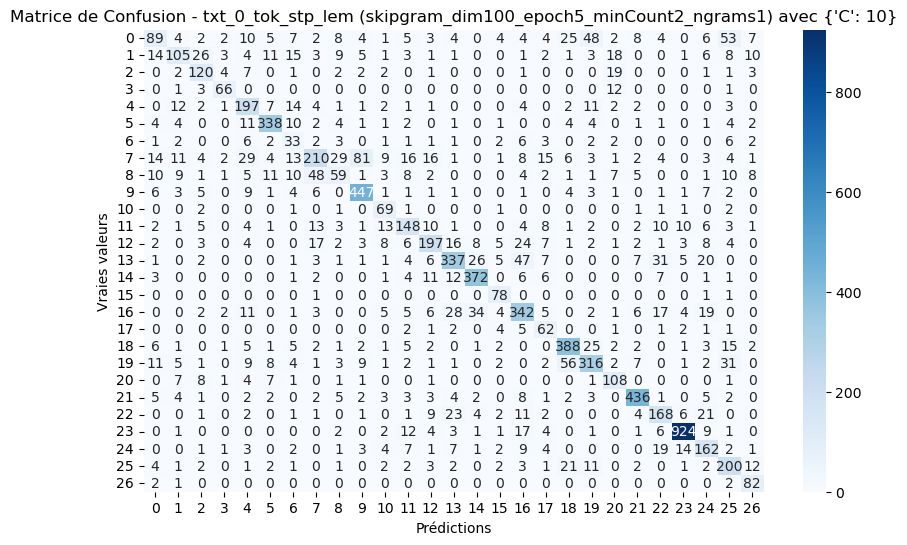


Meilleure configuration: txt_0_tok_stp_lem - skipgram_dim100_epoch5_minCount2_ngrams1
F1 Score Weighted sur Validation: 0.7123
Meilleurs hyperparamètres: {'C': 10}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.51      0.29      0.37       311
          40       0.60      0.42      0.49       251
          50       0.63      0.72      0.67       166
          60       0.79      0.80      0.79        83
        1140       0.61      0.74      0.67       267
        1160       0.84      0.85      0.85       396
        1180       0.26      0.43      0.33        76
        1280       0.65      0.43      0.52       487
        1281       0.43      0.29      0.34       207
        1300       0.79      0.89      0.84       505
        1301       0.53      0.86      0.65        80
        1302       0.62      0.59      0.61       249
        1320       0.70      0.61      0.65       324
        1560       0.76      0.67     

In [4]:
# Chargement des résultats du GridSearch FastText
df_results_fasttext = pd.read_csv("df_results_fasttext.csv")
best_row = df_results_fasttext.iloc[0]

# Meilleure configuration identifiée
best_col = best_row["Text Column"]
best_param = best_row["FastText Params"]
best_f1 = best_row["F1 Score"]
best_params = eval(best_row["Best Params"])

# Dossier des embeddings FastText
vectorized_dir = "vectorized_data_fasttext"

# Chargement des matrices d'embeddings (train + validation)
X_train_best = np.load(os.path.join(vectorized_dir, best_col, f"X_train_fasttext_{best_param}.npy"))
X_val_best = np.load(os.path.join(vectorized_dir, best_col, f"X_val_fasttext_{best_param}.npy"))

# Entraînement du modèle avec la meilleure configuration
best_model = LinearSVC(class_weight='balanced', max_iter=5000, random_state=42, C=best_params['C'])
best_model.fit(X_train_best, y_train)

# Prédictions sur validation
y_pred_val = best_model.predict(X_val_best)

# Rapport de classification et matrice de confusion
best_classification_report = classification_report(y_val, y_pred_val)
best_confusion_matrix = confusion_matrix(y_val, y_pred_val)

# Affichage de la matrice de confusion
plt.figure(figsize=(10, 6))
sns.heatmap(best_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - {best_col} ({best_param}) avec {best_params}")
plt.show()

# Résumé des performances
print(f"\nMeilleure configuration: {best_col} - {best_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val, average='weighted'):.4f}")
print(f"Meilleurs hyperparamètres: {best_params}")
print("\nClassification Report sur Validation:\n", best_classification_report)


### Evaluation SVM - best vectorisation - Traduit FR

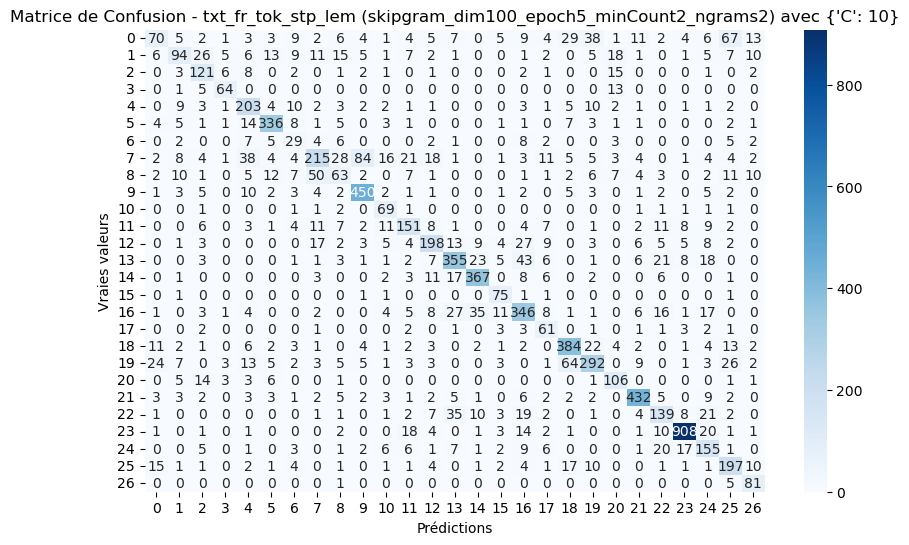


Configuration Spécifiée: txt_fr_tok_stp_lem - skipgram_dim100_epoch5_minCount2_ngrams2
F1 Score Weighted sur Validation: 0.7000
Hyperparamètre utilisé: {'C': 10}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.50      0.23      0.31       311
          40       0.58      0.37      0.46       251
          50       0.58      0.73      0.64       166
          60       0.74      0.77      0.76        83
        1140       0.62      0.76      0.68       267
        1160       0.85      0.85      0.85       396
        1180       0.29      0.38      0.33        76
        1280       0.65      0.44      0.53       487
        1281       0.39      0.30      0.34       207
        1300       0.79      0.89      0.84       505
        1301       0.52      0.86      0.65        80
        1302       0.62      0.61      0.61       249
        1320       0.69      0.61      0.65       324
        1560       0.75      0.70      0

In [5]:
# Meilleure configuration choisie manuellement
best_col = "txt_fr_tok_stp_lem"
best_param = "skipgram_dim100_epoch5_minCount2_ngrams2"
best_params = {'C': 10}

# Dossier des vecteurs FastText
vectorized_dir = "vectorized_data_fasttext"

# Chargement des matrices FastText (train + validation)
X_train_best = np.load(os.path.join(vectorized_dir, best_col, f"X_train_fasttext_{best_param}.npy"))
X_val_best = np.load(os.path.join(vectorized_dir, best_col, f"X_val_fasttext_{best_param}.npy"))

# Entraînement du modèle SVM avec la configuration spécifiée
best_model = LinearSVC(class_weight='balanced', max_iter=5000, random_state=42, C=best_params['C'])
best_model.fit(X_train_best, y_train)

# Prédictions sur l'ensemble de validation
y_pred_val = best_model.predict(X_val_best)

# Rapport de classification et matrice de confusion
best_classification_report = classification_report(y_val, y_pred_val)
best_confusion_matrix = confusion_matrix(y_val, y_pred_val)

# Affichage de la matrice de confusion
plt.figure(figsize=(10, 6))
sns.heatmap(best_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - {best_col} ({best_param}) avec {best_params}")
plt.show()

# Résumé des performances
print(f"\nConfiguration Spécifiée: {best_col} - {best_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val, average='weighted'):.4f}")
print(f"Hyperparamètre utilisé: {best_params}")
print("\nClassification Report sur Validation:\n", best_classification_report)


## Random Forest

### RF - Choix meilleur vectorisation

In [165]:
# Dossier des vecteurs FastText
vectorized_dir = "vectorized_data_fasttext"

# Grille d'hyperparamètres pour Random Forest
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10, 20, None]
}

# Liste pour stocker les résultats
results = []

# Boucle sur les colonnes textuelles
for col in ["txt_0_tok_stp_lem", "txt_fr_tok_stp_lem"]:
    col_dir = os.path.join(vectorized_dir, col)

    # Boucle sur les fichiers d'embeddings FastText
    for filename in os.listdir(col_dir):
        if filename.startswith("X_train_fasttext_") and filename.endswith(".npy"):
            param_str = filename.replace("X_train_fasttext_", "").replace(".npy", "")

            # Chargement des embeddings
            X_train_fasttext = np.load(os.path.join(col_dir, filename))

            # Chargement des labels associés
            y_train_filepath = os.path.join(col_dir, f"y_train_fasttext_{param_str}.csv")
            if not os.path.exists(y_train_filepath):
                print(f"Labels manquants pour {param_str}, saut de cette configuration.")
                continue

            y_train = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

            # Initialisation de GridSearchCV avec RandomForestClassifier
            model = RandomForestClassifier(random_state=42, n_jobs=-1)
            grid_search = GridSearchCV(
                model,
                param_grid,
                cv=5,
                scoring='f1_weighted',
                n_jobs=-1,
                verbose=1
            )

            # Entraînement et recherche d'hyperparamètres
            grid_search.fit(X_train_fasttext, y_train)

            # Affichage des résultats intermédiaires
            print("Hyperparamètres testés:", grid_search.cv_results_['params'])
            print("Scores obtenus:", grid_search.cv_results_['mean_test_score'])

            # Meilleurs résultats
            best_f1 = grid_search.best_score_
            best_params = grid_search.best_params_

            # Stockage
            results.append((col, param_str, best_f1, best_params))

# Compilation des résultats dans un DataFrame
df_results = pd.DataFrame(results, columns=["Text Column", "FastText Params", "F1 Score", "Best Params"])
df_results = df_results.sort_values(by="F1 Score", ascending=False)

# Sauvegarde et affichage
df_results.to_csv("df_results_fasttext_rf.csv", index=False)
display(df_results)

print("Recherche de la meilleure vectorisation FastText avec Random Forest terminée.")


Fitting 5 folds for each of 9 candidates, totalling 45 fits
Hyperparamètres testés: [{'max_depth': 10, 'n_estimators': 50}, {'max_depth': 10, 'n_estimators': 100}, {'max_depth': 10, 'n_estimators': 200}, {'max_depth': 20, 'n_estimators': 50}, {'max_depth': 20, 'n_estimators': 100}, {'max_depth': 20, 'n_estimators': 200}, {'max_depth': None, 'n_estimators': 50}, {'max_depth': None, 'n_estimators': 100}, {'max_depth': None, 'n_estimators': 200}]
Scores obtenus: [0.64421192 0.64759178 0.64849467 0.72919884 0.73834432 0.74369413
 0.73469323 0.74366602 0.74966602]
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Hyperparamètres testés: [{'max_depth': 10, 'n_estimators': 50}, {'max_depth': 10, 'n_estimators': 100}, {'max_depth': 10, 'n_estimators': 200}, {'max_depth': 20, 'n_estimators': 50}, {'max_depth': 20, 'n_estimators': 100}, {'max_depth': 20, 'n_estimators': 200}, {'max_depth': None, 'n_estimators': 50}, {'max_depth': None, 'n_estimators': 100}, {'max_depth': None, 'n_estim

,Text Column,FastText Params,F1 Score,Best Params
1,txt_0_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams2,0.749821,"{'max_depth': None, 'n_estimators': 200}"
0,txt_0_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams1,0.749666,"{'max_depth': None, 'n_estimators': 200}"
3,txt_0_tok_stp_lem,skipgram_dim50_epoch5_minCount2_ngrams2,0.743302,"{'max_depth': None, 'n_estimators': 200}"
2,txt_0_tok_stp_lem,skipgram_dim50_epoch5_minCount2_ngrams1,0.742759,"{'max_depth': None, 'n_estimators': 200}"
4,txt_fr_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams1,0.740585,"{'max_depth': None, 'n_estimators': 200}"
5,txt_fr_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams2,0.739894,"{'max_depth': None, 'n_estimators': 200}"
7,txt_fr_tok_stp_lem,skipgram_dim50_epoch5_minCount2_ngrams2,0.733129,"{'max_depth': None, 'n_estimators': 200}"
6,txt_fr_tok_stp_lem,skipgram_dim50_epoch5_minCount2_ngrams1,0.731282,"{'max_depth': None, 'n_estimators': 200}"


Recherche de la meilleure vectorisation FastText avec Random Forest terminée.


### Evaluation RF - best vectorisation - Non traduit

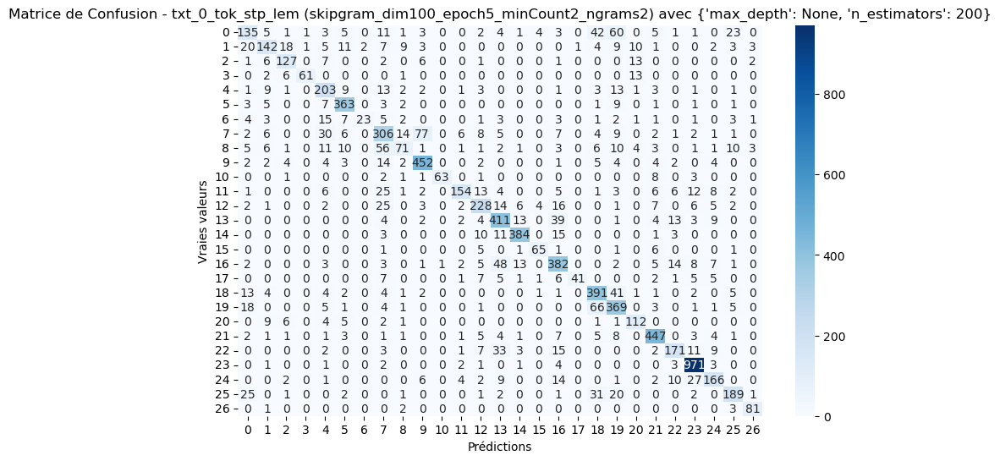


Meilleure configuration: txt_0_tok_stp_lem - skipgram_dim100_epoch5_minCount2_ngrams2
F1 Score Weighted sur Validation: 0.7662
Meilleurs hyperparamètres: {'max_depth': None, 'n_estimators': 200}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.57      0.43      0.49       311
          40       0.70      0.57      0.63       251
          50       0.75      0.77      0.76       166
          60       0.97      0.73      0.84        83
        1140       0.65      0.76      0.70       267
        1160       0.85      0.92      0.88       396
        1180       0.92      0.30      0.46        76
        1280       0.61      0.63      0.62       487
        1281       0.63      0.34      0.44       207
        1300       0.81      0.90      0.85       505
        1301       0.98      0.79      0.88        80
        1302       0.87      0.62      0.72       249
        1320       0.74      0.70      0.72       324
       

In [6]:
# Chargement des résultats GridSearch (FastText + Random Forest)
df_results_fasttext_rf = pd.read_csv("df_results_fasttext_rf.csv")
best_row = df_results_fasttext_rf.iloc[0]

# Meilleure configuration sélectionnée
best_col = best_row["Text Column"]
best_param = best_row["FastText Params"]
best_f1 = best_row["F1 Score"]
best_params = eval(best_row["Best Params"])

# Dossier des vecteurs FastText
vectorized_dir = "vectorized_data_fasttext"

# Chargement des embeddings FastText (train + validation)
X_train_best = np.load(os.path.join(vectorized_dir, best_col, f"X_train_fasttext_{best_param}.npy"))
X_val_best = np.load(os.path.join(vectorized_dir, best_col, f"X_val_fasttext_{best_param}.npy"))

# Chargement des labels de train
y_train_filepath = os.path.join(vectorized_dir, best_col, f"y_train_fasttext_{best_param}.csv")
y_train = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

# Entraînement du modèle Random Forest avec la meilleure configuration
best_model = RandomForestClassifier(
    random_state=42,
    n_jobs=-1,
    n_estimators=best_params['n_estimators'],
    max_depth=best_params['max_depth']
)
best_model.fit(X_train_best, y_train)

# Prédictions sur l'ensemble de validation
y_pred_val = best_model.predict(X_val_best)

# Rapport de classification et matrice de confusion
best_classification_report = classification_report(y_val, y_pred_val)
best_confusion_matrix = confusion_matrix(y_val, y_pred_val)

# Affichage de la matrice de confusion
plt.figure(figsize=(10, 6))
sns.heatmap(best_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - {best_col} ({best_param}) avec {best_params}")
plt.show()

# Résumé des performances
print(f"\nMeilleure configuration: {best_col} - {best_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val, average='weighted'):.4f}")
print(f"Meilleurs hyperparamètres: {best_params}")
print("\nClassification Report sur Validation:\n", best_classification_report)


### Evaluation FR - best vectorisation - Traduit FR

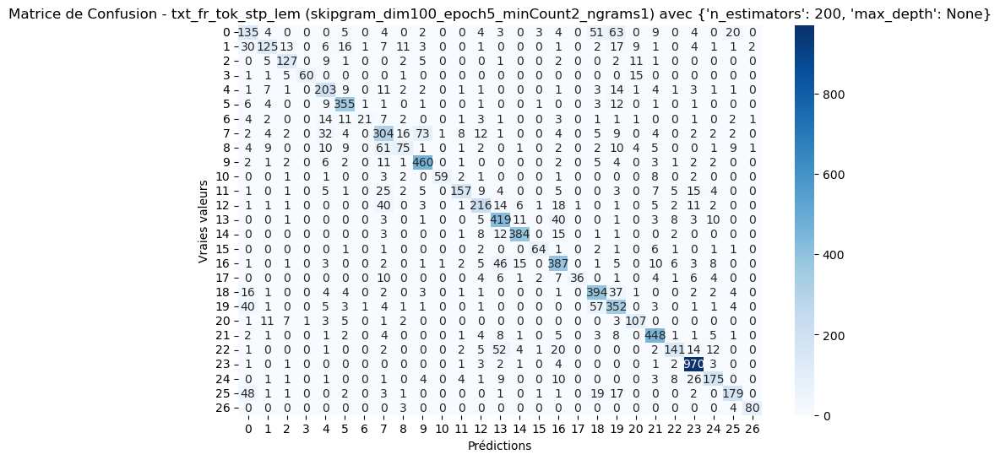


Configuration Spécifiée: txt_fr_tok_stp_lem - skipgram_dim100_epoch5_minCount2_ngrams1
F1 Score Weighted sur Validation: 0.7573
Hyperparamètres utilisés: {'n_estimators': 200, 'max_depth': None}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.45      0.43      0.44       311
          40       0.70      0.50      0.58       251
          50       0.77      0.77      0.77       166
          60       0.98      0.72      0.83        83
        1140       0.65      0.76      0.70       267
        1160       0.83      0.90      0.86       396
        1180       0.88      0.28      0.42        76
        1280       0.60      0.62      0.61       487
        1281       0.62      0.36      0.46       207
        1300       0.81      0.91      0.86       505
        1301       0.97      0.74      0.84        80
        1302       0.85      0.63      0.73       249
        1320       0.75      0.67      0.70       324
       

In [7]:
# Meilleure configuration choisie manuellement
best_col = "txt_fr_tok_stp_lem"
best_param = "skipgram_dim100_epoch5_minCount2_ngrams1"
best_params = {'n_estimators': 200, 'max_depth': None}

# Dossier des vecteurs FastText
vectorized_dir = "vectorized_data_fasttext"

# Chargement des embeddings (train + validation)
X_train_best = np.load(os.path.join(vectorized_dir, best_col, f"X_train_fasttext_{best_param}.npy"))
X_val_best = np.load(os.path.join(vectorized_dir, best_col, f"X_val_fasttext_{best_param}.npy"))

# Chargement des labels d'entraînement
y_train_filepath = os.path.join(vectorized_dir, best_col, f"y_train_fasttext_{best_param}.csv")
y_train = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

# Entraînement du modèle Random Forest
best_model = RandomForestClassifier(
    random_state=42,
    n_jobs=-1,
    n_estimators=best_params['n_estimators'],
    max_depth=best_params['max_depth']
)
best_model.fit(X_train_best, y_train)

# Prédictions sur les données de validation
y_pred_val = best_model.predict(X_val_best)

# Rapport de classification et matrice de confusion
best_classification_report = classification_report(y_val, y_pred_val)
best_confusion_matrix = confusion_matrix(y_val, y_pred_val)

# Affichage de la matrice de confusion
plt.figure(figsize=(10, 6))
sns.heatmap(best_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - {best_col} ({best_param}) avec {best_params}")
plt.show()

# Résumé des performances
print(f"\nConfiguration Spécifiée: {best_col} - {best_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val, average='weighted'):.4f}")
print(f"Hyperparamètres utilisés: {best_params}")
print("\nClassification Report sur Validation:\n", best_classification_report)


## Logistic Regression

### LR (SGD) - Choix meilleur vectorisation

In [163]:
# Dossier des vecteurs FastText
vectorized_dir = "vectorized_data_fasttext"

# Grille d'hyperparamètres pour SGDClassifier (logistic regression)
sgd_param_grid = {
    'alpha': [1e-4, 1e-3, 1e-2],
    'penalty': ['l2'],
    'loss': ['log_loss'],
    'max_iter': [1000]
}

# Stockage des résultats
results = []

# Boucle sur les colonnes textuelles
for col in ["txt_0_tok_stp_lem", "txt_fr_tok_stp_lem"]:
    col_dir = os.path.join(vectorized_dir, col)

    # Boucle sur les fichiers d'embeddings
    for filename in os.listdir(col_dir):
        if filename.startswith("X_train_fasttext_") and filename.endswith(".npy"):
            param_str = filename.replace("X_train_fasttext_", "").replace(".npy", "")

            # Chargement des vecteurs FastText
            X_train_fasttext = np.load(os.path.join(col_dir, filename))

            # Chargement des labels associés
            y_train_filepath = os.path.join(col_dir, f"y_train_fasttext_{param_str}.csv")
            if not os.path.exists(y_train_filepath):
                print(f"Labels manquants pour {param_str}, saut.")
                continue

            y_train = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

            # Initialisation de GridSearchCV avec SGDClassifier
            model = SGDClassifier(random_state=42)
            grid_search = GridSearchCV(
                model,
                sgd_param_grid,
                cv=5,
                scoring='f1_weighted',
                n_jobs=-1,
                verbose=1
            )

            # Entraînement et recherche des hyperparamètres
            grid_search.fit(X_train_fasttext, y_train)

            # Affichage des scores intermédiaires
            print("Hyperparamètres testés:", grid_search.cv_results_['params'])
            print("Scores obtenus:", grid_search.cv_results_['mean_test_score'])

            # Meilleurs résultats
            best_f1 = grid_search.best_score_
            best_params = grid_search.best_params_

            # Stockage
            results.append((col, param_str, best_f1, best_params))

# Compilation et tri des résultats
df_results = pd.DataFrame(results, columns=["Text Column", "FastText Params", "F1 Score", "Best Params"])
df_results = df_results.sort_values(by="F1 Score", ascending=False)

# Sauvegarde et affichage
df_results.to_csv("df_results_fasttext_sgd.csv", index=False)
display(df_results)

print("Recherche de la meilleure vectorisation FastText avec SGDClassifier terminée.")


Fitting 5 folds for each of 3 candidates, totalling 15 fits
Hyperparamètres testés: [{'alpha': 0.0001, 'loss': 'log_loss', 'max_iter': 1000, 'penalty': 'l2'}, {'alpha': 0.001, 'loss': 'log_loss', 'max_iter': 1000, 'penalty': 'l2'}, {'alpha': 0.01, 'loss': 'log_loss', 'max_iter': 1000, 'penalty': 'l2'}]
Scores obtenus: [0.70046982 0.64475681 0.50610444]
Fitting 5 folds for each of 3 candidates, totalling 15 fits
Hyperparamètres testés: [{'alpha': 0.0001, 'loss': 'log_loss', 'max_iter': 1000, 'penalty': 'l2'}, {'alpha': 0.001, 'loss': 'log_loss', 'max_iter': 1000, 'penalty': 'l2'}, {'alpha': 0.01, 'loss': 'log_loss', 'max_iter': 1000, 'penalty': 'l2'}]
Scores obtenus: [0.70030115 0.64242245 0.50513101]
Fitting 5 folds for each of 3 candidates, totalling 15 fits
Hyperparamètres testés: [{'alpha': 0.0001, 'loss': 'log_loss', 'max_iter': 1000, 'penalty': 'l2'}, {'alpha': 0.001, 'loss': 'log_loss', 'max_iter': 1000, 'penalty': 'l2'}, {'alpha': 0.01, 'loss': 'log_loss', 'max_iter': 1000, 'pen

,Text Column,FastText Params,F1 Score,Best Params
0,txt_0_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams1,0.700470,"{'alpha': 0.0001, 'loss': 'log_loss', 'max_ite..."
1,txt_0_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams2,0.700301,"{'alpha': 0.0001, 'loss': 'log_loss', 'max_ite..."
5,txt_fr_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams2,0.688339,"{'alpha': 0.0001, 'loss': 'log_loss', 'max_ite..."
4,txt_fr_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams1,0.688157,"{'alpha': 0.0001, 'loss': 'log_loss', 'max_ite..."
2,txt_0_tok_stp_lem,skipgram_dim50_epoch5_minCount2_ngrams1,0.663987,"{'alpha': 0.0001, 'loss': 'log_loss', 'max_ite..."
3,txt_0_tok_stp_lem,skipgram_dim50_epoch5_minCount2_ngrams2,0.663268,"{'alpha': 0.0001, 'loss': 'log_loss', 'max_ite..."
7,txt_fr_tok_stp_lem,skipgram_dim50_epoch5_minCount2_ngrams2,0.656639,"{'alpha': 0.0001, 'loss': 'log_loss', 'max_ite..."
6,txt_fr_tok_stp_lem,skipgram_dim50_epoch5_minCount2_ngrams1,0.656168,"{'alpha': 0.0001, 'loss': 'log_loss', 'max_ite..."


Recherche de la meilleure vectorisation FastText avec SGDClassifier terminée.


### Evaluation LR (SGD) - best vectorisation - Non traduit

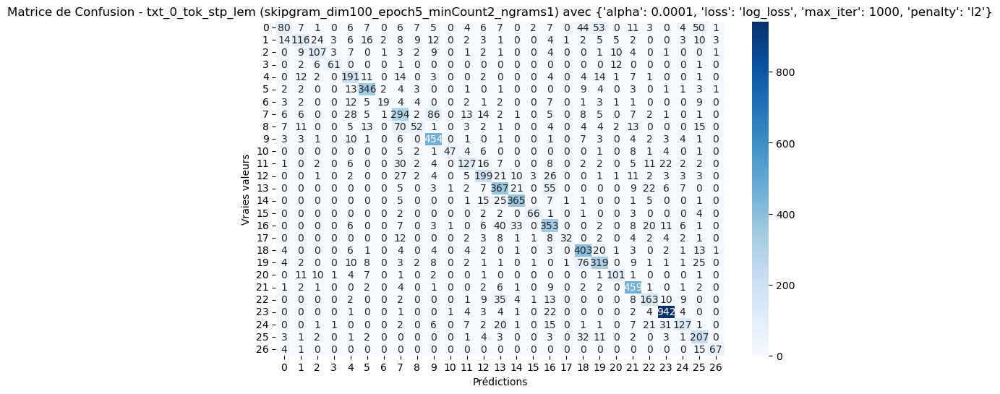


Meilleure configuration: txt_0_tok_stp_lem - skipgram_dim100_epoch5_minCount2_ngrams1
F1 Score Weighted sur Validation: 0.7083
Meilleurs hyperparamètres: {'alpha': 0.0001, 'loss': 'log_loss', 'max_iter': 1000, 'penalty': 'l2'}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.61      0.26      0.36       311
          40       0.62      0.46      0.53       251
          50       0.68      0.64      0.66       166
          60       0.88      0.73      0.80        83
        1140       0.60      0.72      0.66       267
        1160       0.82      0.87      0.84       396
        1180       0.76      0.25      0.38        76
        1280       0.57      0.60      0.58       487
        1281       0.60      0.25      0.35       207
        1300       0.75      0.90      0.82       505
        1301       0.94      0.59      0.72        80
        1302       0.68      0.51      0.58       249
        1320       0.65      

In [8]:
# Chargement des résultats GridSearch (FastText + SGDClassifier)
df_results_fasttext_sgd = pd.read_csv("df_results_fasttext_sgd.csv")
best_row = df_results_fasttext_sgd.iloc[0]

# Meilleure configuration retenue
best_col = best_row["Text Column"]
best_param = best_row["FastText Params"]
best_f1 = best_row["F1 Score"]
best_params = eval(best_row["Best Params"])

# Dossier des vecteurs FastText
vectorized_dir = "vectorized_data_fasttext"

# Chargement des embeddings (train + validation)
X_train_best = np.load(os.path.join(vectorized_dir, best_col, f"X_train_fasttext_{best_param}.npy"))
X_val_best = np.load(os.path.join(vectorized_dir, best_col, f"X_val_fasttext_{best_param}.npy"))

# Chargement des labels d'entraînement
y_train_filepath = os.path.join(vectorized_dir, best_col, f"y_train_fasttext_{best_param}.csv")
y_train = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

# Entraînement du modèle SGDClassifier (régression logistique)
best_model = SGDClassifier(
    random_state=42,
    alpha=best_params['alpha'],
    penalty=best_params['penalty'],
    loss=best_params['loss'],
    max_iter=best_params['max_iter']
)
best_model.fit(X_train_best, y_train)

# Prédictions sur validation
y_pred_val = best_model.predict(X_val_best)

# Rapport de classification et matrice de confusion
best_classification_report = classification_report(y_val, y_pred_val)
best_confusion_matrix = confusion_matrix(y_val, y_pred_val)

# Affichage de la matrice de confusion
plt.figure(figsize=(10, 6))
sns.heatmap(best_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - {best_col} ({best_param}) avec {best_params}")
plt.show()

# Résumé des performances
print(f"\nMeilleure configuration: {best_col} - {best_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val, average='weighted'):.4f}")
print(f"Meilleurs hyperparamètres: {best_params}")
print("\nClassification Report sur Validation:\n", best_classification_report)


### Evaluation LR (SGD) - best vectorisation - Traduit FR

C:\Users\rudy_\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\rudy_\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\rudy_\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


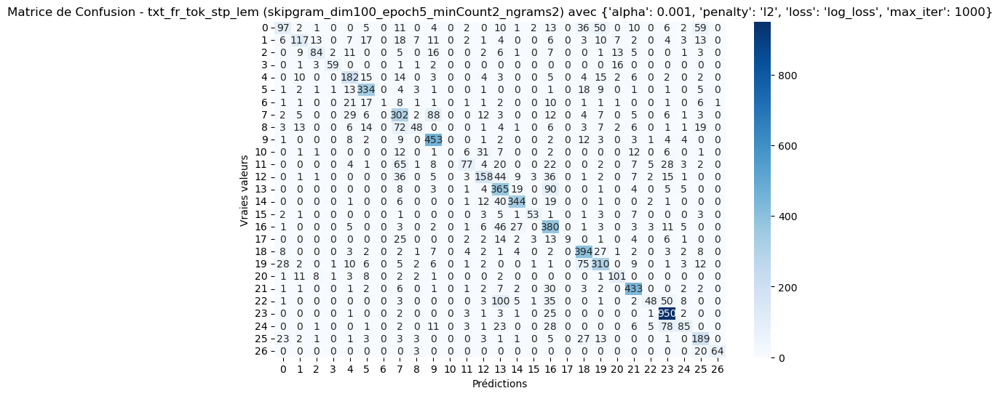


Configuration Spécifiée: txt_fr_tok_stp_lem - skipgram_dim100_epoch5_minCount2_ngrams2
F1 Score Weighted sur Validation: 0.6460
Hyperparamètres utilisés: {'alpha': 0.001, 'penalty': 'l2', 'loss': 'log_loss', 'max_iter': 1000}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.55      0.31      0.40       311
          40       0.65      0.47      0.54       251
          50       0.74      0.51      0.60       166
          60       0.92      0.71      0.80        83
        1140       0.59      0.68      0.64       267
        1160       0.77      0.84      0.81       396
        1180       1.00      0.01      0.03        76
        1280       0.48      0.62      0.54       487
        1281       0.65      0.23      0.34       207
        1300       0.73      0.90      0.80       505
        1301       0.00      0.00      0.00        80
        1302       0.71      0.31      0.43       249
        1320       0.61      0

In [9]:
# Meilleure configuration choisie manuellement
best_col = "txt_fr_tok_stp_lem"
best_param = "skipgram_dim100_epoch5_minCount2_ngrams2"
best_params = {'alpha': 1e-3, 'penalty': 'l2', 'loss': 'log_loss', 'max_iter': 1000}

# Dossier des vecteurs FastText
vectorized_dir = "vectorized_data_fasttext"

# Chargement des embeddings (train + validation)
X_train_best = np.load(os.path.join(vectorized_dir, best_col, f"X_train_fasttext_{best_param}.npy"))
X_val_best = np.load(os.path.join(vectorized_dir, best_col, f"X_val_fasttext_{best_param}.npy"))

# Chargement des labels d'entraînement
y_train_filepath = os.path.join(vectorized_dir, best_col, f"y_train_fasttext_{best_param}.csv")
y_train = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

# Entraînement du modèle SGDClassifier (régression logistique)
best_model = SGDClassifier(
    random_state=42,
    alpha=best_params['alpha'],
    penalty=best_params['penalty'],
    loss=best_params['loss'],
    max_iter=best_params['max_iter']
)
best_model.fit(X_train_best, y_train)

# Prédictions sur validation
y_pred_val = best_model.predict(X_val_best)

# Rapport de classification et matrice de confusion
best_classification_report = classification_report(y_val, y_pred_val)
best_confusion_matrix = confusion_matrix(y_val, y_pred_val)

# Affichage de la matrice de confusion
plt.figure(figsize=(10, 6))
sns.heatmap(best_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - {best_col} ({best_param}) avec {best_params}")
plt.show()

# Résumé des performances
print(f"\nConfiguration Spécifiée: {best_col} - {best_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val, average='weighted'):.4f}")
print(f"Hyperparamètres utilisés: {best_params}")
print("\nClassification Report sur Validation:\n", best_classification_report)


# **Vectorisation Fasttext - Resampling SMOTE/Undersampling**

## Vectorisation multiples parametres et resampling smote/undersampling

In [171]:
# Dossier de sortie
output_dir = "vectorized_data_fasttext"
os.makedirs(output_dir, exist_ok=True)

# Colonnes textuelles à vectoriser
text_columns = ["txt_0_tok_stp_lem", "txt_fr_tok_stp_lem"]

# Paramètres FastText (type, dim, epoch, minCount, wordNgrams)
param_grid = list(product(["skipgram"], [100], [5], [2], [1, 2]))

# Prétraitement des textes (si listés)
for col in text_columns:
    if X_train[col].apply(lambda x: isinstance(x, str) and x.startswith("[")).any():
        X_train[col] = X_train[col].apply(lambda x: " ".join(eval(x)) if isinstance(x, str) else x)

# Vectorisation et rééquilibrage
for col in text_columns:
    col_dir = os.path.join(output_dir, col)
    os.makedirs(col_dir, exist_ok=True)

    # Sauvegarde des textes pour FastText
    train_text_file = os.path.join(col_dir, "train_texts.txt")
    X_train[col].to_csv(train_text_file, index=False, header=False)

    for model_type, dim, epoch, min_count, word_ngrams in param_grid:
        print(f"Vectorisation FastText: {model_type}, dim={dim}, epoch={epoch}, minCount={min_count}, wordNgrams={word_ngrams}")

        # Entraînement du modèle FastText
        fasttext_model = fasttext.train_unsupervised(
            input=train_text_file,
            model=model_type,
            dim=dim,
            epoch=epoch,
            minCount=min_count,
            wordNgrams=word_ngrams
        )

        # Identifiant de configuration
        param_str = f"{model_type}_dim{dim}_epoch{epoch}_minCount{min_count}_ngrams{word_ngrams}"

        # Sauvegarde du modèle
        fasttext_model.save_model(os.path.join(col_dir, f"fasttext_{param_str}.bin"))

        # Fonction de vectorisation moyenne
        def get_fasttext_vector(text):
            words = text.split()
            vectors = [fasttext_model.get_word_vector(w) for w in words if w in fasttext_model.words]
            return np.mean(vectors, axis=0) if vectors else np.zeros(fasttext_model.get_dimension())

        # Vectorisation de l'entraînement
        X_train_vectors = np.vstack(X_train[col].apply(get_fasttext_vector))

        # Sauvegarde des vecteurs bruts
        raw_filename = os.path.join(col_dir, f"X_train_fasttext_{param_str}.npy")
        np.save(raw_filename, X_train_vectors)
        print(f"Vectorisation terminée pour {col} avec {param_str}")

        # Statistiques de classe
        class_counts = Counter(y_train)
        max_count = max(class_counts.values())

        # Stratégie de sous-échantillonnage
        threshold_under = int(max_count * 0.7)
        sampling_strategy_under = {cls: int(count * 0.8) for cls, count in class_counts.items() if count > threshold_under}

        # Stratégie de suréchantillonnage SMOTE
        sampling_strategy_smote = {}
        for cls, count in class_counts.items():
            if count < 2000:
                sampling_strategy_smote[cls] = 3000
            elif count < int(max_count * 0.4):
                sampling_strategy_smote[cls] = min(4200, count * 2)

        # Undersampling
        under = RandomUnderSampler(sampling_strategy=sampling_strategy_under, random_state=42)
        X_res, y_res = under.fit_resample(X_train_vectors, y_train)

        # SMOTE
        smote = SMOTE(sampling_strategy=sampling_strategy_smote, random_state=42)
        X_res, y_res = smote.fit_resample(X_res, y_res)

        # Sauvegarde des vecteurs équilibrés
        resampled_filename = os.path.join(col_dir, f"X_train_fasttext_resampled_{param_str}.npy")
        np.save(resampled_filename, X_res)

        # Sauvegarde des labels équilibrés
        y_resampled_filename = os.path.join(col_dir, f"X_train_fasttext_resampled_{param_str}_y.csv")
        pd.Series(y_res).to_csv(y_resampled_filename, index=False, header=False)

        print(f"Rééquilibrage terminé et sauvegardé pour {col} avec {param_str}")

print("Vectorisation et rééquilibrage terminés pour toutes les configurations.")


Vectorisation FastText: skipgram, dim=100, epoch=5, minCount=2, wordNgrams=1
Vectorisation terminée pour txt_0_tok_stp_lem avec skipgram_dim100_epoch5_minCount2_ngrams1


C:\Users\rudy_\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] Le fichier spécifié est introuvable
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\rudy_\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Users\rudy_\anaconda3\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\rudy_\anaconda3\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\rudy_\anaconda3\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(e

Rééquilibrage terminé et sauvegardé pour txt_0_tok_stp_lem avec skipgram_dim100_epoch5_minCount2_ngrams1
Vectorisation FastText: skipgram, dim=100, epoch=5, minCount=2, wordNgrams=2
Vectorisation terminée pour txt_0_tok_stp_lem avec skipgram_dim100_epoch5_minCount2_ngrams2
Rééquilibrage terminé et sauvegardé pour txt_0_tok_stp_lem avec skipgram_dim100_epoch5_minCount2_ngrams2
Vectorisation FastText: skipgram, dim=100, epoch=5, minCount=2, wordNgrams=1
Vectorisation terminée pour txt_fr_tok_stp_lem avec skipgram_dim100_epoch5_minCount2_ngrams1
Rééquilibrage terminé et sauvegardé pour txt_fr_tok_stp_lem avec skipgram_dim100_epoch5_minCount2_ngrams1
Vectorisation FastText: skipgram, dim=100, epoch=5, minCount=2, wordNgrams=2
Vectorisation terminée pour txt_fr_tok_stp_lem avec skipgram_dim100_epoch5_minCount2_ngrams2
Rééquilibrage terminé et sauvegardé pour txt_fr_tok_stp_lem avec skipgram_dim100_epoch5_minCount2_ngrams2
Vectorisation et rééquilibrage terminés pour toutes les configuration

## SVM

### SVM - Choix meilleur vectorisation

In [174]:
# Dossier des vecteurs FastText rééquilibrés
vectorized_dir = "vectorized_data_fasttext"

# Grille d'hyperparamètres pour LinearSVC
param_grid = {'C': [0.01, 0.1, 1, 10]}

# Stockage des résultats
results = []

# Boucle sur les colonnes textuelles
for col in ["txt_0_tok_stp_lem", "txt_fr_tok_stp_lem"]:
    col_dir = os.path.join(vectorized_dir, col)

    # Boucle sur les fichiers de vecteurs rééquilibrés
    for filename in os.listdir(col_dir):
        if filename.startswith("X_train_fasttext_resampled_") and filename.endswith(".npy"):
            param_str = filename.replace("X_train_fasttext_resampled_", "").replace(".npy", "")

            # Chargement des vecteurs
            X_train_fasttext = np.load(os.path.join(col_dir, filename))

            # Chargement des labels rééquilibrés
            y_train_filepath = os.path.join(col_dir, f"X_train_fasttext_resampled_{param_str}_y.csv")
            if not os.path.exists(y_train_filepath):
                print(f"Labels manquants pour {param_str}, saut.")
                continue

            y_train = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

            # Initialisation de GridSearchCV avec LinearSVC
            model = LinearSVC(class_weight='balanced', max_iter=5000, random_state=42)
            grid_search = GridSearchCV(model, param_grid, cv=5, scoring='f1_weighted', n_jobs=-1)

            # Entraînement et recherche des meilleurs hyperparamètres
            grid_search.fit(X_train_fasttext, y_train)

            # Récupération des meilleurs résultats
            best_f1 = grid_search.best_score_
            best_params = grid_search.best_params_

            # Stockage des résultats
            results.append((col, param_str, best_f1, best_params))

# Compilation des résultats
df_results = pd.DataFrame(results, columns=["Text Column", "FastText Params", "F1 Score", "Best Params"])
df_results = df_results.sort_values(by="F1 Score", ascending=False)

# Sauvegarde et affichage
df_results.to_csv("df_results_fasttext_resampled.csv", index=False)
display(df_results)

print("Recherche de la meilleure vectorisation FastText (rééquilibrée) terminée.")


,Text Column,FastText Params,F1 Score,Best Params
1,txt_0_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams2,0.710308,{'C': 10}
0,txt_0_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams1,0.710102,{'C': 10}
3,txt_fr_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams2,0.703205,{'C': 10}
2,txt_fr_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams1,0.702826,{'C': 10}


Recherche de la meilleure vectorisation FastText (rééquilibrée) terminée.


### Evaluation SVM - best vectorisation - Non traduit

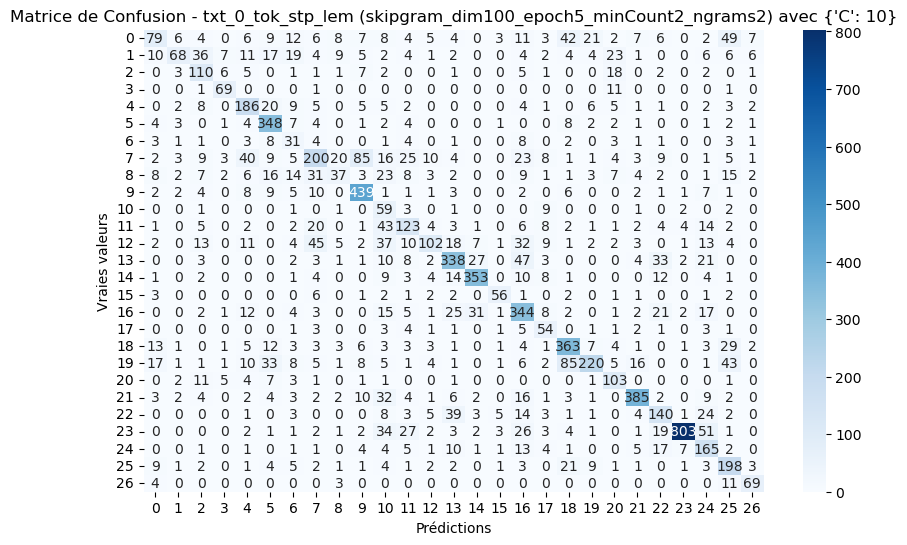


Meilleure configuration: txt_0_tok_stp_lem - skipgram_dim100_epoch5_minCount2_ngrams2
F1 Score Weighted sur Validation: 0.6429
Meilleurs hyperparamètres: {'C': 10}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.49      0.25      0.33       311
          40       0.70      0.27      0.39       251
          50       0.49      0.66      0.56       166
          60       0.72      0.83      0.77        83
        1140       0.58      0.70      0.63       267
        1160       0.70      0.88      0.78       396
        1180       0.21      0.41      0.28        76
        1280       0.55      0.41      0.47       487
        1281       0.40      0.18      0.25       207
        1300       0.75      0.87      0.80       505
        1301       0.18      0.74      0.29        80
        1302       0.49      0.49      0.49       249
        1320       0.66      0.31      0.43       324
        1560       0.70      0.67     

In [12]:
# Chargement des résultats GridSearch (FastText rééquilibré + SVM)
df_results_fasttext_resampled = pd.read_csv("df_results_fasttext_resampled.csv")
best_row = df_results_fasttext_resampled.iloc[0]

# Meilleure configuration sélectionnée
best_col = best_row["Text Column"]
best_param = best_row["FastText Params"]
best_f1 = best_row["F1 Score"]
best_params = eval(best_row["Best Params"])

# Dossier des embeddings FastText
vectorized_dir = "vectorized_data_fasttext"

# Chargement des embeddings (train rééquilibré + validation)
X_train_best = np.load(os.path.join(vectorized_dir, best_col, f"X_train_fasttext_resampled_{best_param}.npy"))
X_val_best = np.load(os.path.join(vectorized_dir, best_col, f"X_val_fasttext_{best_param}.npy"))

# Chargement des labels rééquilibrés
y_train_filepath = os.path.join(vectorized_dir, best_col, f"X_train_fasttext_resampled_{best_param}_y.csv")
y_train = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

# Entraînement du modèle LinearSVC
best_model = LinearSVC(class_weight='balanced', max_iter=5000, random_state=42, C=best_params['C'])
best_model.fit(X_train_best, y_train)

# Prédictions sur validation
y_pred_val = best_model.predict(X_val_best)

# Rapport de classification et matrice de confusion
best_classification_report = classification_report(y_val, y_pred_val)
best_confusion_matrix = confusion_matrix(y_val, y_pred_val)

# Affichage de la matrice de confusion
plt.figure(figsize=(10, 6))
sns.heatmap(best_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - {best_col} ({best_param}) avec {best_params}")
plt.show()

# Résumé des performances
print(f"\nMeilleure configuration: {best_col} - {best_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val, average='weighted'):.4f}")
print(f"Meilleurs hyperparamètres: {best_params}")
print("\nClassification Report sur Validation:\n", best_classification_report)


### Evaluation SVM - best vectorisation - Traduit FR

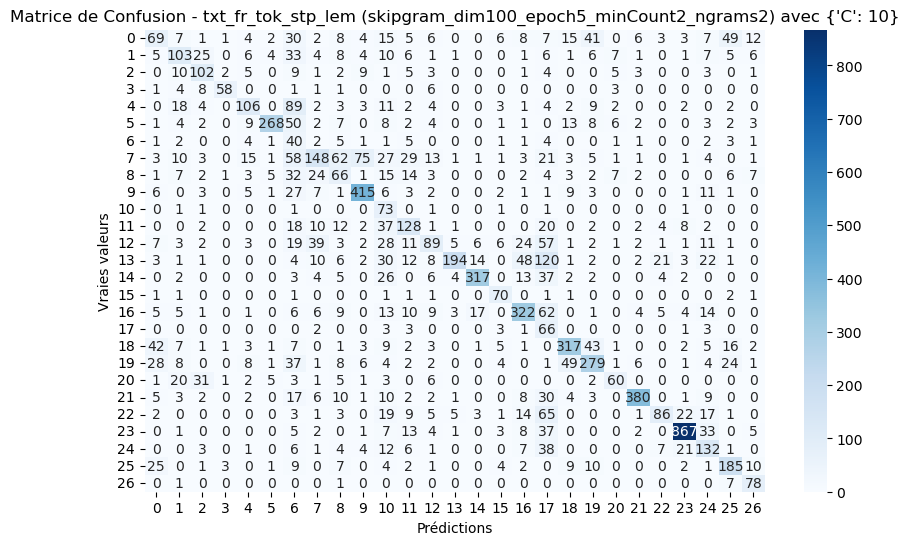


Configuration Spécifiée: txt_fr_tok_stp_lem - skipgram_dim100_epoch5_minCount2_ngrams2
F1 Score Weighted sur Validation: 0.6182
Hyperparamètre utilisé: {'C': 10}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.33      0.22      0.27       311
          40       0.47      0.41      0.44       251
          50       0.52      0.61      0.57       166
          60       0.87      0.70      0.77        83
        1140       0.60      0.40      0.48       267
        1160       0.92      0.68      0.78       396
        1180       0.08      0.53      0.14        76
        1280       0.54      0.30      0.39       487
        1281       0.28      0.32      0.30       207
        1300       0.78      0.82      0.80       505
        1301       0.20      0.91      0.32        80
        1302       0.47      0.51      0.49       249
        1320       0.49      0.27      0.35       324
        1560       0.90      0.38      0

In [16]:
# Meilleure configuration définie manuellement
best_col = "txt_fr_tok_stp_lem"
best_param = "skipgram_dim100_epoch5_minCount2_ngrams2"
best_params = {'C': 10}

# Dossier des vecteurs FastText rééquilibrés
vectorized_dir = "vectorized_data_fasttext"

# Chargement des embeddings (train rééquilibré + validation)
X_train_best = np.load(os.path.join(vectorized_dir, best_col, f"X_train_fasttext_resampled_{best_param}.npy"))
X_val_best = np.load(os.path.join(vectorized_dir, best_col, f"X_val_fasttext_{best_param}.npy"))

# Chargement des labels d'entraînement rééquilibrés
y_train_filepath = os.path.join(vectorized_dir, best_col, f"X_train_fasttext_resampled_{best_param}_y.csv")
y_train = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

# Entraînement du modèle LinearSVC
best_model = LinearSVC(class_weight='balanced', max_iter=5000, random_state=42, C=best_params['C'])
best_model.fit(X_train_best, y_train)

# Prédictions sur validation
y_pred_val = best_model.predict(X_val_best)

# Rapport de classification et matrice de confusion
best_classification_report = classification_report(y_val, y_pred_val)
best_confusion_matrix = confusion_matrix(y_val, y_pred_val)

# Affichage de la matrice de confusion
plt.figure(figsize=(10, 6))
sns.heatmap(best_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - {best_col} ({best_param}) avec {best_params}")
plt.show()

# Résumé des performances
print(f"\nConfiguration Spécifiée: {best_col} - {best_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val, average='weighted'):.4f}")
print(f"Hyperparamètre utilisé: {best_params}")
print("\nClassification Report sur Validation:\n", best_classification_report)


## Random Forest

### RF - Choix meilleur vectorisation

In [11]:
# Dossier des vecteurs FastText rééquilibrés
vectorized_dir = "vectorized_data_fasttext"

# Grille d'hyperparamètres pour Random Forest
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10, 20, None]
}

# Stockage des résultats
results = []

# Boucle sur les colonnes textuelles
for col in ["txt_0_tok_stp_lem", "txt_fr_tok_stp_lem"]:
    col_dir = os.path.join(vectorized_dir, col)

    # Boucle sur les fichiers de vecteurs rééquilibrés
    for filename in os.listdir(col_dir):
        if filename.startswith("X_train_fasttext_resampled_") and filename.endswith(".npy"):
            param_str = filename.replace("X_train_fasttext_resampled_", "").replace(".npy", "")

            # Chargement des vecteurs
            X_train_fasttext = np.load(os.path.join(col_dir, filename))

            # Chargement des labels rééquilibrés
            y_train_filepath = os.path.join(col_dir, f"X_train_fasttext_resampled_{param_str}_y.csv")
            if not os.path.exists(y_train_filepath):
                print(f"Labels manquants pour {param_str}, saut.")
                continue

            y_train = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

            # Initialisation de GridSearchCV avec RandomForestClassifier
            model = RandomForestClassifier(random_state=42, n_jobs=-1)
            grid_search = GridSearchCV(model, param_grid, cv=5, scoring='f1_weighted', n_jobs=-1, verbose=1)

            # Entraînement et recherche des meilleurs hyperparamètres
            grid_search.fit(X_train_fasttext, y_train)

            # Récupération des meilleurs résultats
            best_f1 = grid_search.best_score_
            best_params = grid_search.best_params_

            # Stockage des résultats
            results.append((col, param_str, best_f1, best_params))

# Compilation des résultats
df_results = pd.DataFrame(results, columns=["Text Column", "FastText Params", "F1 Score", "Best Params"])
df_results = df_results.sort_values(by="F1 Score", ascending=False)

# Sauvegarde et affichage
df_results.to_csv("df_results_fasttext_resampled_rf.csv", index=False)
display(df_results)

print("Recherche de la meilleure vectorisation FastText (rééquilibrée) avec Random Forest terminée.")


Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits


,Text Column,FastText Params,F1 Score,Best Params
0,txt_0_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams1,0.853370,"{'max_depth': None, 'n_estimators': 200}"
1,txt_0_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams2,0.852846,"{'max_depth': None, 'n_estimators': 200}"
3,txt_fr_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams2,0.846643,"{'max_depth': None, 'n_estimators': 200}"
2,txt_fr_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams1,0.846478,"{'max_depth': None, 'n_estimators': 200}"


 Recherche de la meilleure vectorisation FastText (rééquilibrée) avec Random Forest terminée.


### Evaluation RF - best vectorisation - Non traduit

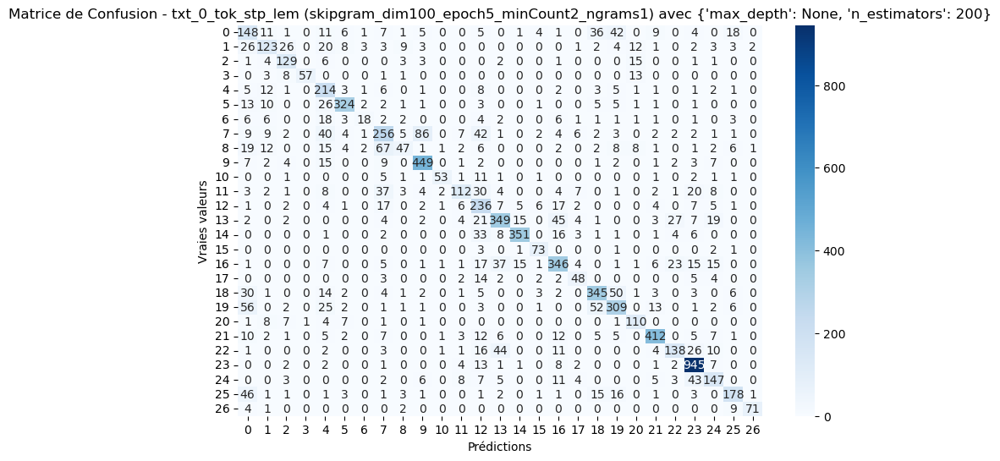


Meilleure configuration: txt_0_tok_stp_lem - skipgram_dim100_epoch5_minCount2_ngrams1
F1 Score Weighted sur Validation: 0.7069
Meilleurs hyperparamètres: {'max_depth': None, 'n_estimators': 200}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.38      0.48      0.42       311
          40       0.59      0.49      0.54       251
          50       0.67      0.78      0.72       166
          60       0.98      0.69      0.81        83
        1140       0.49      0.80      0.61       267
        1160       0.88      0.82      0.85       396
        1180       0.64      0.24      0.35        76
        1280       0.57      0.53      0.55       487
        1281       0.59      0.23      0.33       207
        1300       0.79      0.89      0.84       505
        1301       0.88      0.66      0.76        80
        1302       0.73      0.45      0.56       249
        1320       0.48      0.73      0.58       324
       

In [17]:
# Chargement des résultats GridSearch (FastText rééquilibré + RandomForest)
df_results_fasttext_resampled_rf = pd.read_csv("df_results_fasttext_resampled_rf.csv")
best_row = df_results_fasttext_resampled_rf.iloc[0]

# Meilleure configuration sélectionnée
best_col = best_row["Text Column"]
best_param = best_row["FastText Params"]
best_f1 = best_row["F1 Score"]
best_params = eval(best_row["Best Params"])

# Dossier des embeddings FastText
vectorized_dir = "vectorized_data_fasttext"

# Chargement des embeddings (train rééquilibré + validation)
X_train_best = np.load(os.path.join(vectorized_dir, best_col, f"X_train_fasttext_resampled_{best_param}.npy"))
X_val_best = np.load(os.path.join(vectorized_dir, best_col, f"X_val_fasttext_{best_param}.npy"))

# Chargement des labels rééquilibrés
y_train_filepath = os.path.join(vectorized_dir, best_col, f"X_train_fasttext_resampled_{best_param}_y.csv")
y_train = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

# Entraînement du modèle Random Forest
best_model = RandomForestClassifier(
    random_state=42,
    n_jobs=-1,
    n_estimators=best_params['n_estimators'],
    max_depth=best_params['max_depth']
)
best_model.fit(X_train_best, y_train)

# Prédictions sur validation
y_pred_val = best_model.predict(X_val_best)

# Rapport de classification et matrice de confusion
best_classification_report = classification_report(y_val, y_pred_val)
best_confusion_matrix = confusion_matrix(y_val, y_pred_val)

# Affichage de la matrice de confusion
plt.figure(figsize=(10, 6))
sns.heatmap(best_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - {best_col} ({best_param}) avec {best_params}")
plt.show()

# Résumé des performances
print(f"\nMeilleure configuration: {best_col} - {best_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val, average='weighted'):.4f}")
print(f"Meilleurs hyperparamètres: {best_params}")
print("\nClassification Report sur Validation:\n", best_classification_report)


### Evaluation LR - best vectorisation - Traduit FR

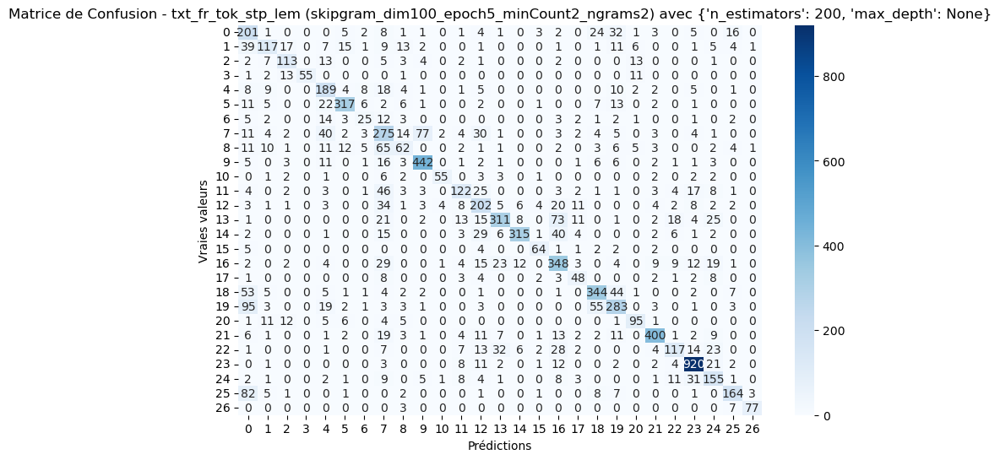


Configuration Spécifiée: txt_fr_tok_stp_lem - skipgram_dim100_epoch5_minCount2_ngrams2
F1 Score Weighted sur Validation: 0.6926
Hyperparamètres utilisés: {'n_estimators': 200, 'max_depth': None}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.36      0.65      0.47       311
          40       0.63      0.47      0.54       251
          50       0.67      0.68      0.67       166
          60       1.00      0.66      0.80        83
        1140       0.54      0.71      0.61       267
        1160       0.85      0.80      0.83       396
        1180       0.46      0.33      0.38        76
        1280       0.44      0.56      0.50       487
        1281       0.46      0.30      0.36       207
        1300       0.81      0.88      0.84       505
        1301       0.87      0.69      0.77        80
        1302       0.64      0.49      0.55       249
        1320       0.52      0.62      0.57       324
       

In [18]:
# Meilleure configuration définie manuellement
best_col = "txt_fr_tok_stp_lem"
best_param = "skipgram_dim100_epoch5_minCount2_ngrams2"
best_params = {'n_estimators': 200, 'max_depth': None}

# Dossier des vecteurs FastText rééquilibrés
vectorized_dir = "vectorized_data_fasttext"

# Chargement des embeddings (train rééquilibré + validation)
X_train_best = np.load(os.path.join(vectorized_dir, best_col, f"X_train_fasttext_resampled_{best_param}.npy"))
X_val_best = np.load(os.path.join(vectorized_dir, best_col, f"X_val_fasttext_{best_param}.npy"))

# Chargement des labels d'entraînement rééquilibrés
y_train_filepath = os.path.join(vectorized_dir, best_col, f"X_train_fasttext_resampled_{best_param}_y.csv")
y_train = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

# Entraînement du modèle RandomForest
best_model = RandomForestClassifier(
    random_state=42,
    n_jobs=-1,
    n_estimators=best_params['n_estimators'],
    max_depth=best_params['max_depth']
)
best_model.fit(X_train_best, y_train)

# Prédictions sur validation
y_pred_val = best_model.predict(X_val_best)

# Rapport de classification et matrice de confusion
best_classification_report = classification_report(y_val, y_pred_val)
best_confusion_matrix = confusion_matrix(y_val, y_pred_val)

# Affichage de la matrice de confusion
plt.figure(figsize=(10, 6))
sns.heatmap(best_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - {best_col} ({best_param}) avec {best_params}")
plt.show()

# Résumé des performances
print(f"\nConfiguration Spécifiée: {best_col} - {best_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val, average='weighted'):.4f}")
print(f"Hyperparamètres utilisés: {best_params}")
print("\nClassification Report sur Validation:\n", best_classification_report)


## Logistic Regression

### LR - Choix meilleur vectorisation

In [19]:
# Dossier des vecteurs FastText rééquilibrés
vectorized_dir = "vectorized_data_fasttext"

# Grille d'hyperparamètres pour SGDClassifier (régression logistique)
sgd_param_grid = {
    'alpha': [1e-3, 1e-2],
    'penalty': ['l2'],
    'loss': ['log_loss'],
    'max_iter': [1000]
}

# Stockage des résultats
results = []

# Boucle sur les colonnes textuelles
for col in ["txt_0_tok_stp_lem", "txt_fr_tok_stp_lem"]:
    col_dir = os.path.join(vectorized_dir, col)

    # Boucle sur les fichiers de vecteurs rééquilibrés
    for filename in os.listdir(col_dir):
        if filename.startswith("X_train_fasttext_resampled_") and filename.endswith(".npy"):
            param_str = filename.replace("X_train_fasttext_resampled_", "").replace(".npy", "")

            # Chargement des vecteurs
            X_train_fasttext = np.load(os.path.join(col_dir, filename))

            # Chargement des labels rééquilibrés
            y_train_filepath = os.path.join(col_dir, f"X_train_fasttext_resampled_{param_str}_y.csv")
            if not os.path.exists(y_train_filepath):
                print(f"Labels manquants pour {param_str}, saut.")
                continue

            y_train = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

            # Initialisation de GridSearchCV avec SGDClassifier
            model = SGDClassifier(random_state=42)
            grid_search = GridSearchCV(model, sgd_param_grid, cv=5, scoring='f1_weighted', n_jobs=-1, verbose=1)

            # Entraînement et recherche des meilleurs hyperparamètres
            grid_search.fit(X_train_fasttext, y_train)

            # Sauvegarde des résultats
            best_f1 = grid_search.best_score_
            best_params = grid_search.best_params_
            results.append((col, param_str, best_f1, best_params))

# Compilation des résultats
df_results = pd.DataFrame(results, columns=["Text Column", "FastText Params", "F1 Score", "Best Params"])
df_results = df_results.sort_values(by="F1 Score", ascending=False)
df_results.to_csv("df_results_fasttext_resampled_sgd.csv", index=False)

# Affichage
display(df_results)
print("Recherche de la meilleure vectorisation FastText (rééquilibrée) avec SGDClassifier terminée.")


Fitting 5 folds for each of 2 candidates, totalling 10 fits
Fitting 5 folds for each of 2 candidates, totalling 10 fits
Fitting 5 folds for each of 2 candidates, totalling 10 fits
Fitting 5 folds for each of 2 candidates, totalling 10 fits


,Text Column,FastText Params,F1 Score,Best Params
0,txt_0_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams1,0.674773,"{'alpha': 0.001, 'loss': 'log_loss', 'max_iter..."
1,txt_0_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams2,0.674064,"{'alpha': 0.001, 'loss': 'log_loss', 'max_iter..."
2,txt_fr_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams1,0.669624,"{'alpha': 0.001, 'loss': 'log_loss', 'max_iter..."
3,txt_fr_tok_stp_lem,skipgram_dim100_epoch5_minCount2_ngrams2,0.668545,"{'alpha': 0.001, 'loss': 'log_loss', 'max_iter..."


 Recherche de la meilleure vectorisation FastText (rééquilibrée) avec SGDClassifier terminée.


### Evaluation LR - best vectorisation - Non traduit

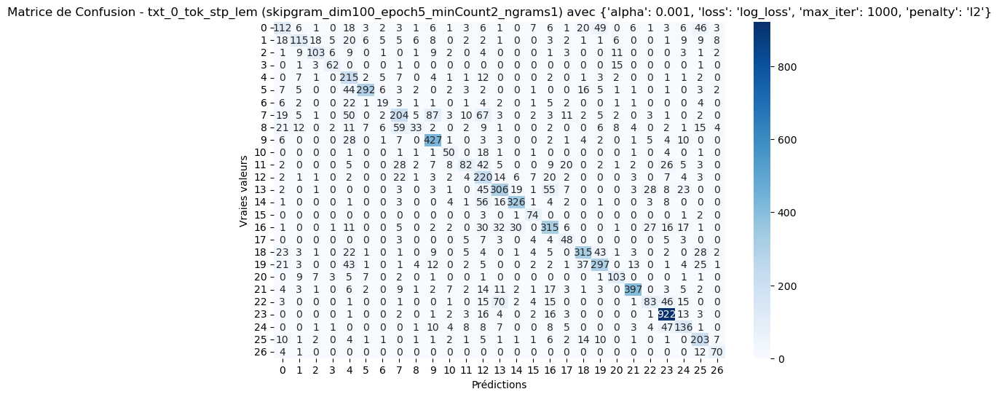


Meilleure configuration: txt_0_tok_stp_lem - skipgram_dim100_epoch5_minCount2_ngrams1
F1 Score Weighted sur Validation: 0.6505
Meilleurs hyperparamètres: {'alpha': 0.001, 'loss': 'log_loss', 'max_iter': 1000, 'penalty': 'l2'}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.43      0.36      0.39       311
          40       0.63      0.46      0.53       251
          50       0.73      0.62      0.67       166
          60       0.78      0.75      0.76        83
        1140       0.41      0.81      0.55       267
        1160       0.90      0.74      0.81       396
        1180       0.40      0.25      0.31        76
        1280       0.55      0.42      0.47       487
        1281       0.55      0.16      0.25       207
        1300       0.72      0.85      0.78       505
        1301       0.54      0.62      0.58        80
        1302       0.61      0.33      0.43       249
        1320       0.37      0

In [20]:
# Résultats GridSearch FastText rééquilibré avec SGDClassifier
df_results_fasttext_resampled_sgd = pd.read_csv("df_results_fasttext_resampled_sgd.csv")

# Meilleure configuration sélectionnée
best_row = df_results_fasttext_resampled_sgd.iloc[0]
best_col = best_row["Text Column"]
best_param = best_row["FastText Params"]
best_params = eval(best_row["Best Params"])

# Chargement des vecteurs FastText (train rééquilibré + validation)
vectorized_dir = "vectorized_data_fasttext"
X_train_best = np.load(os.path.join(vectorized_dir, best_col, f"X_train_fasttext_resampled_{best_param}.npy"))
X_val_best = np.load(os.path.join(vectorized_dir, best_col, f"X_val_fasttext_{best_param}.npy"))

# Chargement des labels d'entraînement
y_train_filepath = os.path.join(vectorized_dir, best_col, f"X_train_fasttext_resampled_{best_param}_y.csv")
y_train = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

# Entraînement du modèle SGDClassifier (régression logistique)
best_model = SGDClassifier(
    random_state=42,
    alpha=best_params['alpha'],
    penalty=best_params['penalty'],
    loss=best_params['loss'],
    max_iter=best_params['max_iter']
)
best_model.fit(X_train_best, y_train)

# Prédictions sur les données de validation
y_pred_val = best_model.predict(X_val_best)

# Rapport de classification et matrice de confusion
best_classification_report = classification_report(y_val, y_pred_val)
best_confusion_matrix = confusion_matrix(y_val, y_pred_val)

# Affichage de la matrice de confusion
plt.figure(figsize=(10, 6))
sns.heatmap(best_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - {best_col} ({best_param}) avec {best_params}")
plt.show()

# Résumé des performances
print(f"\nMeilleure configuration: {best_col} - {best_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val, average='weighted'):.4f}")
print(f"Meilleurs hyperparamètres: {best_params}")
print("\nClassification Report sur Validation:\n", best_classification_report)


### Evaluation LR - best vectorisation - Traduit FR

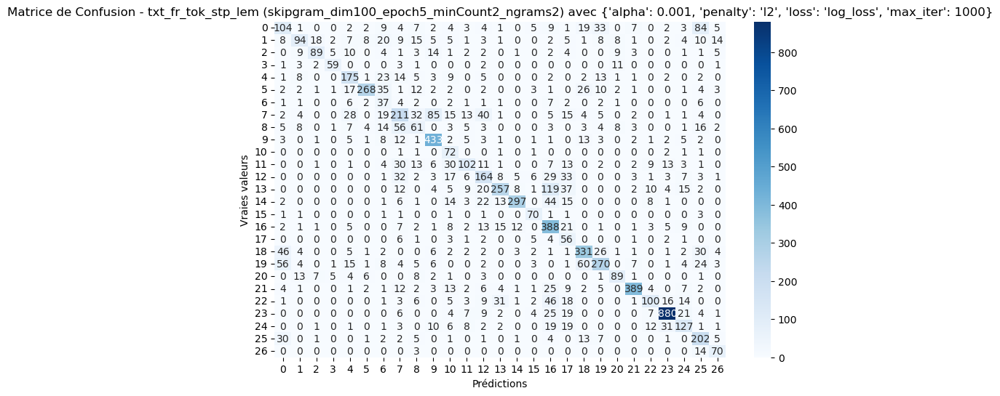


Configuration Spécifiée: txt_fr_tok_stp_lem - skipgram_dim100_epoch5_minCount2_ngrams2
F1 Score Weighted sur Validation: 0.6452
Hyperparamètres utilisés: {'alpha': 0.001, 'penalty': 'l2', 'loss': 'log_loss', 'max_iter': 1000}

Classification Report sur Validation:
               precision    recall  f1-score   support

          10       0.39      0.33      0.36       311
          40       0.61      0.37      0.46       251
          50       0.73      0.54      0.62       166
          60       0.80      0.71      0.75        83
        1140       0.61      0.66      0.63       267
        1160       0.90      0.68      0.77       396
        1180       0.19      0.49      0.28        76
        1280       0.48      0.43      0.46       487
        1281       0.32      0.29      0.31       207
        1300       0.74      0.86      0.79       505
        1301       0.32      0.90      0.47        80
        1302       0.58      0.41      0.48       249
        1320       0.49      0

In [21]:
# Configuration manuelle du meilleur modèle
best_col = "txt_fr_tok_stp_lem"
best_param = "skipgram_dim100_epoch5_minCount2_ngrams2"
best_params = {'alpha': 1e-3, 'penalty': 'l2', 'loss': 'log_loss', 'max_iter': 1000}

# Répertoire des données vectorisées
vectorized_dir = "vectorized_data_fasttext"

# Chargement des vecteurs d'entraînement et validation
X_train_best = np.load(os.path.join(vectorized_dir, best_col, f"X_train_fasttext_resampled_{best_param}.npy"))
X_val_best = np.load(os.path.join(vectorized_dir, best_col, f"X_val_fasttext_{best_param}.npy"))

# Chargement des labels rééquilibrés d'entraînement
y_train_filepath = os.path.join(vectorized_dir, best_col, f"X_train_fasttext_resampled_{best_param}_y.csv")
y_train = pd.read_csv(y_train_filepath, header=None).iloc[:, 0].values

# Entraînement du modèle SGDClassifier (régression logistique)
best_model = SGDClassifier(
    random_state=42,
    alpha=best_params['alpha'],
    penalty=best_params['penalty'],
    loss=best_params['loss'],
    max_iter=best_params['max_iter']
)
best_model.fit(X_train_best, y_train)

# Prédictions sur la validation
y_pred_val = best_model.predict(X_val_best)

# Rapport de classification et matrice de confusion
best_classification_report = classification_report(y_val, y_pred_val)
best_confusion_matrix = confusion_matrix(y_val, y_pred_val)

# Heatmap de la matrice de confusion
plt.figure(figsize=(10, 6))
sns.heatmap(best_confusion_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title(f"Matrice de Confusion - {best_col} ({best_param}) avec {best_params}")
plt.show()

# Résumé des performances
print(f"\nConfiguration Spécifiée: {best_col} - {best_param}")
print(f"F1 Score Weighted sur Validation: {f1_score(y_val, y_pred_val, average='weighted'):.4f}")
print(f"Hyperparamètres utilisés: {best_params}")
print("\nClassification Report sur Validation:\n", best_classification_report)


# **Modele fasttext directement et vectorisation interne**
FastText supervisé (train_supervised())
→ Pas besoin de rééchantillonnage

In [57]:
#  Catégories des produits (Mapping code → Nom)
labelcat = {
    10: "Livre occasion",
    40: "Jeu vidéo, accessoire tech.",
    50: "Accessoire Console",
    60: "Console de jeu",
    1140: "Figurine",
    1160: "Carte Collection",
    1180: "Jeu Plateau",
    1280: "Jouet enfant, déguisement",
    1281: "Jeu de société",
    1300: "Jouet tech",
    1301: "Paire de chaussettes",
    1302: "Jeu extérieur, vêtement",
    1320: "Autour du bébé",
    1560: "Mobilier intérieur",
    1920: "Chambre",
    1940: "Cuisine",
    2060: "Décoration intérieure",
    2220: "Animal",
    2280: "Revues et journaux",
    2403: "Magazines, livres et BDs",
    2462: "Jeu occasion",
    2522: "Bureautique et papeterie",
    2582: "Mobilier extérieur",
    2583: "Autour de la piscine",
    2585: "Bricolage",
    2705: "Livre neuf",
    2905: "Jeu PC",
}

#  Chemins des fichiers
train_file = "fasttext_train.txt"
val_file = "fasttext_val.txt"

## Learning rate optimisation

### lr=0.1


 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.83      0.80      0.81       166
                     Animal       0.83      0.78      0.81        82
       Autour de la piscine       0.97      0.96      0.97       989
             Autour du bébé       0.81      0.77      0.79       324
                  Bricolage       0.75      0.79      0.77       244
   Bureautique et papeterie       0.92      0.92      0.92       496
           Carte Collection       0.89      0.88      0.89       396
                    Chambre       0.93      0.91      0.92       427
             Console de jeu       0.91      0.84      0.88        83
                    Cuisine       0.87      0.83      0.85        81
      Décoration intérieure       0.80      0.81      0.80       497
                   Figurine       0.74      0.79      0.77       267
                     Jeu PC       0.96      1.00      0.98        87
   

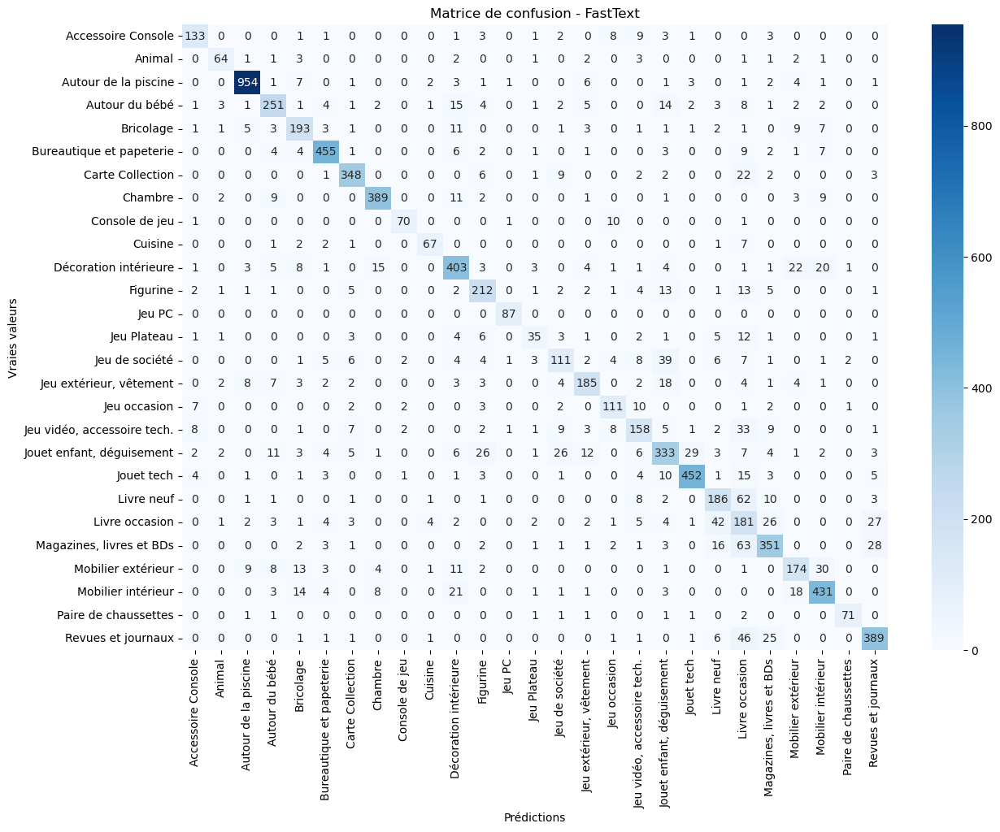


 F1 Score (weighted) sur validation : 0.8086


In [85]:
# Conversion au format FastText supervisé
def save_fasttext_format(df, labels, filename):
    with open(filename, "w", encoding="utf-8") as f:
        for text, label in zip(df["txt_fr_tok_stp_lem"], labels):
            f.write(f"__label__{label} {text}\n")

# Sauvegarde des fichiers d'entraînement et validation
save_fasttext_format(X_train, y_train, train_file)
save_fasttext_format(X_val, y_val, val_file)

# Entraînement du modèle FastText supervisé
model = fasttext.train_supervised(
    input=train_file,
    lr=0.1,
    epoch=50,
    wordNgrams=2,
    dim=100,
    loss="softmax"
)

# Sauvegarde du modèle
model.save_model("fasttext_supervised.bin")

# Évaluation du modèle FastText
def evaluate_fasttext(model, val_file, y_true):
    preds = []
    with open(val_file, "r", encoding="utf-8") as f:
        for line in f:
            text = line.split(" ", 1)[1].strip()
            pred = model.predict(text)[0][0]
            preds.append(int(pred.replace("__label__", "")))

    y_true_labels = [labelcat.get(code) for code in y_true]
    y_pred_labels = [labelcat.get(code) for code in preds]

    weighted_f1 = f1_score(y_true_labels, y_pred_labels, average="weighted")

    print("\nRapport de classification :")
    print(classification_report(y_true_labels, y_pred_labels))

    sorted_labels = sorted(labelcat.values())
    cm = confusion_matrix(y_true_labels, y_pred_labels, labels=sorted_labels)

    plt.figure(figsize=(14, 10))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=sorted_labels, yticklabels=sorted_labels)
    plt.xlabel("Prédictions")
    plt.ylabel("Vraies valeurs")
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.title("Matrice de confusion - FastText")
    plt.show()

    return weighted_f1

# Évaluation sur validation
f1 = evaluate_fasttext(model, val_file, y_val)
print(f"\nF1 Score (weighted) sur validation : {f1:.4f}")


### lr=0.01


 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.74      0.67      0.70       166
                     Animal       0.00      0.00      0.00        82
       Autour de la piscine       0.92      0.96      0.94       989
             Autour du bébé       0.67      0.70      0.69       324
                  Bricolage       0.57      0.52      0.54       244
   Bureautique et papeterie       0.88      0.91      0.89       496
           Carte Collection       0.91      0.86      0.88       396
                    Chambre       0.86      0.85      0.85       427
             Console de jeu       0.59      0.78      0.67        83
                    Cuisine       0.85      0.21      0.34        81
      Décoration intérieure       0.63      0.79      0.70       497
                   Figurine       0.71      0.74      0.72       267
                     Jeu PC       1.00      0.36      0.53        87
   

C:\Users\rudy_\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\rudy_\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\rudy_\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


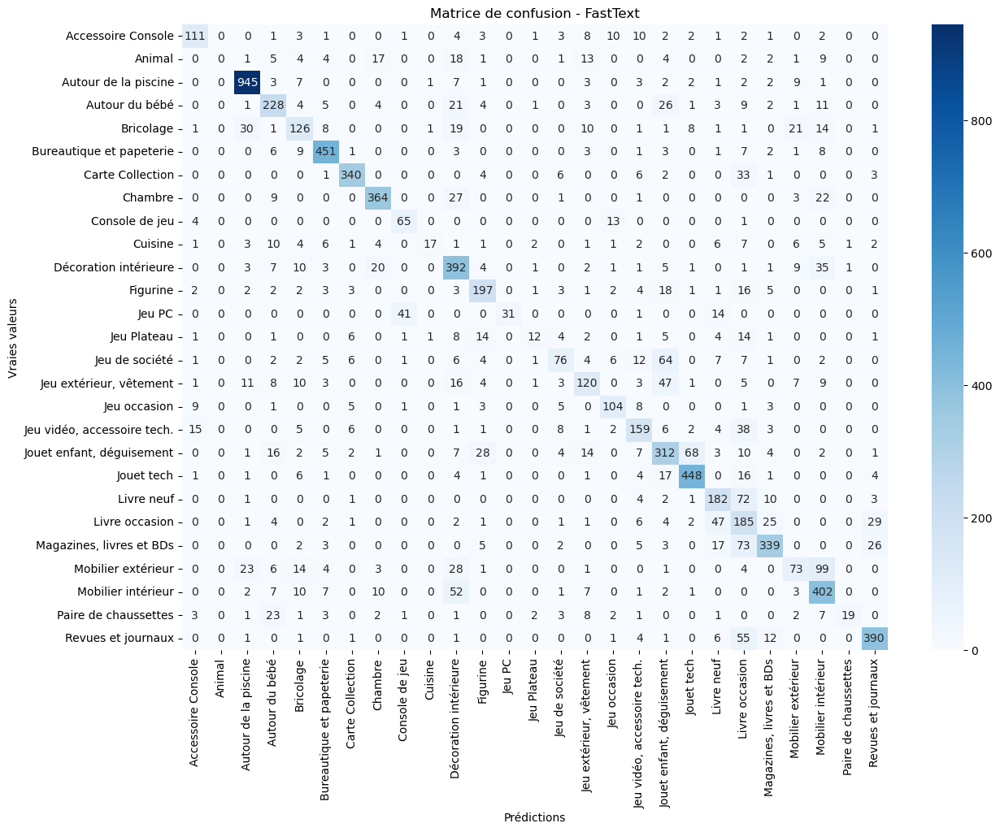


 F1 Score (weighted) sur validation : 0.7137


In [86]:
# Fonction pour formater les données en format FastText supervisé
def save_fasttext_format(df, labels, filename):
    with open(filename, "w", encoding="utf-8") as f:
        for text, label in zip(df["txt_fr_tok_stp_lem"], labels):
            f.write(f"__label__{label} {text}\n")

# Sauvegarde des fichiers FastText (train / val)
save_fasttext_format(X_train, y_train, train_file)
save_fasttext_format(X_val, y_val, val_file)

# Entraînement du modèle FastText supervisé
model = fasttext.train_supervised(
    input=train_file,
    lr=0.01,
    epoch=50,
    wordNgrams=2,
    dim=100,
    loss="softmax"
)

# Sauvegarde du modèle entraîné
model.save_model("fasttext_supervised.bin")

# Évaluation du modèle FastText
def evaluate_fasttext(model, val_file, y_true):
    preds = []
    with open(val_file, "r", encoding="utf-8") as f:
        for line in f:
            text = line.split(" ", 1)[1].strip()
            pred = model.predict(text)[0][0]
            preds.append(int(pred.replace("__label__", "")))

    y_true_labels = [labelcat.get(code) for code in y_true]
    y_pred_labels = [labelcat.get(code) for code in preds]

    weighted_f1 = f1_score(y_true_labels, y_pred_labels, average="weighted")

    print("\nRapport de classification :")
    print(classification_report(y_true_labels, y_pred_labels))

    sorted_labels = sorted(labelcat.values())
    cm = confusion_matrix(y_true_labels, y_pred_labels, labels=sorted_labels)

    plt.figure(figsize=(14, 10))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=sorted_labels, yticklabels=sorted_labels)
    plt.xlabel("Prédictions")
    plt.ylabel("Vraies valeurs")
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.title("Matrice de confusion - FastText")
    plt.show()

    return weighted_f1

# Évaluation finale sur l’ensemble de validation
f1 = evaluate_fasttext(model, val_file, y_val)
print(f"\nF1 Score (weighted) sur validation : {f1:.4f}")


### lr=0.3


 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.84      0.77      0.80       166
                     Animal       0.82      0.80      0.81        82
       Autour de la piscine       0.96      0.97      0.97       989
             Autour du bébé       0.82      0.80      0.81       324
                  Bricolage       0.78      0.78      0.78       244
   Bureautique et papeterie       0.93      0.93      0.93       496
           Carte Collection       0.90      0.88      0.89       396
                    Chambre       0.93      0.91      0.92       427
             Console de jeu       0.90      0.86      0.88        83
                    Cuisine       0.92      0.83      0.87        81
      Décoration intérieure       0.81      0.83      0.82       497
                   Figurine       0.75      0.81      0.78       267
                     Jeu PC       0.96      1.00      0.98        87
   

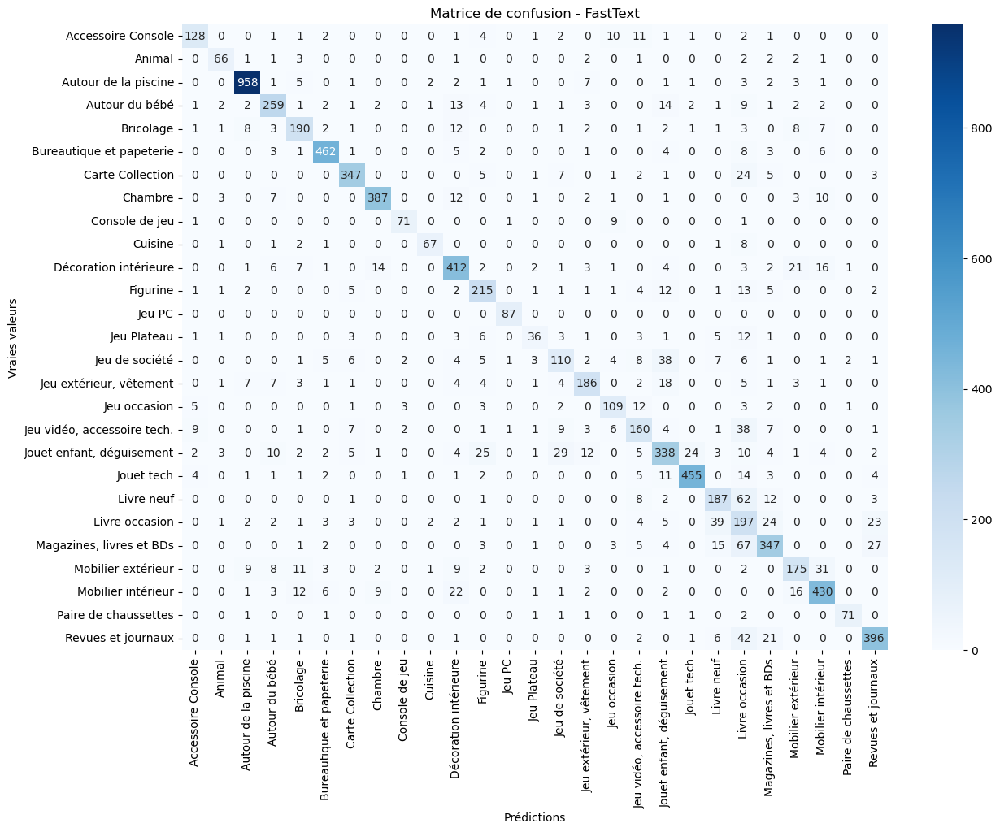


 F1 Score (weighted) sur validation : 0.8154


In [87]:
# Fonction pour formater les données au format supervisé de FastText
def save_fasttext_format(df, labels, filename):
    with open(filename, "w", encoding="utf-8") as f:
        for text, label in zip(df["txt_fr_tok_stp_lem"], labels):
            f.write(f"__label__{label} {text}\n")

# Sauvegarde des fichiers d'entraînement et de validation
save_fasttext_format(X_train, y_train, train_file)
save_fasttext_format(X_val, y_val, val_file)

# Entraînement du modèle FastText supervisé
model = fasttext.train_supervised(
    input=train_file,
    lr=0.3,
    epoch=50,
    wordNgrams=2,
    dim=100,
    loss="softmax"
)

# Sauvegarde du modèle entraîné
model.save_model("fasttext_supervised.bin")

# Fonction d'évaluation du modèle FastText avec étiquettes textuelles
def evaluate_fasttext(model, val_file, y_true):
    preds = []
    with open(val_file, "r", encoding="utf-8") as f:
        for line in f:
            text = line.split(" ", 1)[1].strip()
            pred = model.predict(text)[0][0]
            preds.append(int(pred.replace("__label__", "")))

    y_true_labels = [labelcat.get(code) for code in y_true]
    y_pred_labels = [labelcat.get(code) for code in preds]

    weighted_f1 = f1_score(y_true_labels, y_pred_labels, average="weighted")

    print("\nRapport de classification :")
    print(classification_report(y_true_labels, y_pred_labels))

    sorted_labels = sorted(labelcat.values())
    cm = confusion_matrix(y_true_labels, y_pred_labels, labels=sorted_labels)

    plt.figure(figsize=(14, 10))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=sorted_labels, yticklabels=sorted_labels)
    plt.xlabel("Prédictions")
    plt.ylabel("Vraies valeurs")
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.title("Matrice de confusion - FastText")
    plt.show()

    return weighted_f1

# Évaluation finale sur le jeu de validation
f1 = evaluate_fasttext(model, val_file, y_val)
print(f"\nF1 Score (weighted) sur validation : {f1:.4f}")


### lr=0.5


 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.86      0.79      0.82       166
                     Animal       0.87      0.80      0.84        82
       Autour de la piscine       0.97      0.97      0.97       989
             Autour du bébé       0.80      0.80      0.80       324
                  Bricolage       0.77      0.78      0.78       244
   Bureautique et papeterie       0.91      0.93      0.92       496
           Carte Collection       0.91      0.87      0.89       396
                    Chambre       0.92      0.91      0.92       427
             Console de jeu       0.89      0.86      0.87        83
                    Cuisine       0.89      0.83      0.86        81
      Décoration intérieure       0.79      0.82      0.81       497
                   Figurine       0.76      0.78      0.77       267
                     Jeu PC       0.97      1.00      0.98        87
   

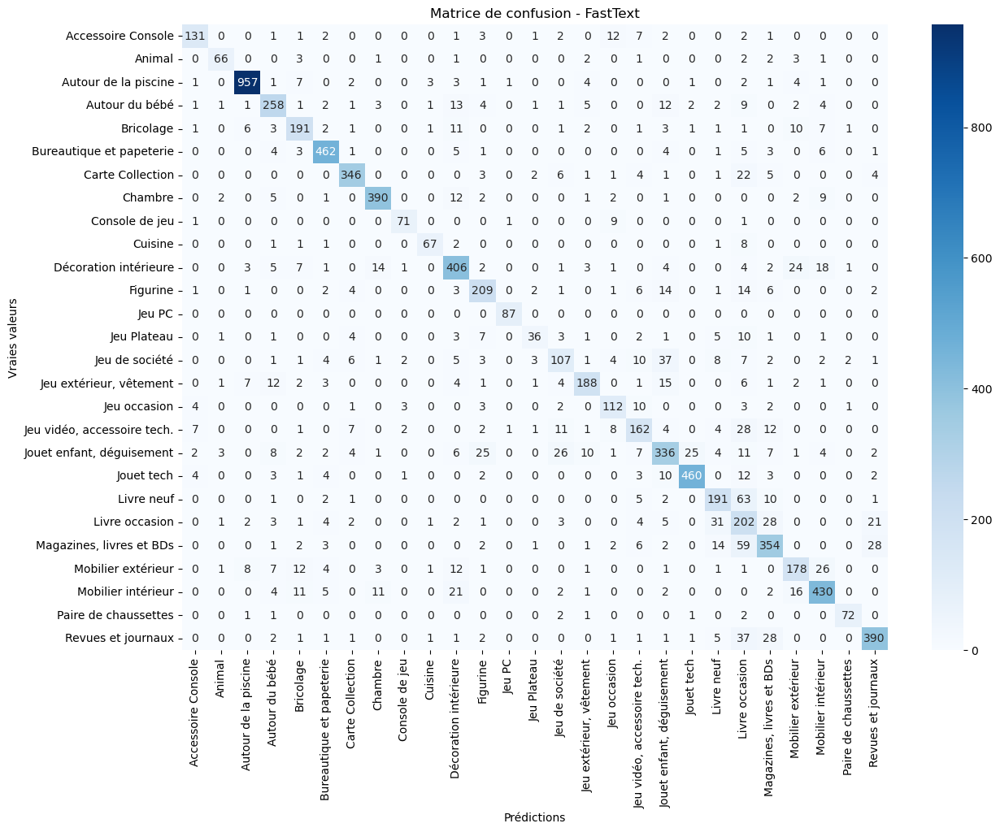


 F1 Score (weighted) sur validation : 0.8161


In [88]:
# Fonction pour formater les données au format supervisé de FastText
def save_fasttext_format(df, labels, filename):
    with open(filename, "w", encoding="utf-8") as f:
        for text, label in zip(df["txt_fr_tok_stp_lem"], labels):
            f.write(f"__label__{label} {text}\n")

# Sauvegarde des fichiers d'entraînement et de validation
save_fasttext_format(X_train, y_train, train_file)
save_fasttext_format(X_val, y_val, val_file)

# Entraînement du modèle FastText supervisé
model = fasttext.train_supervised(
    input=train_file,
    lr=0.5,
    epoch=50,
    wordNgrams=2,
    dim=100,
    loss="softmax"
)

# Sauvegarde du modèle entraîné
model.save_model("fasttext_supervised.bin")

# Fonction d'évaluation du modèle FastText avec étiquettes textuelles
def evaluate_fasttext(model, val_file, y_true):
    preds = []
    with open(val_file, "r", encoding="utf-8") as f:
        for line in f:
            text = line.split(" ", 1)[1].strip()
            pred = model.predict(text)[0][0]
            preds.append(int(pred.replace("__label__", "")))

    y_true_labels = [labelcat.get(code) for code in y_true]
    y_pred_labels = [labelcat.get(code) for code in preds]

    weighted_f1 = f1_score(y_true_labels, y_pred_labels, average="weighted")

    print("\nRapport de classification :")
    print(classification_report(y_true_labels, y_pred_labels))

    sorted_labels = sorted(labelcat.values())
    cm = confusion_matrix(y_true_labels, y_pred_labels, labels=sorted_labels)

    plt.figure(figsize=(14, 10))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=sorted_labels, yticklabels=sorted_labels)
    plt.xlabel("Prédictions")
    plt.ylabel("Vraies valeurs")
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.title("Matrice de confusion - FastText")
    plt.show()

    return weighted_f1

# Évaluation finale sur le jeu de validation
f1 = evaluate_fasttext(model, val_file, y_val)
print(f"\nF1 Score (weighted) sur validation : {f1:.4f}")


## DIM

### dim=150


 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.83      0.78      0.80       166
                     Animal       0.85      0.82      0.83        82
       Autour de la piscine       0.97      0.97      0.97       989
             Autour du bébé       0.80      0.80      0.80       324
                  Bricolage       0.76      0.79      0.78       244
   Bureautique et papeterie       0.92      0.93      0.92       496
           Carte Collection       0.91      0.87      0.89       396
                    Chambre       0.93      0.90      0.91       427
             Console de jeu       0.92      0.84      0.88        83
                    Cuisine       0.87      0.84      0.86        81
      Décoration intérieure       0.80      0.82      0.81       497
                   Figurine       0.74      0.78      0.76       267
                     Jeu PC       0.96      1.00      0.98        87
   

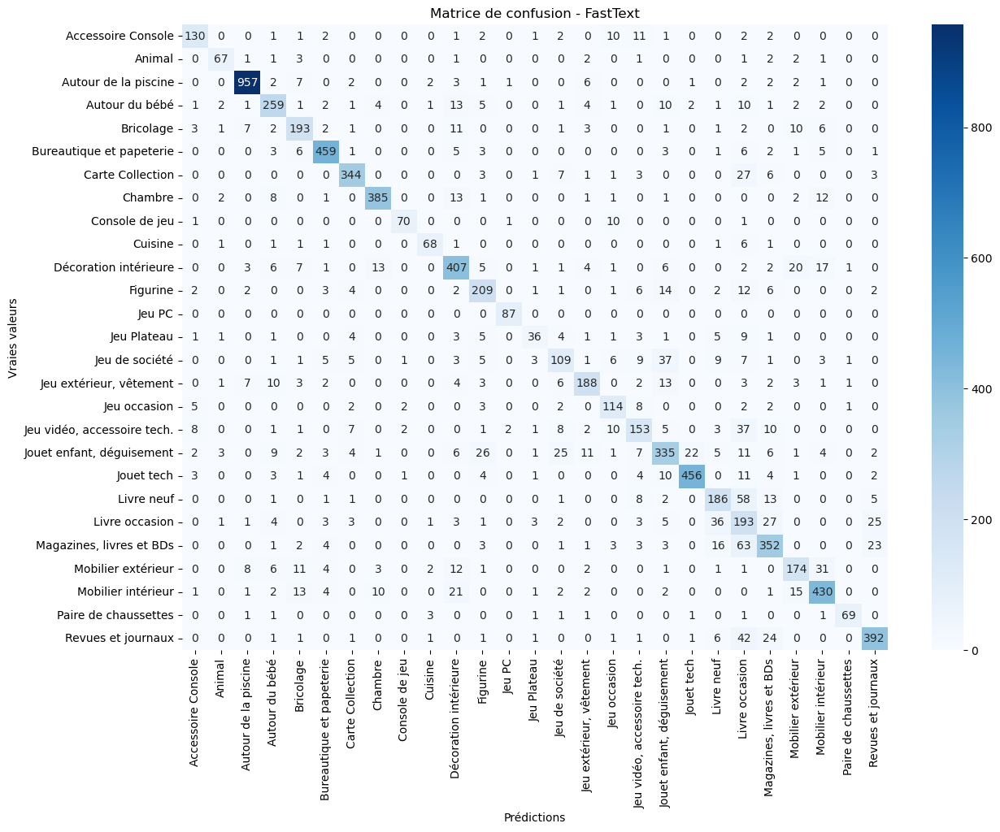


 F1 Score (weighted) sur validation : 0.8120


In [89]:
# Fonction pour formater les données au format FastText supervisé
def save_fasttext_format(df, labels, filename):
    with open(filename, "w", encoding="utf-8") as f:
        for text, label in zip(df["txt_fr_tok_stp_lem"], labels):
            f.write(f"__label__{label} {text}\n")

# Sauvegarde des fichiers d'entraînement et de validation
save_fasttext_format(X_train, y_train, train_file)
save_fasttext_format(X_val, y_val, val_file)

# Entraînement du modèle FastText supervisé
model = fasttext.train_supervised(
    input=train_file,
    lr=0.5,
    epoch=50,
    wordNgrams=2,
    dim=150,
    loss="softmax"
)

# Sauvegarde du modèle
model.save_model("fasttext_supervised.bin")

# Fonction d'évaluation du modèle FastText avec labels textuels
def evaluate_fasttext(model, val_file, y_true):
    preds = []
    with open(val_file, "r", encoding="utf-8") as f:
        for line in f:
            text = line.split(" ", 1)[1].strip()
            pred = model.predict(text)[0][0]
            preds.append(int(pred.replace("__label__", "")))

    y_true_labels = [labelcat.get(code) for code in y_true]
    y_pred_labels = [labelcat.get(code) for code in preds]

    weighted_f1 = f1_score(y_true_labels, y_pred_labels, average="weighted")

    print("\nRapport de classification :")
    print(classification_report(y_true_labels, y_pred_labels))

    sorted_labels = sorted(labelcat.values())
    cm = confusion_matrix(y_true_labels, y_pred_labels, labels=sorted_labels)

    plt.figure(figsize=(14, 10))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=sorted_labels, yticklabels=sorted_labels)
    plt.xlabel("Prédictions")
    plt.ylabel("Vraies valeurs")
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.title("Matrice de confusion - FastText")
    plt.show()

    return weighted_f1

# Évaluation du modèle sur le jeu de validation
f1 = evaluate_fasttext(model, val_file, y_val)
print(f"\nF1 Score (weighted) sur validation : {f1:.4f}")


### dim=200


 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.84      0.77      0.80       166
                     Animal       0.87      0.80      0.84        82
       Autour de la piscine       0.97      0.97      0.97       989
             Autour du bébé       0.79      0.79      0.79       324
                  Bricolage       0.77      0.78      0.78       244
   Bureautique et papeterie       0.92      0.92      0.92       496
           Carte Collection       0.91      0.86      0.89       396
                    Chambre       0.93      0.91      0.92       427
             Console de jeu       0.92      0.86      0.89        83
                    Cuisine       0.90      0.86      0.88        81
      Décoration intérieure       0.80      0.82      0.81       497
                   Figurine       0.76      0.80      0.78       267
                     Jeu PC       0.97      1.00      0.98        87
   

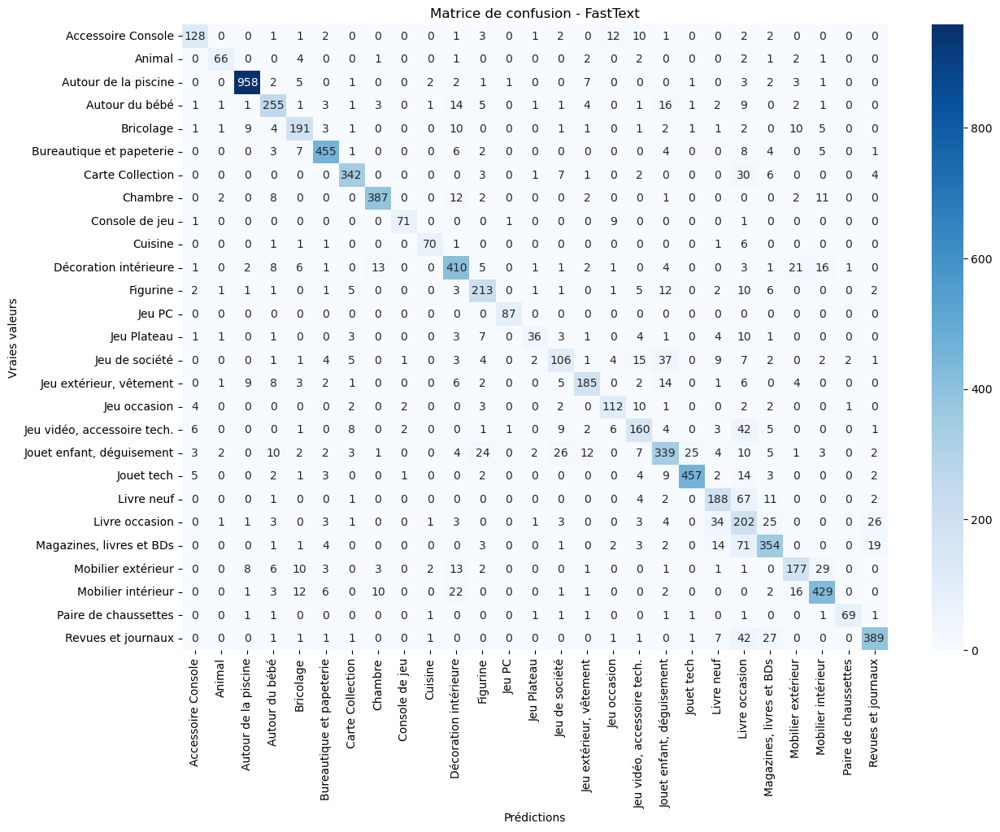


 F1 Score (weighted) sur validation : 0.8145


In [90]:
# Fonction pour formater les données au format FastText supervisé
def save_fasttext_format(df, labels, filename):
    with open(filename, "w", encoding="utf-8") as f:
        for text, label in zip(df["txt_fr_tok_stp_lem"], labels):
            f.write(f"__label__{label} {text}\n")

# Sauvegarde des fichiers d'entraînement et de validation
save_fasttext_format(X_train, y_train, train_file)
save_fasttext_format(X_val, y_val, val_file)

# Entraînement du modèle FastText supervisé
model = fasttext.train_supervised(
    input=train_file,
    lr=0.5,
    epoch=50,
    wordNgrams=2,
    dim=200,
    loss="softmax"
)

# Sauvegarde du modèle entraîné
model.save_model("fasttext_supervised.bin")

# Fonction d'évaluation du modèle FastText avec noms de catégories
def evaluate_fasttext(model, val_file, y_true):
    preds = []
    with open(val_file, "r", encoding="utf-8") as f:
        for line in f:
            text = line.split(" ", 1)[1].strip()
            pred = model.predict(text)[0][0]
            preds.append(int(pred.replace("__label__", "")))

    y_true_labels = [labelcat.get(code) for code in y_true]
    y_pred_labels = [labelcat.get(code) for code in preds]

    weighted_f1 = f1_score(y_true_labels, y_pred_labels, average="weighted")

    print("\nRapport de classification :")
    print(classification_report(y_true_labels, y_pred_labels))

    sorted_labels = sorted(labelcat.values())
    cm = confusion_matrix(y_true_labels, y_pred_labels, labels=sorted_labels)

    plt.figure(figsize=(14, 10))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=sorted_labels, yticklabels=sorted_labels)
    plt.xlabel("Prédictions")
    plt.ylabel("Vraies valeurs")
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.title("Matrice de confusion - FastText")
    plt.show()

    return weighted_f1

# Évaluation sur le jeu de validation
f1 = evaluate_fasttext(model, val_file, y_val)
print(f"\nF1 Score (weighted) sur validation : {f1:.4f}")


### dim=300


 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.83      0.78      0.80       166
                     Animal       0.86      0.79      0.82        82
       Autour de la piscine       0.97      0.97      0.97       989
             Autour du bébé       0.81      0.80      0.80       324
                  Bricolage       0.77      0.77      0.77       244
   Bureautique et papeterie       0.92      0.92      0.92       496
           Carte Collection       0.91      0.87      0.89       396
                    Chambre       0.92      0.92      0.92       427
             Console de jeu       0.91      0.84      0.88        83
                    Cuisine       0.91      0.83      0.86        81
      Décoration intérieure       0.80      0.82      0.81       497
                   Figurine       0.77      0.77      0.77       267
                     Jeu PC       0.96      1.00      0.98        87
   

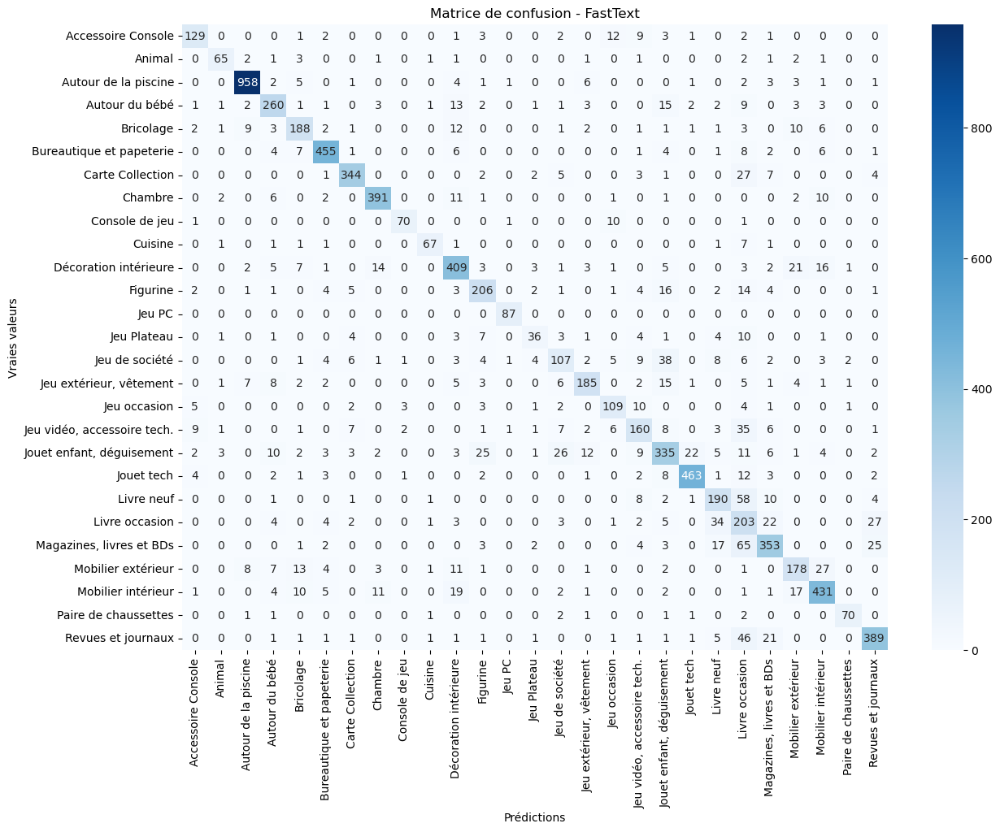


 F1 Score (weighted) sur validation : 0.8142


In [91]:
# Fonction pour formater les données au format FastText supervisé
def save_fasttext_format(df, labels, filename):
    with open(filename, "w", encoding="utf-8") as f:
        for text, label in zip(df["txt_fr_tok_stp_lem"], labels):
            f.write(f"__label__{label} {text}\n")

# Sauvegarde des fichiers d'entraînement et de validation
save_fasttext_format(X_train, y_train, train_file)
save_fasttext_format(X_val, y_val, val_file)

# Entraînement du modèle FastText supervisé
model = fasttext.train_supervised(
    input=train_file,
    lr=0.5,
    epoch=50,
    wordNgrams=2,
    dim=300,
    loss="softmax"
)

# Sauvegarde du modèle entraîné
model.save_model("fasttext_supervised.bin")

# Fonction d’évaluation du modèle FastText avec labels textuels
def evaluate_fasttext(model, val_file, y_true):
    preds = []
    with open(val_file, "r", encoding="utf-8") as f:
        for line in f:
            text = line.split(" ", 1)[1].strip()
            pred = model.predict(text)[0][0]
            preds.append(int(pred.replace("__label__", "")))

    y_true_labels = [labelcat.get(code) for code in y_true]
    y_pred_labels = [labelcat.get(code) for code in preds]

    weighted_f1 = f1_score(y_true_labels, y_pred_labels, average="weighted")

    print("\nRapport de classification :")
    print(classification_report(y_true_labels, y_pred_labels))

    sorted_labels = sorted(labelcat.values())
    cm = confusion_matrix(y_true_labels, y_pred_labels, labels=sorted_labels)

    plt.figure(figsize=(14, 10))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=sorted_labels, yticklabels=sorted_labels)
    plt.xlabel("Prédictions")
    plt.ylabel("Vraies valeurs")
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.title("Matrice de confusion - FastText")
    plt.show()

    return weighted_f1

# Évaluation sur le jeu de validation
f1 = evaluate_fasttext(model, val_file, y_val)
print(f"\nF1 Score (weighted) sur validation : {f1:.4f}")


## EPOCH

### epoch=100


 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.85      0.80      0.83       166
                     Animal       0.86      0.80      0.83        82
       Autour de la piscine       0.96      0.97      0.97       989
             Autour du bébé       0.79      0.80      0.80       324
                  Bricolage       0.79      0.78      0.78       244
   Bureautique et papeterie       0.92      0.92      0.92       496
           Carte Collection       0.90      0.88      0.89       396
                    Chambre       0.91      0.91      0.91       427
             Console de jeu       0.92      0.86      0.89        83
                    Cuisine       0.89      0.84      0.87        81
      Décoration intérieure       0.78      0.83      0.80       497
                   Figurine       0.75      0.81      0.77       267
                     Jeu PC       0.97      1.00      0.98        87
   

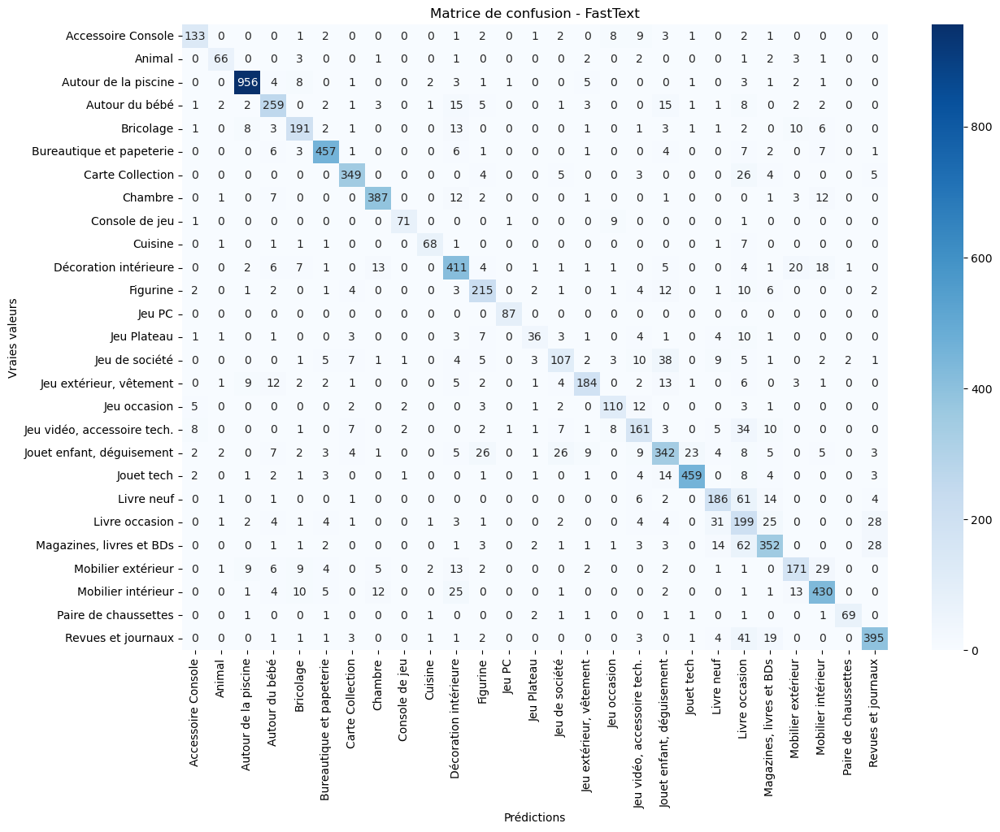


 F1 Score (weighted) sur validation : 0.8151


In [93]:
# Fonction pour formater les données au format FastText supervisé
def save_fasttext_format(df, labels, filename):
    with open(filename, "w", encoding="utf-8") as f:
        for text, label in zip(df["txt_fr_tok_stp_lem"], labels):
            f.write(f"__label__{label} {text}\n")

# Sauvegarde des fichiers d'entraînement et de validation
save_fasttext_format(X_train, y_train, train_file)
save_fasttext_format(X_val, y_val, val_file)

# Entraînement du modèle FastText supervisé
model = fasttext.train_supervised(
    input=train_file,
    lr=0.5,
    epoch=100,
    wordNgrams=2,
    dim=100,
    loss="softmax"
)

# Sauvegarde du modèle entraîné
model.save_model("fasttext_supervised.bin")

# Fonction d’évaluation du modèle FastText avec labels textuels
def evaluate_fasttext(model, val_file, y_true):
    preds = []
    with open(val_file, "r", encoding="utf-8") as f:
        for line in f:
            text = line.split(" ", 1)[1].strip()
            pred = model.predict(text)[0][0]
            preds.append(int(pred.replace("__label__", "")))

    y_true_labels = [labelcat.get(code) for code in y_true]
    y_pred_labels = [labelcat.get(code) for code in preds]

    weighted_f1 = f1_score(y_true_labels, y_pred_labels, average="weighted")

    print("\nRapport de classification :")
    print(classification_report(y_true_labels, y_pred_labels))

    sorted_labels = sorted(labelcat.values())
    cm = confusion_matrix(y_true_labels, y_pred_labels, labels=sorted_labels)

    plt.figure(figsize=(14, 10))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=sorted_labels, yticklabels=sorted_labels)
    plt.xlabel("Prédictions")
    plt.ylabel("Vraies valeurs")
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.title("Matrice de confusion - FastText")
    plt.show()

    return weighted_f1

# Évaluation sur le jeu de validation
f1 = evaluate_fasttext(model, val_file, y_val)
print(f"\nF1 Score (weighted) sur validation : {f1:.4f}")


### epoch=200


 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.86      0.77      0.82       166
                     Animal       0.89      0.80      0.85        82
       Autour de la piscine       0.97      0.96      0.97       989
             Autour du bébé       0.81      0.79      0.80       324
                  Bricolage       0.76      0.78      0.77       244
   Bureautique et papeterie       0.92      0.92      0.92       496
           Carte Collection       0.91      0.88      0.90       396
                    Chambre       0.91      0.91      0.91       427
             Console de jeu       0.91      0.86      0.88        83
                    Cuisine       0.91      0.84      0.87        81
      Décoration intérieure       0.79      0.83      0.81       497
                   Figurine       0.79      0.80      0.79       267
                     Jeu PC       0.97      1.00      0.98        87
   

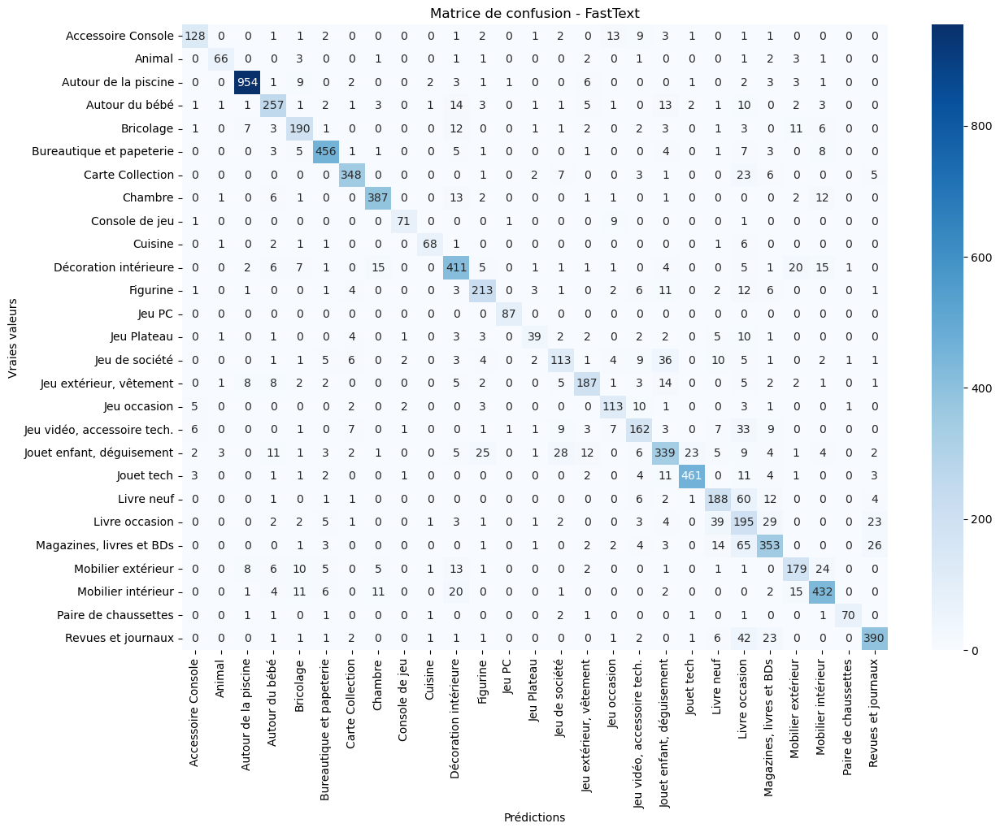


 F1 Score (weighted) sur validation : 0.8164


In [94]:
# Fonction pour formater les données au format FastText supervisé
def save_fasttext_format(df, labels, filename):
    with open(filename, "w", encoding="utf-8") as f:
        for text, label in zip(df["txt_fr_tok_stp_lem"], labels):
            f.write(f"__label__{label} {text}\n")

# Sauvegarde des fichiers d'entraînement et de validation
save_fasttext_format(X_train, y_train, train_file)
save_fasttext_format(X_val, y_val, val_file)

# Entraînement du modèle FastText supervisé
model = fasttext.train_supervised(
    input=train_file,
    lr=0.5,
    epoch=200,
    wordNgrams=2,
    dim=100,
    loss="softmax"
)

# Sauvegarde du modèle entraîné
model.save_model("fasttext_supervised.bin")

# Fonction d’évaluation du modèle FastText avec labels textuels
def evaluate_fasttext(model, val_file, y_true):
    preds = []
    with open(val_file, "r", encoding="utf-8") as f:
        for line in f:
            text = line.split(" ", 1)[1].strip()
            pred = model.predict(text)[0][0]
            preds.append(int(pred.replace("__label__", "")))

    y_true_labels = [labelcat.get(code) for code in y_true]
    y_pred_labels = [labelcat.get(code) for code in preds]

    weighted_f1 = f1_score(y_true_labels, y_pred_labels, average="weighted")

    print("\nRapport de classification :")
    print(classification_report(y_true_labels, y_pred_labels))

    sorted_labels = sorted(labelcat.values())
    cm = confusion_matrix(y_true_labels, y_pred_labels, labels=sorted_labels)

    plt.figure(figsize=(14, 10))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=sorted_labels, yticklabels=sorted_labels)
    plt.xlabel("Prédictions")
    plt.ylabel("Vraies valeurs")
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.title("Matrice de confusion - FastText")
    plt.show()

    return weighted_f1

# Évaluation sur le jeu de validation
f1 = evaluate_fasttext(model, val_file, y_val)
print(f"\nF1 Score (weighted) sur validation : {f1:.4f}")


## Boucle sur une combinaison de parametres
Recapitulatif des scores en en fin d'output


 Test avec lr=0.01, dim=100, epoch=50

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.74      0.67      0.70       166
                     Animal       0.00      0.00      0.00        82
       Autour de la piscine       0.92      0.96      0.94       989
             Autour du bébé       0.67      0.70      0.68       324
                  Bricolage       0.57      0.52      0.54       244
   Bureautique et papeterie       0.88      0.91      0.89       496
           Carte Collection       0.91      0.86      0.88       396
                    Chambre       0.86      0.85      0.85       427
             Console de jeu       0.59      0.78      0.67        83
                    Cuisine       0.82      0.22      0.35        81
      Décoration intérieure       0.63      0.79      0.70       497
                   Figurine       0.71      0.73      0.72       267
                     Jeu PC      

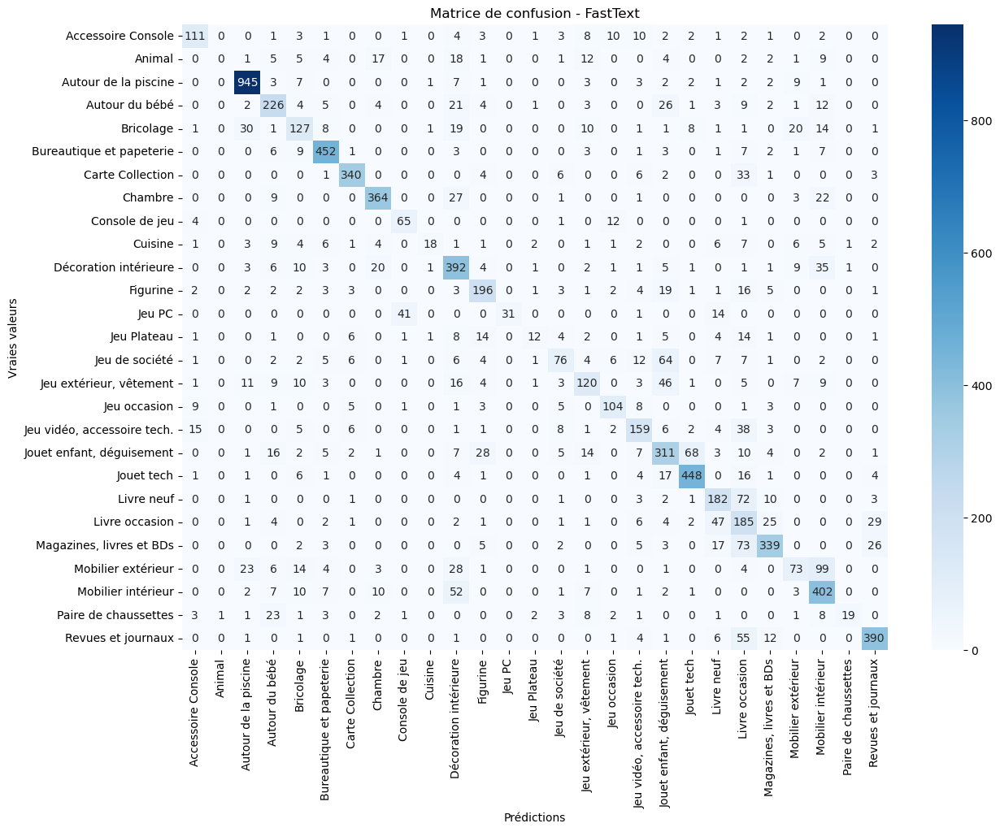


 Test avec lr=0.01, dim=100, epoch=100

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.82      0.78      0.80       166
                     Animal       0.65      0.51      0.57        82
       Autour de la piscine       0.96      0.96      0.96       989
             Autour du bébé       0.82      0.76      0.79       324
                  Bricolage       0.66      0.75      0.70       244
   Bureautique et papeterie       0.91      0.91      0.91       496
           Carte Collection       0.91      0.87      0.89       396
                    Chambre       0.91      0.87      0.89       427
             Console de jeu       0.91      0.82      0.86        83
                    Cuisine       0.77      0.74      0.75        81
      Décoration intérieure       0.76      0.79      0.78       497
                   Figurine       0.75      0.77      0.76       267
                     Jeu PC     

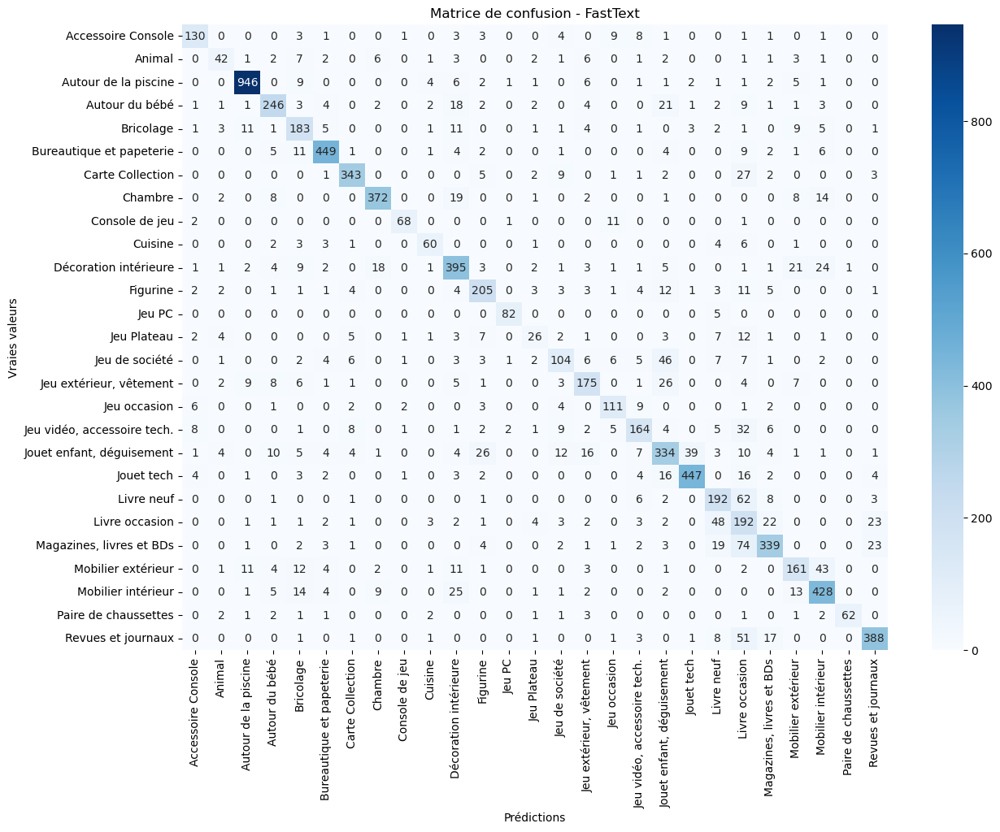


 Test avec lr=0.01, dim=100, epoch=200

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.82      0.82      0.82       166
                     Animal       0.82      0.72      0.77        82
       Autour de la piscine       0.96      0.96      0.96       989
             Autour du bébé       0.82      0.79      0.81       324
                  Bricolage       0.72      0.80      0.76       244
   Bureautique et papeterie       0.92      0.91      0.91       496
           Carte Collection       0.90      0.87      0.89       396
                    Chambre       0.93      0.90      0.91       427
             Console de jeu       0.92      0.84      0.88        83
                    Cuisine       0.88      0.83      0.85        81
      Décoration intérieure       0.79      0.81      0.80       497
                   Figurine       0.75      0.78      0.76       267
                     Jeu PC     

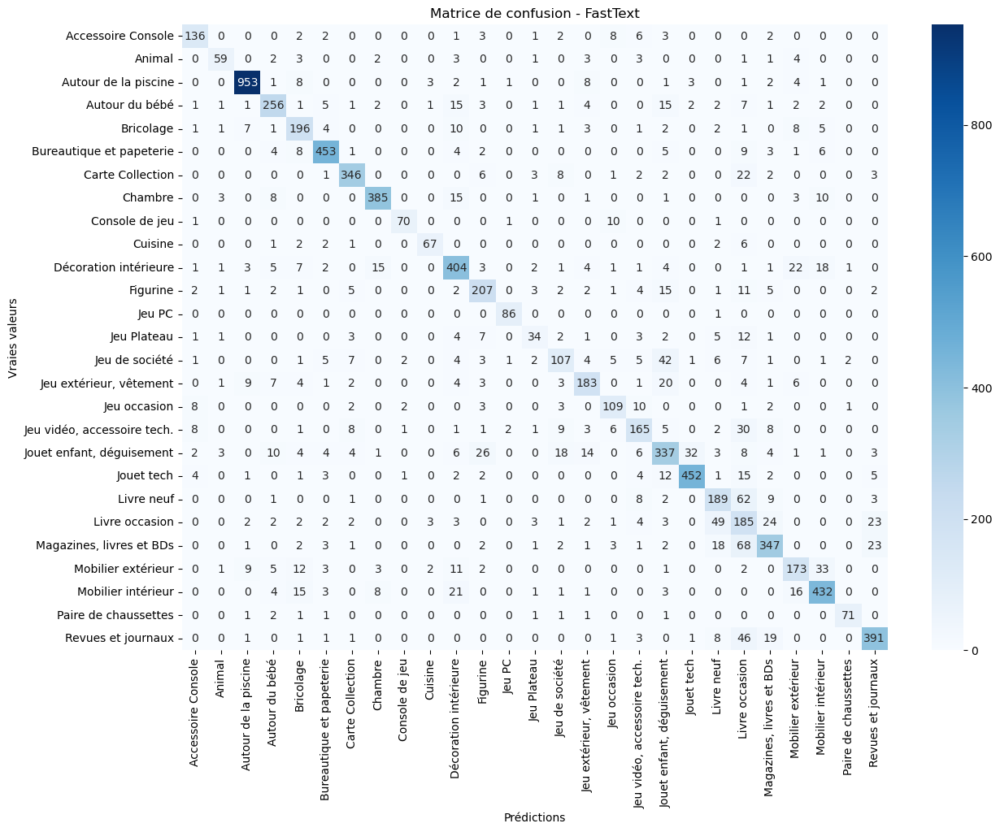


 Test avec lr=0.01, dim=150, epoch=50

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.71      0.67      0.69       166
                     Animal       0.00      0.00      0.00        82
       Autour de la piscine       0.92      0.96      0.94       989
             Autour du bébé       0.67      0.70      0.69       324
                  Bricolage       0.56      0.51      0.53       244
   Bureautique et papeterie       0.88      0.91      0.89       496
           Carte Collection       0.91      0.85      0.88       396
                    Chambre       0.87      0.85      0.86       427
             Console de jeu       0.54      0.78      0.64        83
                    Cuisine       0.80      0.25      0.38        81
      Décoration intérieure       0.63      0.79      0.70       497
                   Figurine       0.71      0.73      0.72       267
                     Jeu PC      

C:\Users\rudy_\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\rudy_\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\rudy_\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


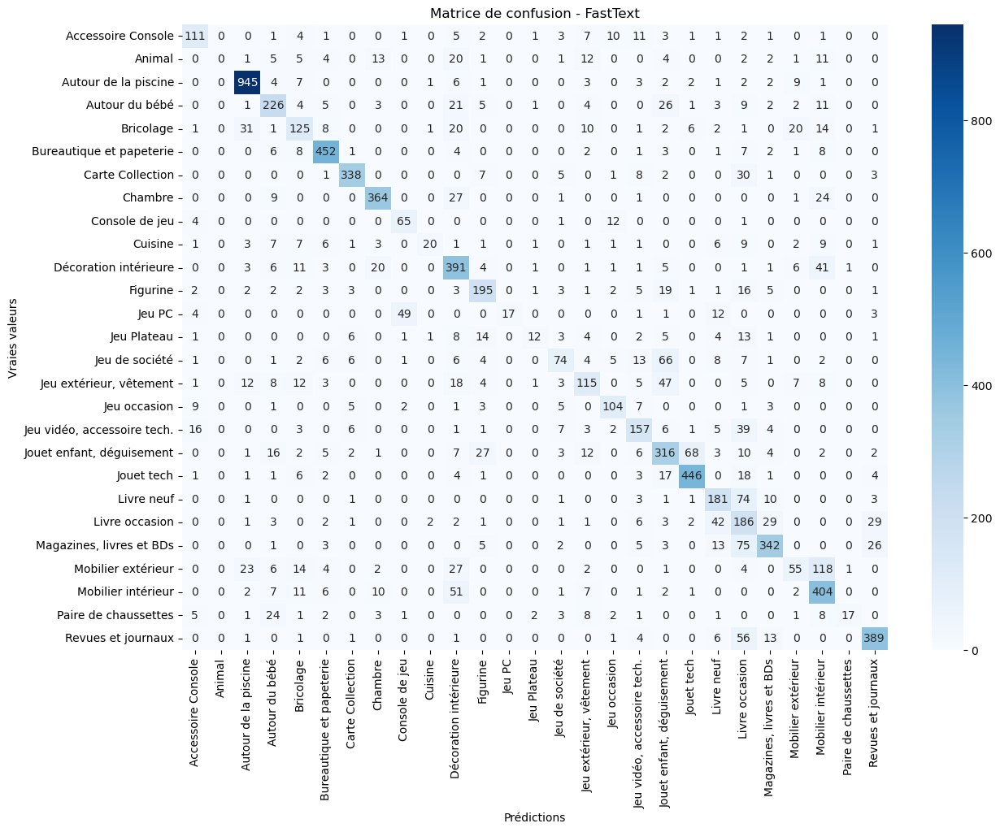


 Test avec lr=0.01, dim=150, epoch=100

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.82      0.77      0.80       166
                     Animal       0.67      0.49      0.56        82
       Autour de la piscine       0.96      0.95      0.96       989
             Autour du bébé       0.80      0.76      0.78       324
                  Bricolage       0.66      0.75      0.70       244
   Bureautique et papeterie       0.91      0.90      0.91       496
           Carte Collection       0.90      0.86      0.88       396
                    Chambre       0.90      0.87      0.89       427
             Console de jeu       0.91      0.81      0.85        83
                    Cuisine       0.78      0.74      0.76        81
      Décoration intérieure       0.75      0.80      0.78       497
                   Figurine       0.74      0.76      0.75       267
                     Jeu PC     

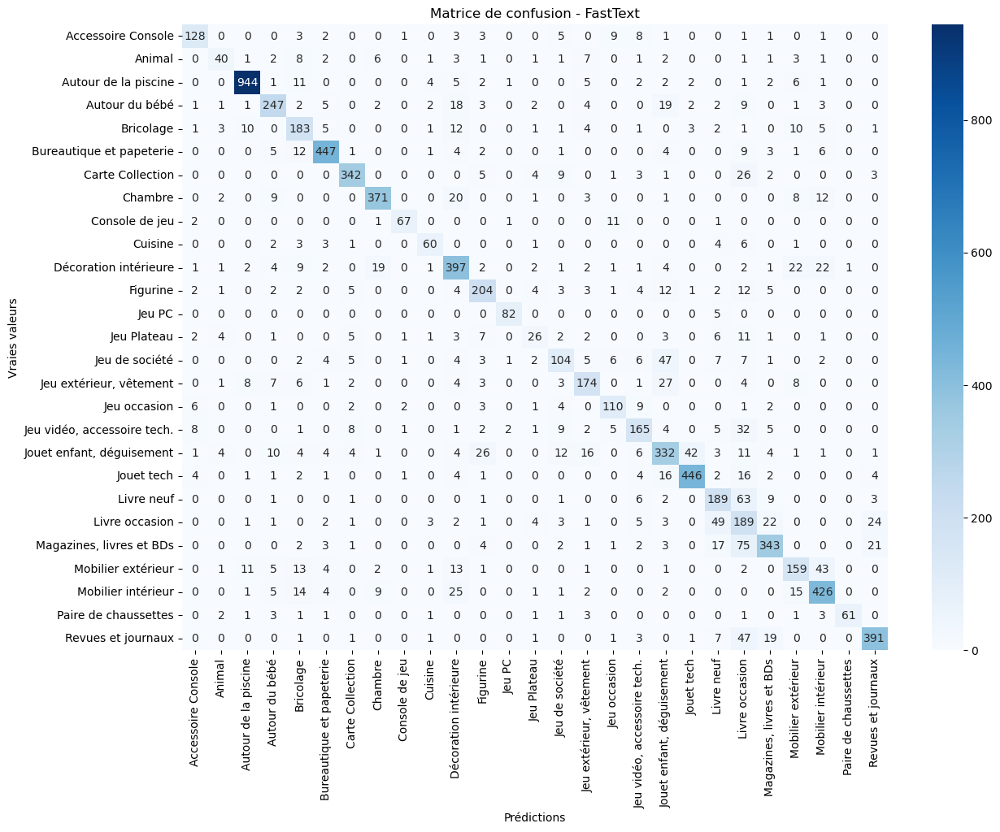


 Test avec lr=0.01, dim=150, epoch=200

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.83      0.80      0.81       166
                     Animal       0.83      0.72      0.77        82
       Autour de la piscine       0.96      0.96      0.96       989
             Autour du bébé       0.82      0.79      0.80       324
                  Bricolage       0.72      0.79      0.75       244
   Bureautique et papeterie       0.92      0.91      0.91       496
           Carte Collection       0.90      0.87      0.88       396
                    Chambre       0.93      0.90      0.91       427
             Console de jeu       0.91      0.83      0.87        83
                    Cuisine       0.87      0.81      0.84        81
      Décoration intérieure       0.79      0.81      0.80       497
                   Figurine       0.74      0.78      0.76       267
                     Jeu PC     

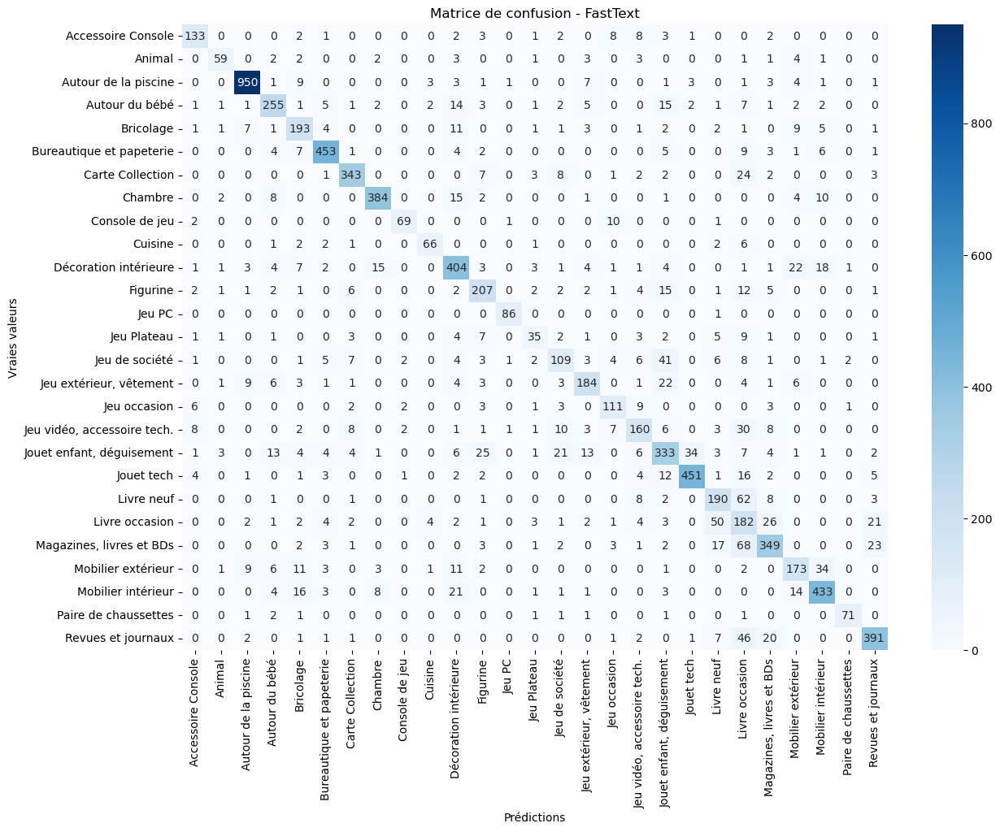


 Test avec lr=0.01, dim=200, epoch=50

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.70      0.66      0.68       166
                     Animal       0.00      0.00      0.00        82
       Autour de la piscine       0.92      0.96      0.94       989
             Autour du bébé       0.66      0.68      0.67       324
                  Bricolage       0.55      0.51      0.53       244
   Bureautique et papeterie       0.88      0.91      0.89       496
           Carte Collection       0.91      0.85      0.88       396
                    Chambre       0.87      0.85      0.86       427
             Console de jeu       0.54      0.78      0.64        83
                    Cuisine       0.89      0.21      0.34        81
      Décoration intérieure       0.62      0.79      0.69       497
                   Figurine       0.71      0.73      0.72       267
                     Jeu PC      

C:\Users\rudy_\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\rudy_\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\rudy_\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


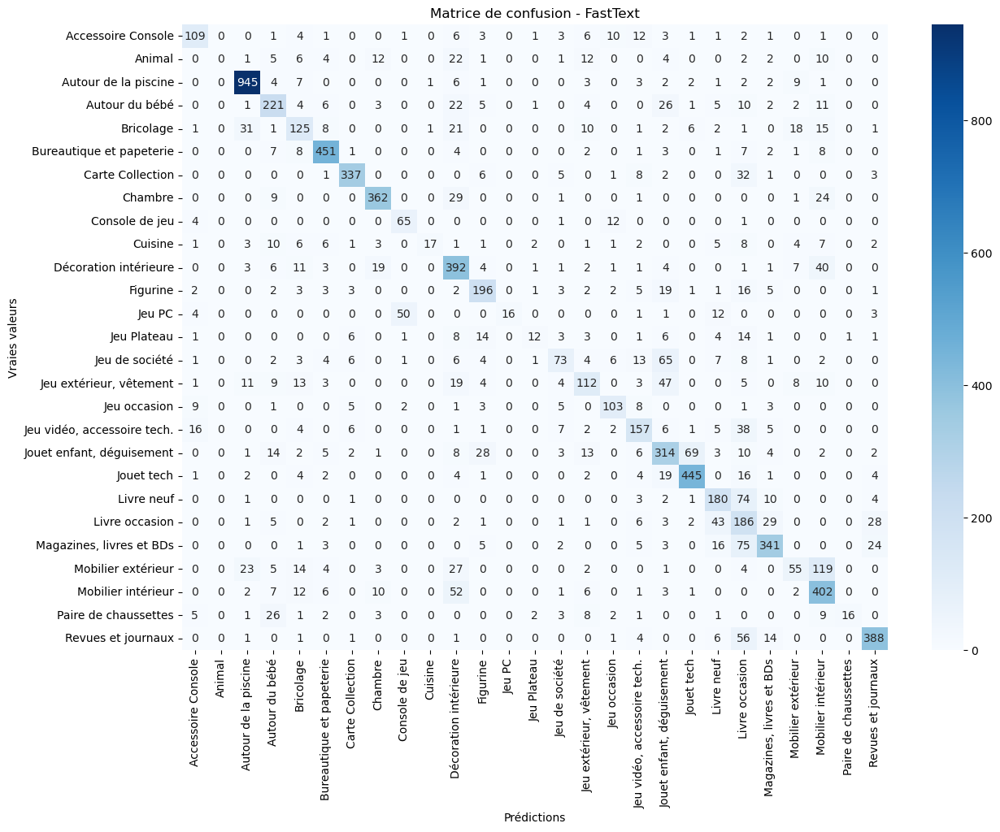


 Test avec lr=0.01, dim=200, epoch=100

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.83      0.77      0.80       166
                     Animal       0.64      0.48      0.55        82
       Autour de la piscine       0.96      0.96      0.96       989
             Autour du bébé       0.82      0.76      0.79       324
                  Bricolage       0.66      0.76      0.71       244
   Bureautique et papeterie       0.91      0.91      0.91       496
           Carte Collection       0.90      0.86      0.88       396
                    Chambre       0.91      0.87      0.89       427
             Console de jeu       0.91      0.82      0.86        83
                    Cuisine       0.79      0.74      0.76        81
      Décoration intérieure       0.75      0.79      0.77       497
                   Figurine       0.75      0.76      0.75       267
                     Jeu PC     

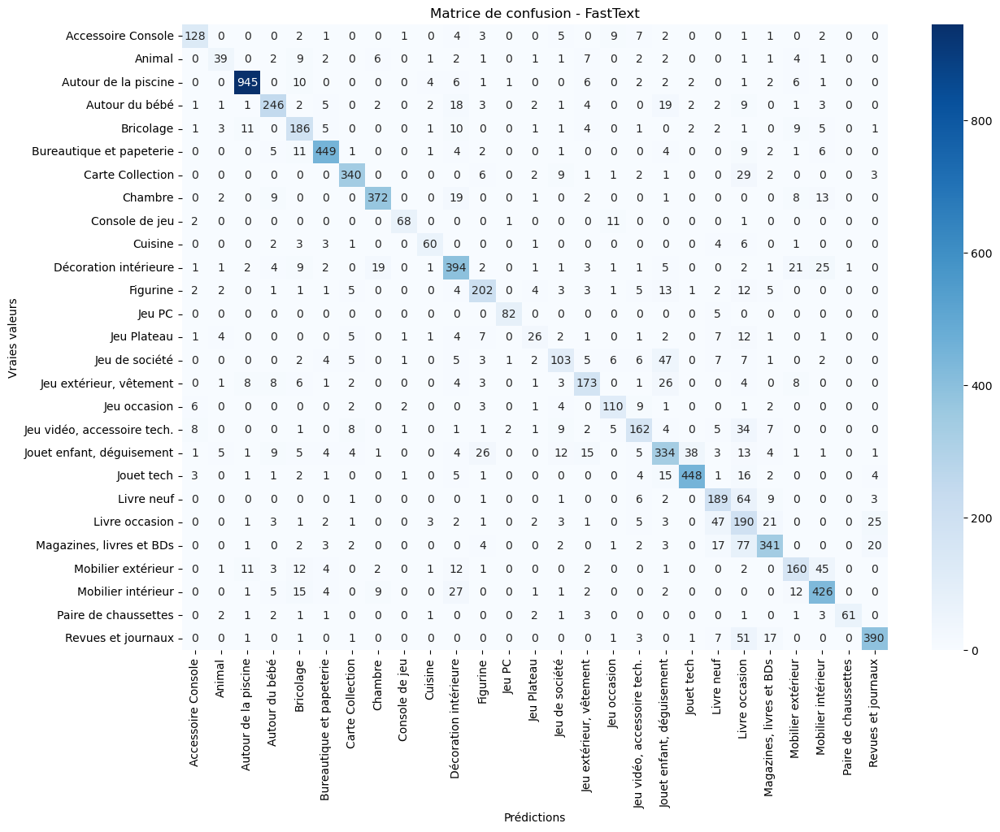


 Test avec lr=0.01, dim=200, epoch=200

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.83      0.80      0.81       166
                     Animal       0.82      0.72      0.77        82
       Autour de la piscine       0.97      0.96      0.96       989
             Autour du bébé       0.83      0.79      0.81       324
                  Bricolage       0.73      0.80      0.76       244
   Bureautique et papeterie       0.92      0.92      0.92       496
           Carte Collection       0.89      0.87      0.88       396
                    Chambre       0.93      0.90      0.91       427
             Console de jeu       0.92      0.83      0.87        83
                    Cuisine       0.85      0.83      0.84        81
      Décoration intérieure       0.79      0.81      0.80       497
                   Figurine       0.75      0.78      0.76       267
                     Jeu PC     

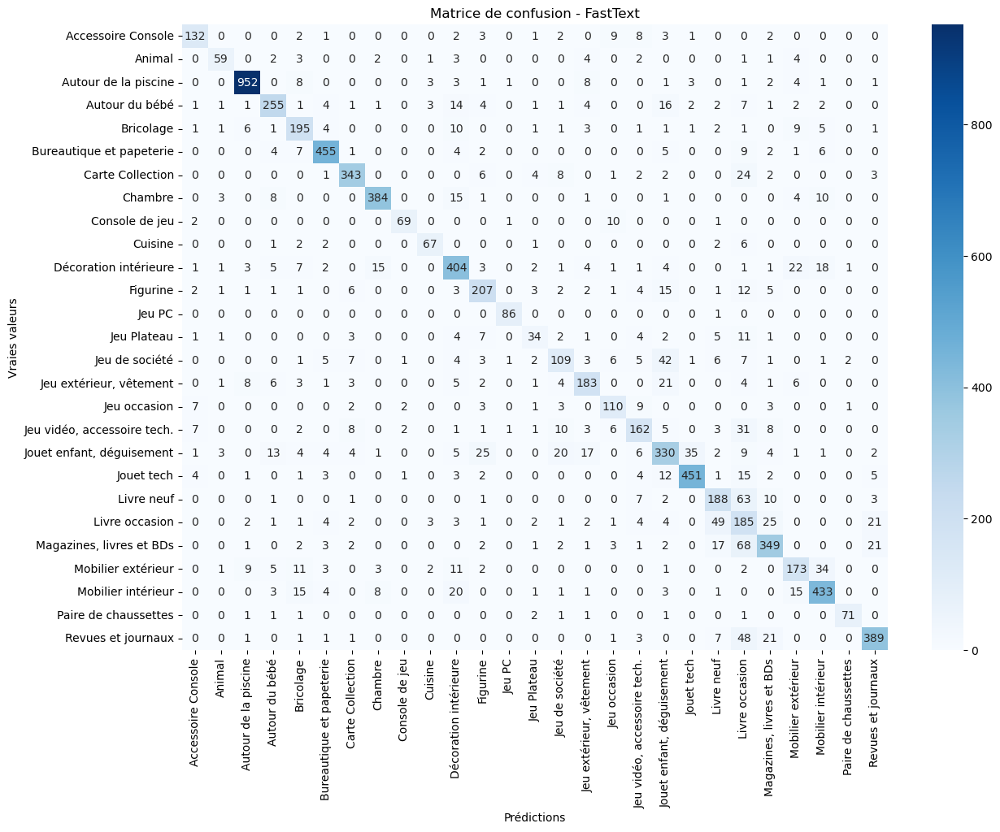


 Test avec lr=0.01, dim=300, epoch=50

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.71      0.66      0.68       166
                     Animal       0.00      0.00      0.00        82
       Autour de la piscine       0.92      0.96      0.94       989
             Autour du bébé       0.64      0.68      0.66       324
                  Bricolage       0.56      0.51      0.53       244
   Bureautique et papeterie       0.87      0.91      0.89       496
           Carte Collection       0.91      0.85      0.88       396
                    Chambre       0.87      0.85      0.86       427
             Console de jeu       0.54      0.78      0.64        83
                    Cuisine       0.89      0.21      0.34        81
      Décoration intérieure       0.61      0.79      0.69       497
                   Figurine       0.70      0.73      0.72       267
                     Jeu PC      

C:\Users\rudy_\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\rudy_\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\rudy_\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


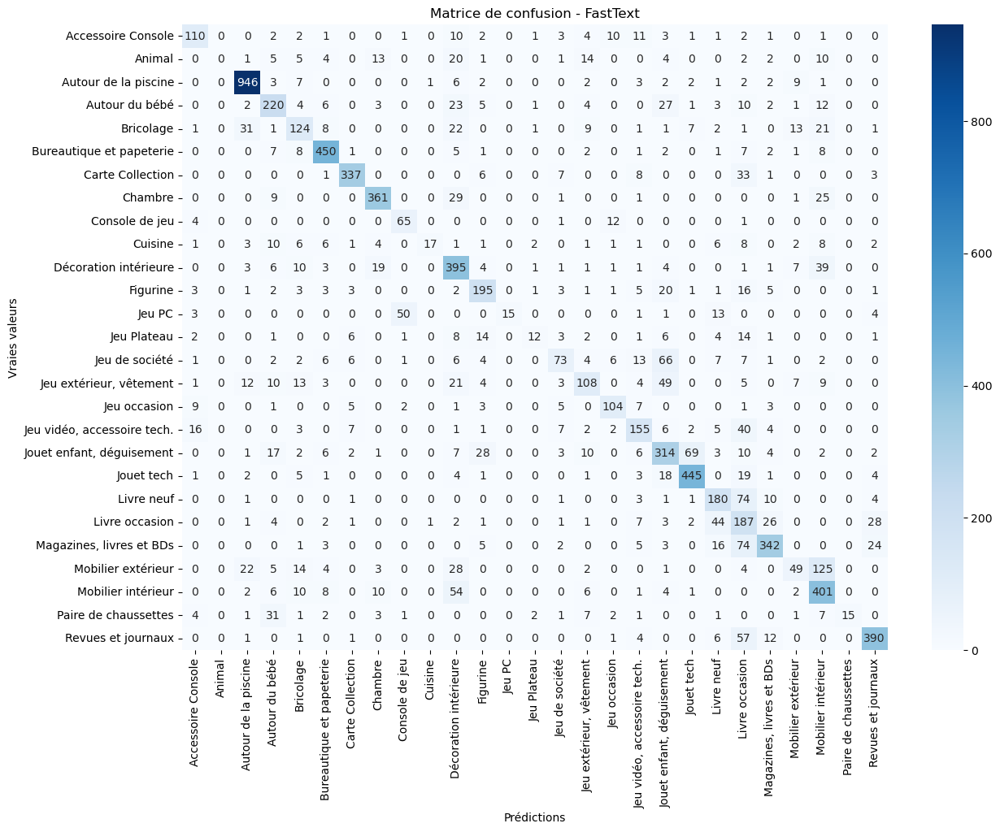


 Test avec lr=0.01, dim=300, epoch=100

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.82      0.77      0.80       166
                     Animal       0.64      0.48      0.55        82
       Autour de la piscine       0.96      0.95      0.96       989
             Autour du bébé       0.81      0.76      0.79       324
                  Bricolage       0.66      0.75      0.70       244
   Bureautique et papeterie       0.91      0.90      0.91       496
           Carte Collection       0.90      0.86      0.88       396
                    Chambre       0.91      0.87      0.89       427
             Console de jeu       0.91      0.82      0.86        83
                    Cuisine       0.78      0.74      0.76        81
      Décoration intérieure       0.75      0.79      0.77       497
                   Figurine       0.75      0.76      0.76       267
                     Jeu PC     

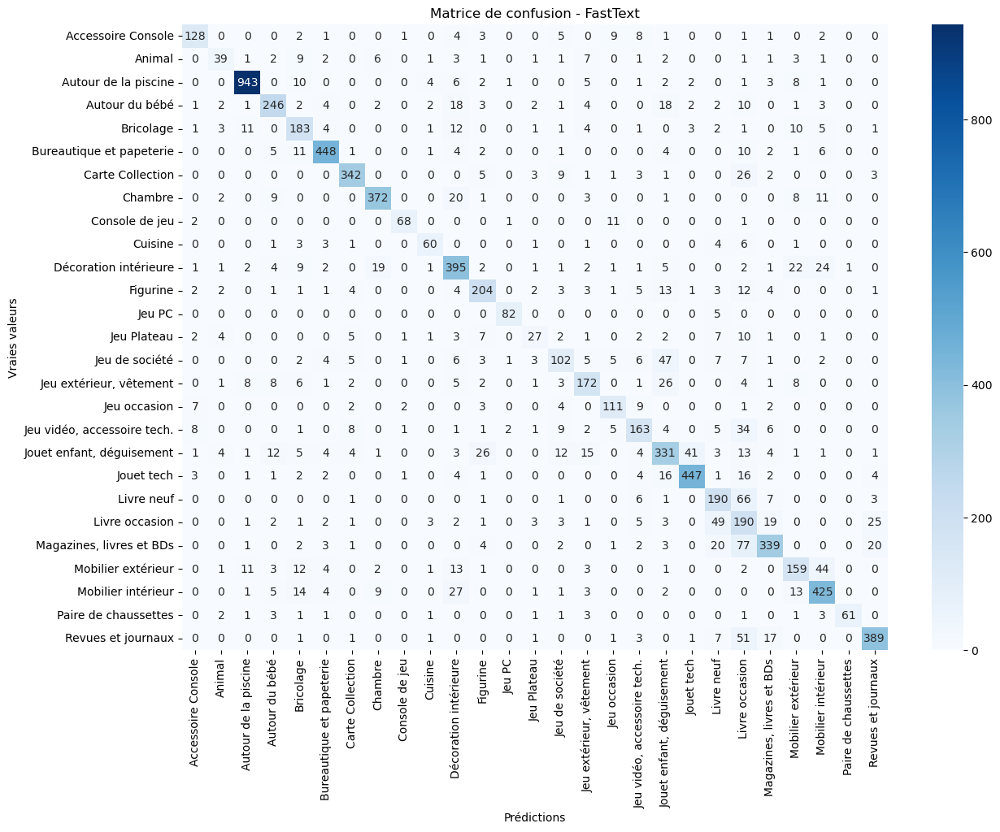


 Test avec lr=0.01, dim=300, epoch=200

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.82      0.78      0.80       166
                     Animal       0.82      0.71      0.76        82
       Autour de la piscine       0.96      0.96      0.96       989
             Autour du bébé       0.82      0.78      0.80       324
                  Bricolage       0.73      0.79      0.76       244
   Bureautique et papeterie       0.91      0.91      0.91       496
           Carte Collection       0.90      0.87      0.88       396
                    Chambre       0.93      0.90      0.91       427
             Console de jeu       0.91      0.83      0.87        83
                    Cuisine       0.81      0.81      0.81        81
      Décoration intérieure       0.78      0.81      0.80       497
                   Figurine       0.74      0.78      0.76       267
                     Jeu PC     

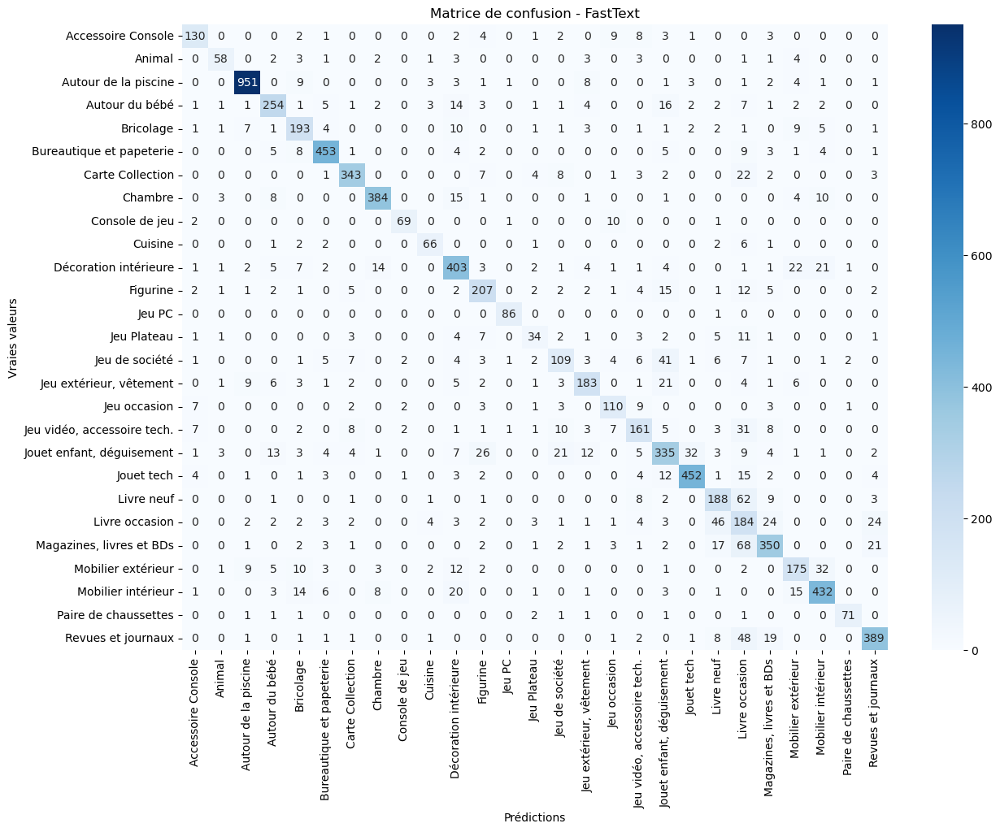


 Test avec lr=0.1, dim=100, epoch=50

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.82      0.80      0.81       166
                     Animal       0.83      0.77      0.80        82
       Autour de la piscine       0.97      0.97      0.97       989
             Autour du bébé       0.81      0.79      0.80       324
                  Bricolage       0.75      0.80      0.77       244
   Bureautique et papeterie       0.92      0.92      0.92       496
           Carte Collection       0.89      0.88      0.89       396
                    Chambre       0.93      0.91      0.92       427
             Console de jeu       0.91      0.84      0.88        83
                    Cuisine       0.88      0.84      0.86        81
      Décoration intérieure       0.80      0.82      0.81       497
                   Figurine       0.76      0.79      0.78       267
                     Jeu PC       

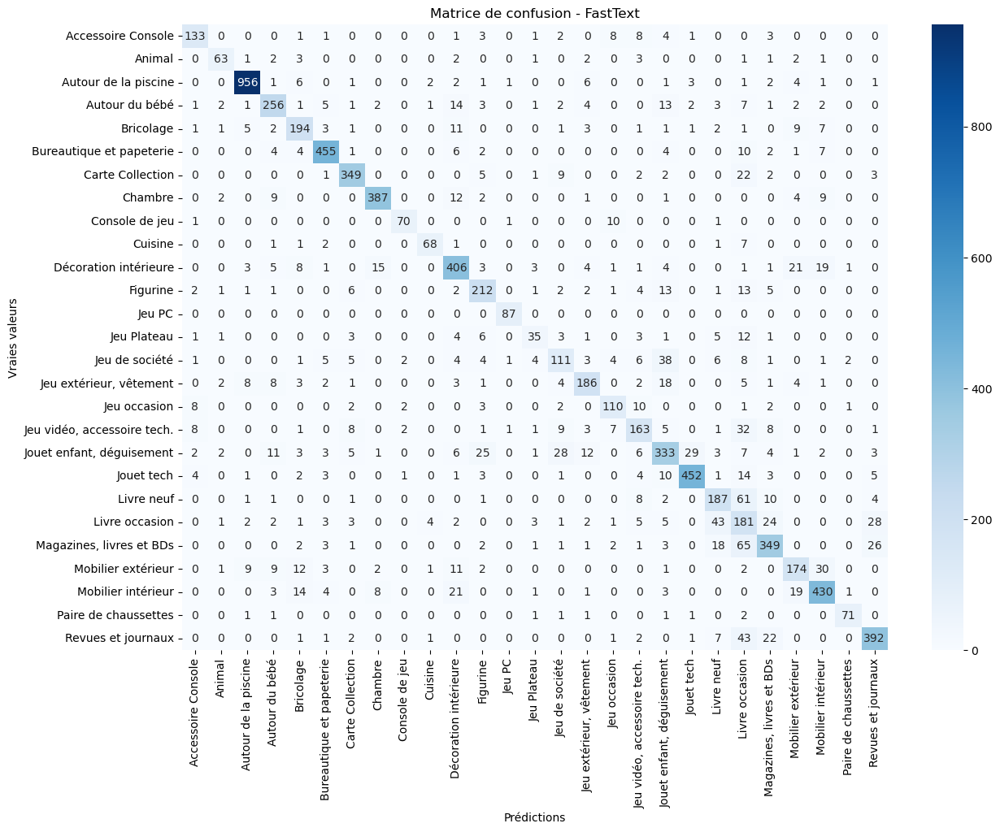


 Test avec lr=0.1, dim=100, epoch=100

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.84      0.80      0.82       166
                     Animal       0.85      0.78      0.82        82
       Autour de la piscine       0.96      0.97      0.96       989
             Autour du bébé       0.81      0.80      0.80       324
                  Bricolage       0.77      0.79      0.78       244
   Bureautique et papeterie       0.92      0.92      0.92       496
           Carte Collection       0.89      0.88      0.89       396
                    Chambre       0.93      0.90      0.91       427
             Console de jeu       0.91      0.84      0.88        83
                    Cuisine       0.87      0.85      0.86        81
      Décoration intérieure       0.79      0.81      0.80       497
                   Figurine       0.76      0.79      0.77       267
                     Jeu PC      

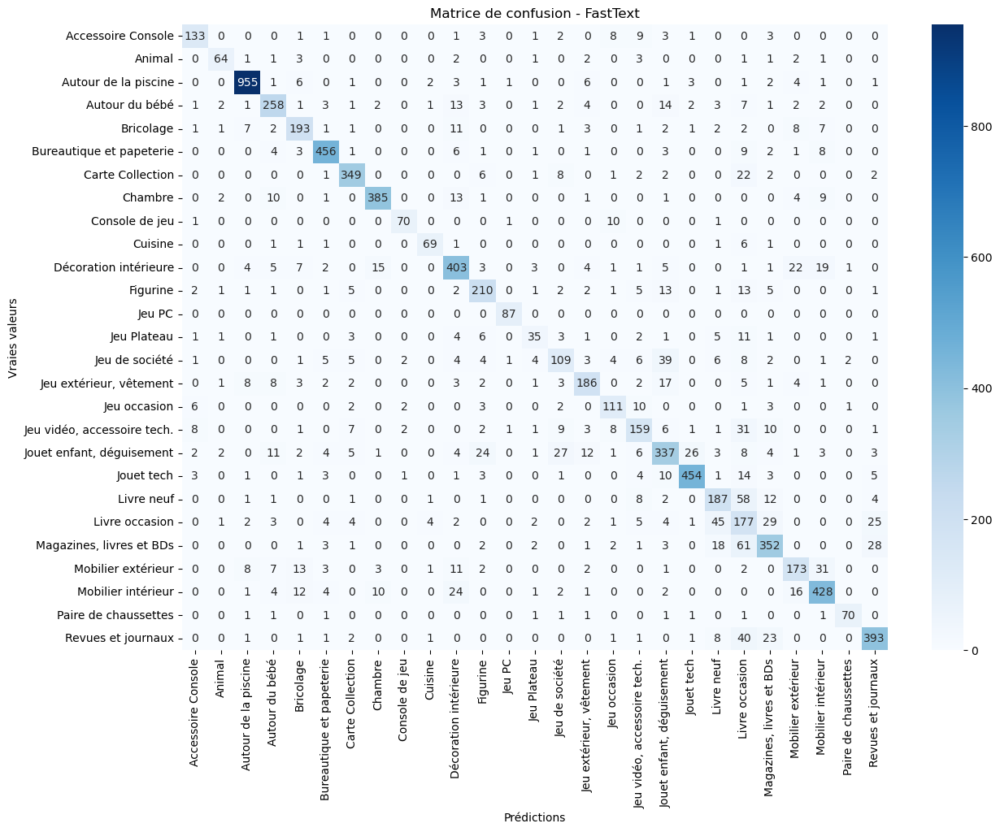


 Test avec lr=0.1, dim=100, epoch=200

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.84      0.80      0.82       166
                     Animal       0.86      0.78      0.82        82
       Autour de la piscine       0.96      0.97      0.96       989
             Autour du bébé       0.80      0.80      0.80       324
                  Bricolage       0.77      0.78      0.78       244
   Bureautique et papeterie       0.92      0.92      0.92       496
           Carte Collection       0.90      0.89      0.89       396
                    Chambre       0.93      0.90      0.92       427
             Console de jeu       0.91      0.86      0.88        83
                    Cuisine       0.88      0.85      0.87        81
      Décoration intérieure       0.79      0.82      0.81       497
                   Figurine       0.76      0.80      0.78       267
                     Jeu PC      

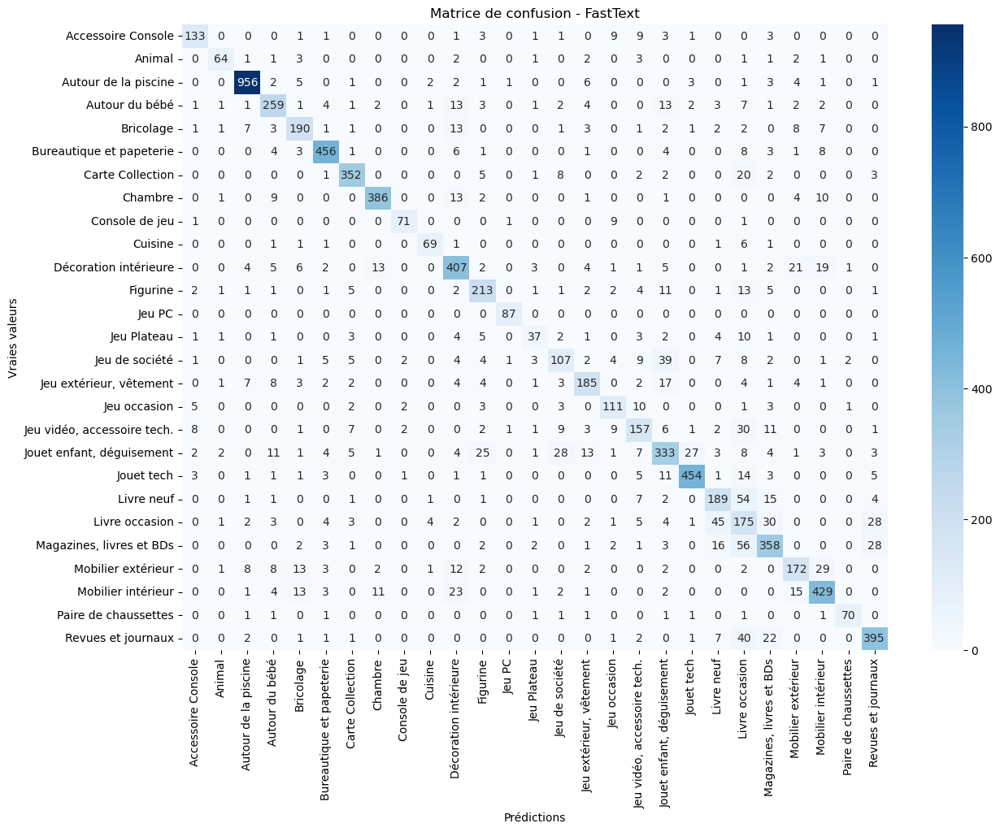


 Test avec lr=0.1, dim=150, epoch=50

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.82      0.80      0.81       166
                     Animal       0.83      0.77      0.80        82
       Autour de la piscine       0.97      0.96      0.96       989
             Autour du bébé       0.81      0.79      0.80       324
                  Bricolage       0.75      0.79      0.77       244
   Bureautique et papeterie       0.92      0.92      0.92       496
           Carte Collection       0.89      0.88      0.89       396
                    Chambre       0.93      0.91      0.92       427
             Console de jeu       0.91      0.84      0.88        83
                    Cuisine       0.84      0.84      0.84        81
      Décoration intérieure       0.80      0.81      0.81       497
                   Figurine       0.74      0.79      0.76       267
                     Jeu PC       

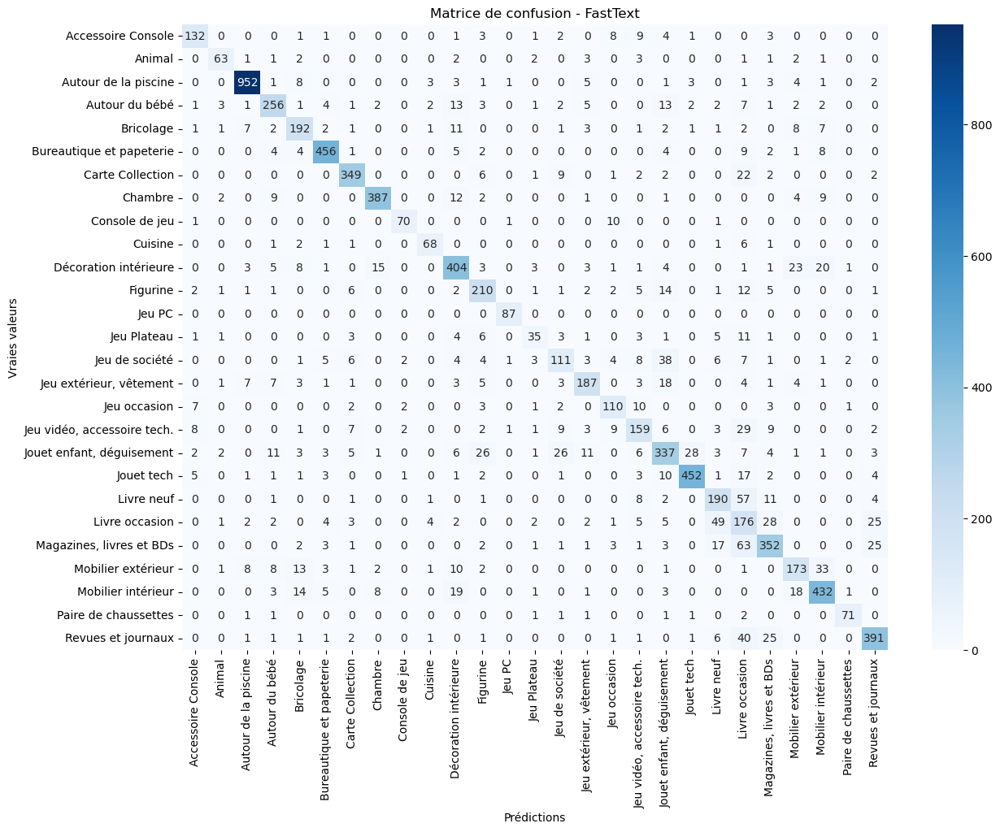


 Test avec lr=0.1, dim=150, epoch=100

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.83      0.80      0.81       166
                     Animal       0.84      0.78      0.81        82
       Autour de la piscine       0.96      0.96      0.96       989
             Autour du bébé       0.81      0.80      0.80       324
                  Bricolage       0.74      0.79      0.76       244
   Bureautique et papeterie       0.92      0.92      0.92       496
           Carte Collection       0.89      0.88      0.89       396
                    Chambre       0.93      0.91      0.92       427
             Console de jeu       0.91      0.84      0.88        83
                    Cuisine       0.86      0.84      0.85        81
      Décoration intérieure       0.80      0.81      0.81       497
                   Figurine       0.74      0.80      0.77       267
                     Jeu PC      

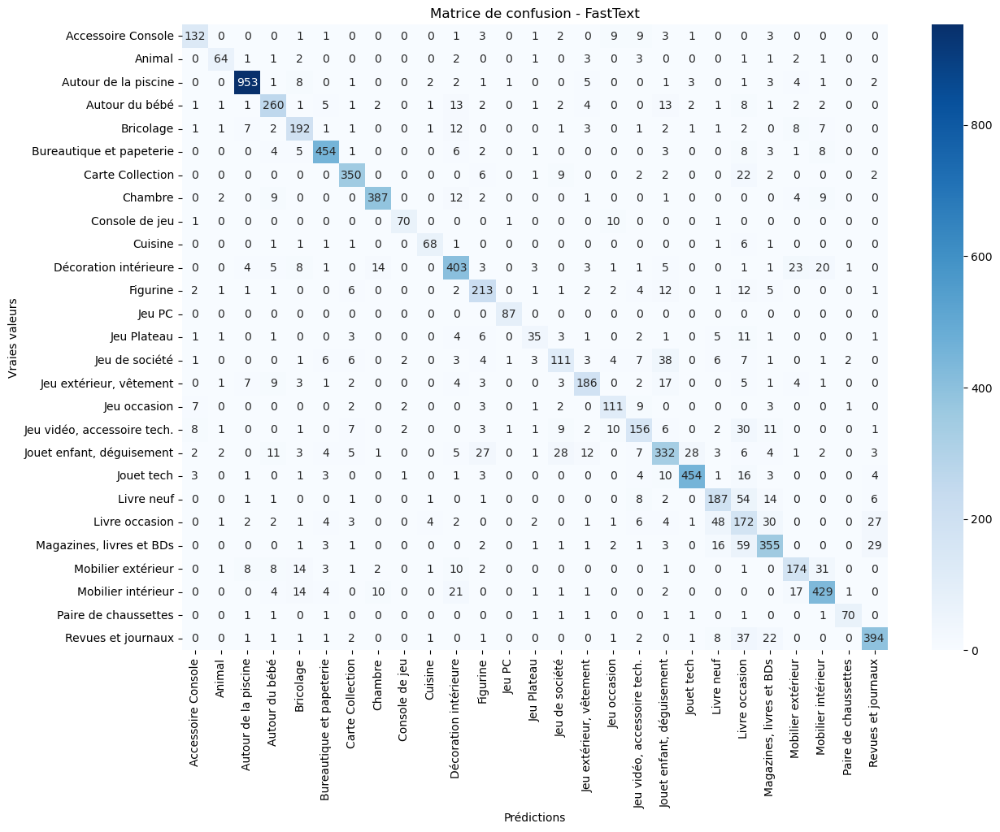


 Test avec lr=0.1, dim=150, epoch=200

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.85      0.79      0.82       166
                     Animal       0.86      0.77      0.81        82
       Autour de la piscine       0.97      0.97      0.97       989
             Autour du bébé       0.80      0.80      0.80       324
                  Bricolage       0.76      0.78      0.77       244
   Bureautique et papeterie       0.92      0.92      0.92       496
           Carte Collection       0.89      0.89      0.89       396
                    Chambre       0.93      0.90      0.92       427
             Console de jeu       0.91      0.86      0.88        83
                    Cuisine       0.86      0.85      0.86        81
      Décoration intérieure       0.79      0.82      0.81       497
                   Figurine       0.74      0.79      0.77       267
                     Jeu PC      

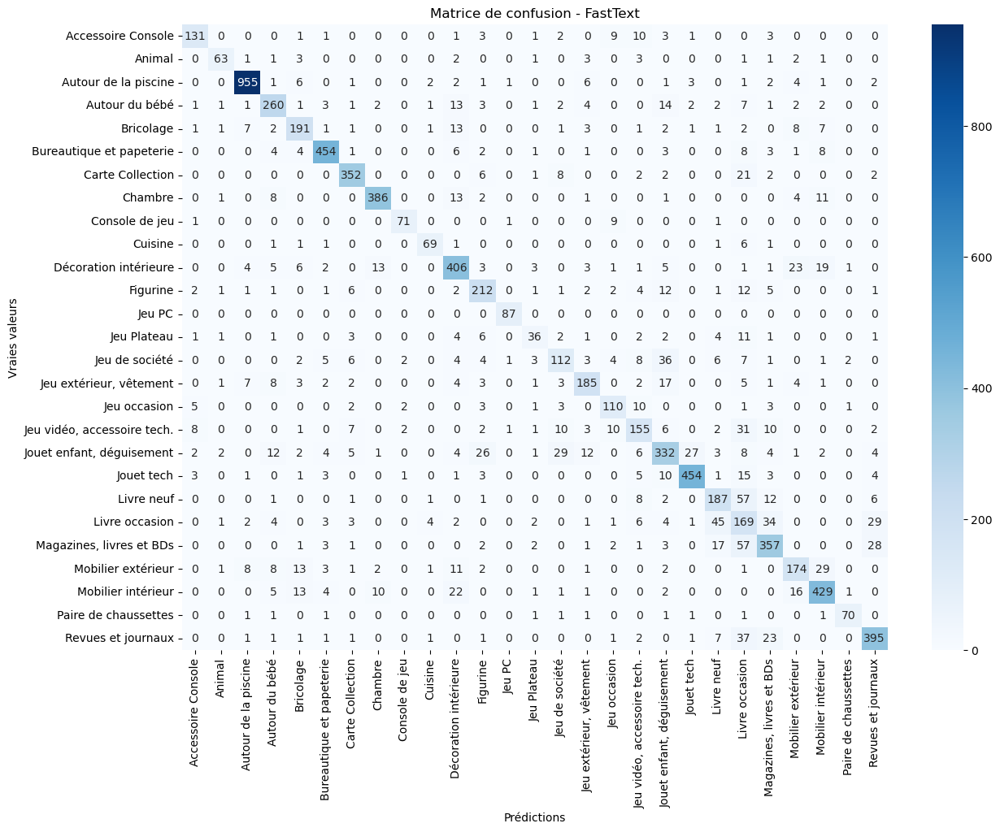


 Test avec lr=0.1, dim=200, epoch=50

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.81      0.80      0.80       166
                     Animal       0.86      0.77      0.81        82
       Autour de la piscine       0.97      0.96      0.96       989
             Autour du bébé       0.81      0.78      0.80       324
                  Bricolage       0.74      0.80      0.77       244
   Bureautique et papeterie       0.92      0.92      0.92       496
           Carte Collection       0.89      0.88      0.89       396
                    Chambre       0.93      0.91      0.92       427
             Console de jeu       0.91      0.84      0.88        83
                    Cuisine       0.84      0.84      0.84        81
      Décoration intérieure       0.80      0.81      0.81       497
                   Figurine       0.74      0.80      0.77       267
                     Jeu PC       

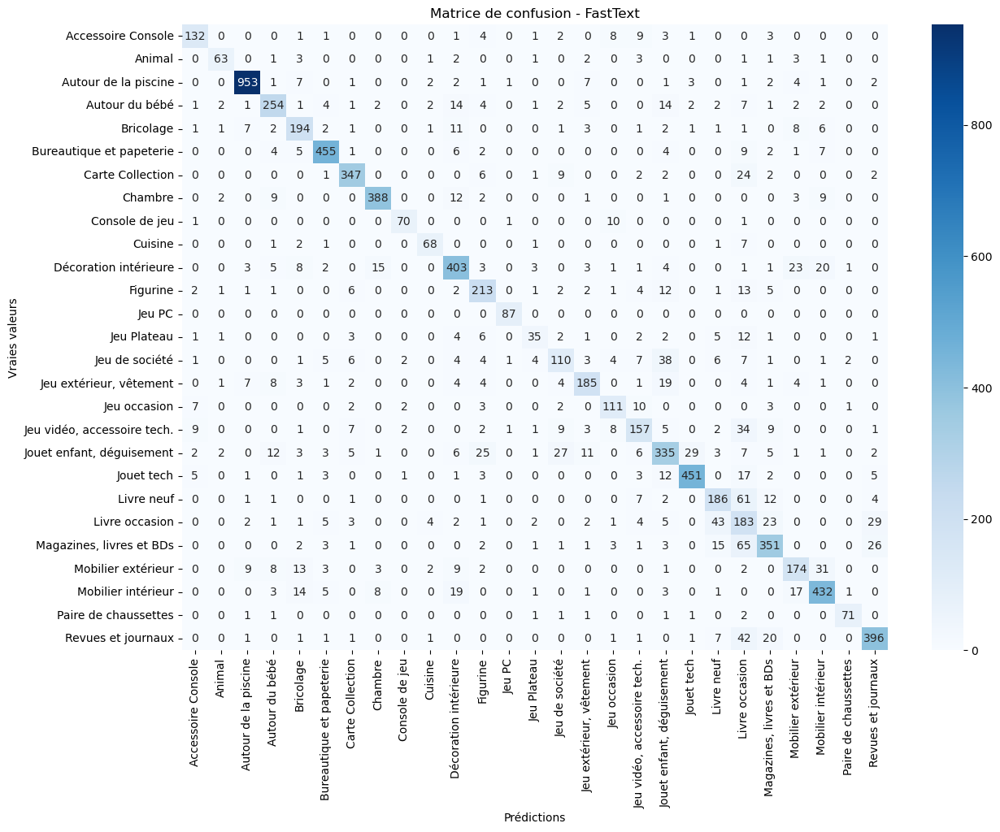


 Test avec lr=0.1, dim=200, epoch=100

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.83      0.80      0.82       166
                     Animal       0.86      0.77      0.81        82
       Autour de la piscine       0.96      0.96      0.96       989
             Autour du bébé       0.82      0.79      0.81       324
                  Bricolage       0.74      0.79      0.76       244
   Bureautique et papeterie       0.92      0.92      0.92       496
           Carte Collection       0.90      0.87      0.88       396
                    Chambre       0.93      0.91      0.92       427
             Console de jeu       0.91      0.86      0.88        83
                    Cuisine       0.84      0.85      0.85        81
      Décoration intérieure       0.80      0.81      0.81       497
                   Figurine       0.74      0.79      0.76       267
                     Jeu PC      

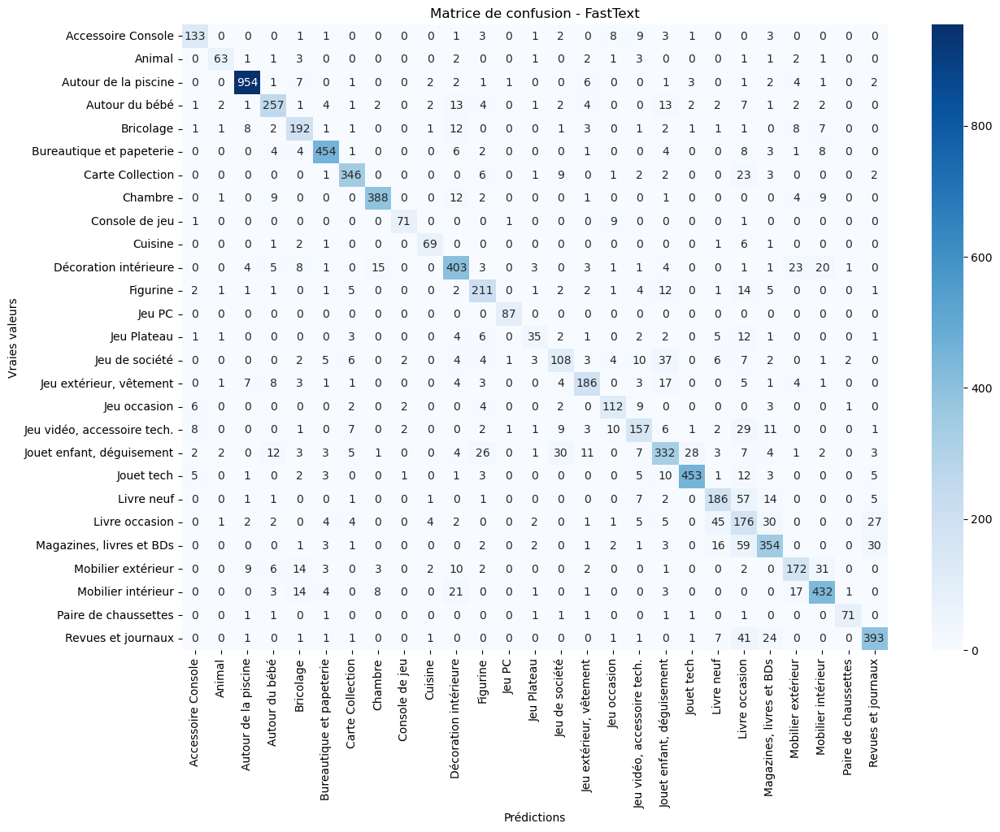


 Test avec lr=0.1, dim=200, epoch=200

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.84      0.78      0.81       166
                     Animal       0.86      0.77      0.81        82
       Autour de la piscine       0.96      0.97      0.97       989
             Autour du bébé       0.82      0.79      0.80       324
                  Bricolage       0.76      0.78      0.77       244
   Bureautique et papeterie       0.92      0.92      0.92       496
           Carte Collection       0.90      0.88      0.89       396
                    Chambre       0.93      0.90      0.92       427
             Console de jeu       0.91      0.86      0.88        83
                    Cuisine       0.87      0.85      0.86        81
      Décoration intérieure       0.80      0.82      0.81       497
                   Figurine       0.74      0.79      0.77       267
                     Jeu PC      

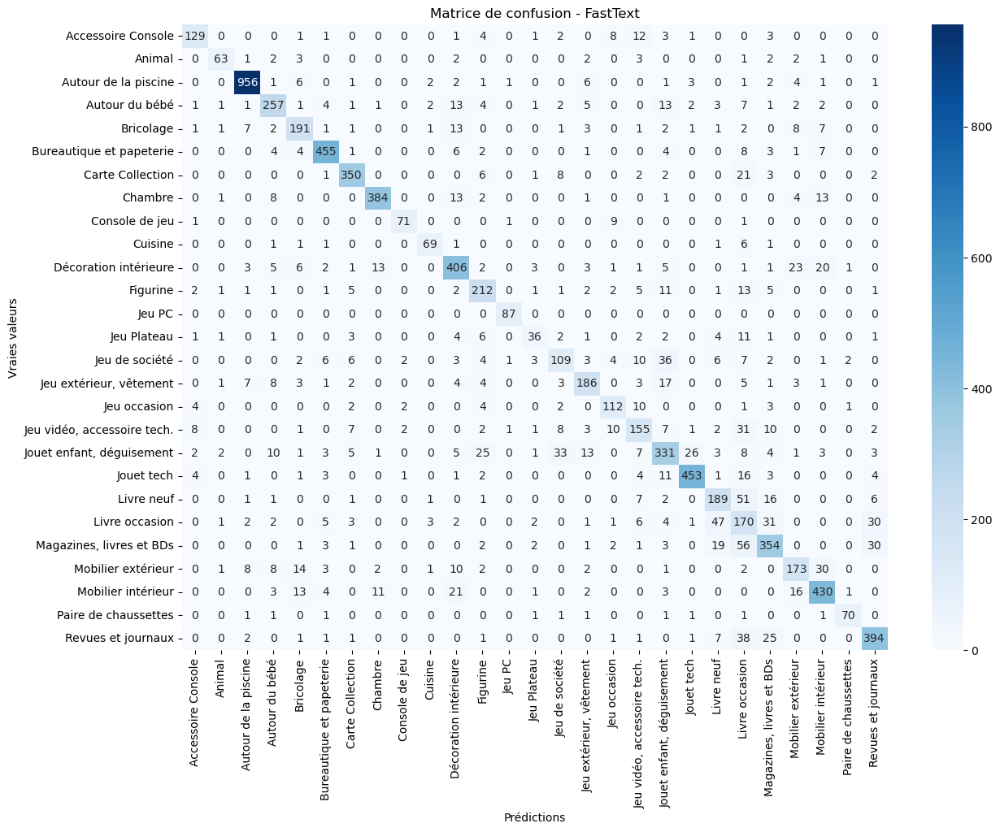


 Test avec lr=0.1, dim=300, epoch=50

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.80      0.78      0.79       166
                     Animal       0.84      0.77      0.80        82
       Autour de la piscine       0.96      0.96      0.96       989
             Autour du bébé       0.82      0.79      0.80       324
                  Bricolage       0.74      0.79      0.76       244
   Bureautique et papeterie       0.91      0.92      0.91       496
           Carte Collection       0.89      0.88      0.89       396
                    Chambre       0.93      0.91      0.92       427
             Console de jeu       0.91      0.84      0.88        83
                    Cuisine       0.85      0.81      0.83        81
      Décoration intérieure       0.80      0.81      0.80       497
                   Figurine       0.74      0.79      0.76       267
                     Jeu PC       

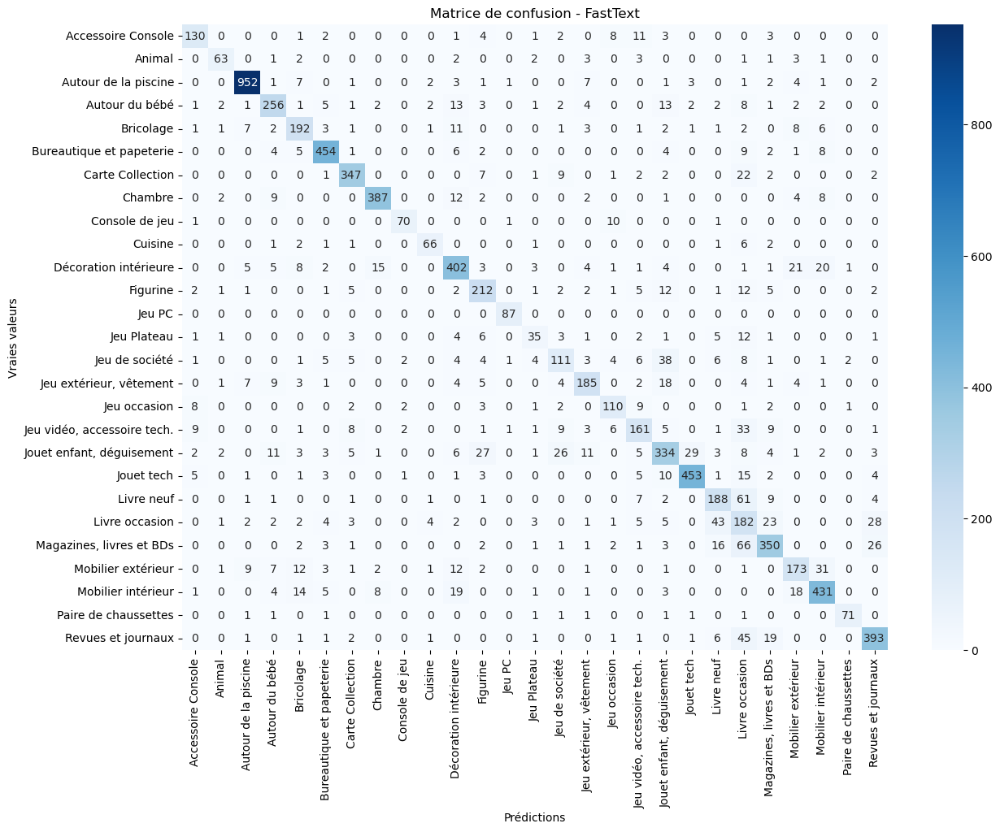


 Test avec lr=0.1, dim=300, epoch=100

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.82      0.78      0.80       166
                     Animal       0.88      0.78      0.83        82
       Autour de la piscine       0.96      0.96      0.96       989
             Autour du bébé       0.82      0.79      0.80       324
                  Bricolage       0.76      0.78      0.77       244
   Bureautique et papeterie       0.91      0.92      0.91       496
           Carte Collection       0.90      0.88      0.89       396
                    Chambre       0.93      0.91      0.92       427
             Console de jeu       0.91      0.84      0.88        83
                    Cuisine       0.87      0.84      0.86        81
      Décoration intérieure       0.80      0.81      0.80       497
                   Figurine       0.75      0.80      0.77       267
                     Jeu PC      

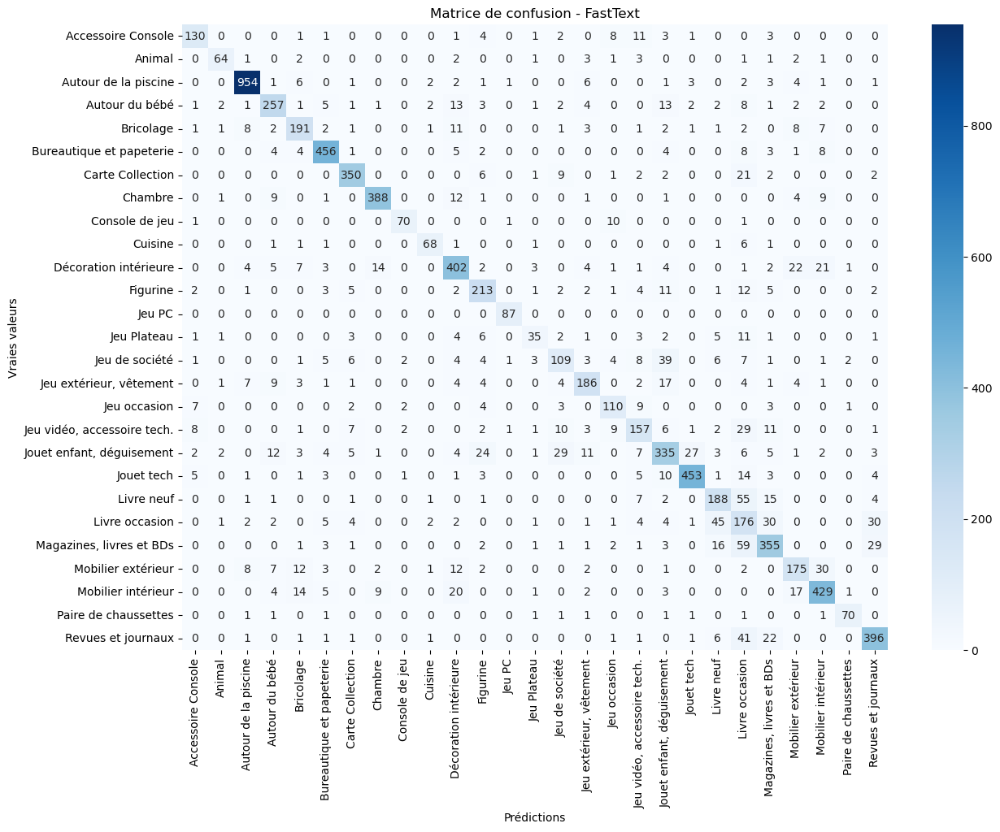


 Test avec lr=0.1, dim=300, epoch=200

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.84      0.78      0.81       166
                     Animal       0.86      0.78      0.82        82
       Autour de la piscine       0.96      0.97      0.97       989
             Autour du bébé       0.81      0.80      0.81       324
                  Bricolage       0.77      0.78      0.78       244
   Bureautique et papeterie       0.91      0.92      0.92       496
           Carte Collection       0.90      0.88      0.89       396
                    Chambre       0.93      0.91      0.92       427
             Console de jeu       0.91      0.86      0.88        83
                    Cuisine       0.86      0.83      0.84        81
      Décoration intérieure       0.80      0.82      0.81       497
                   Figurine       0.76      0.80      0.78       267
                     Jeu PC      

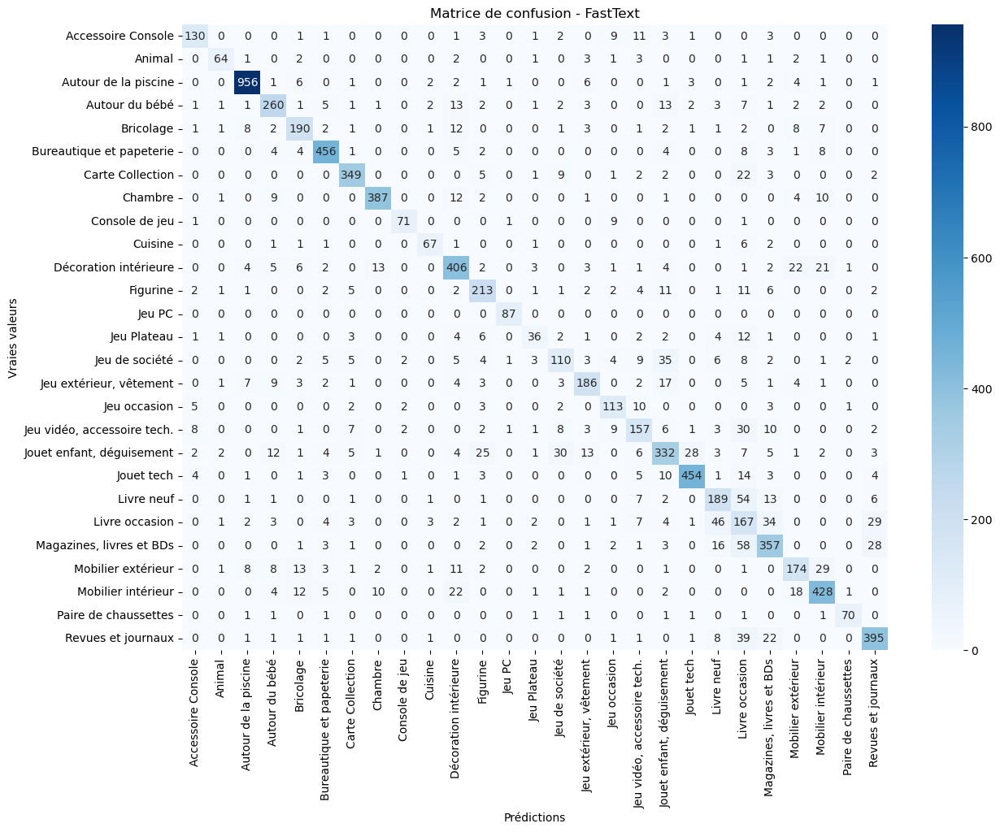


 Test avec lr=0.3, dim=100, epoch=50

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.84      0.77      0.80       166
                     Animal       0.87      0.80      0.84        82
       Autour de la piscine       0.96      0.97      0.96       989
             Autour du bébé       0.82      0.80      0.81       324
                  Bricolage       0.78      0.78      0.78       244
   Bureautique et papeterie       0.92      0.93      0.92       496
           Carte Collection       0.90      0.88      0.89       396
                    Chambre       0.93      0.91      0.92       427
             Console de jeu       0.91      0.86      0.88        83
                    Cuisine       0.88      0.83      0.85        81
      Décoration intérieure       0.80      0.82      0.81       497
                   Figurine       0.76      0.80      0.78       267
                     Jeu PC       

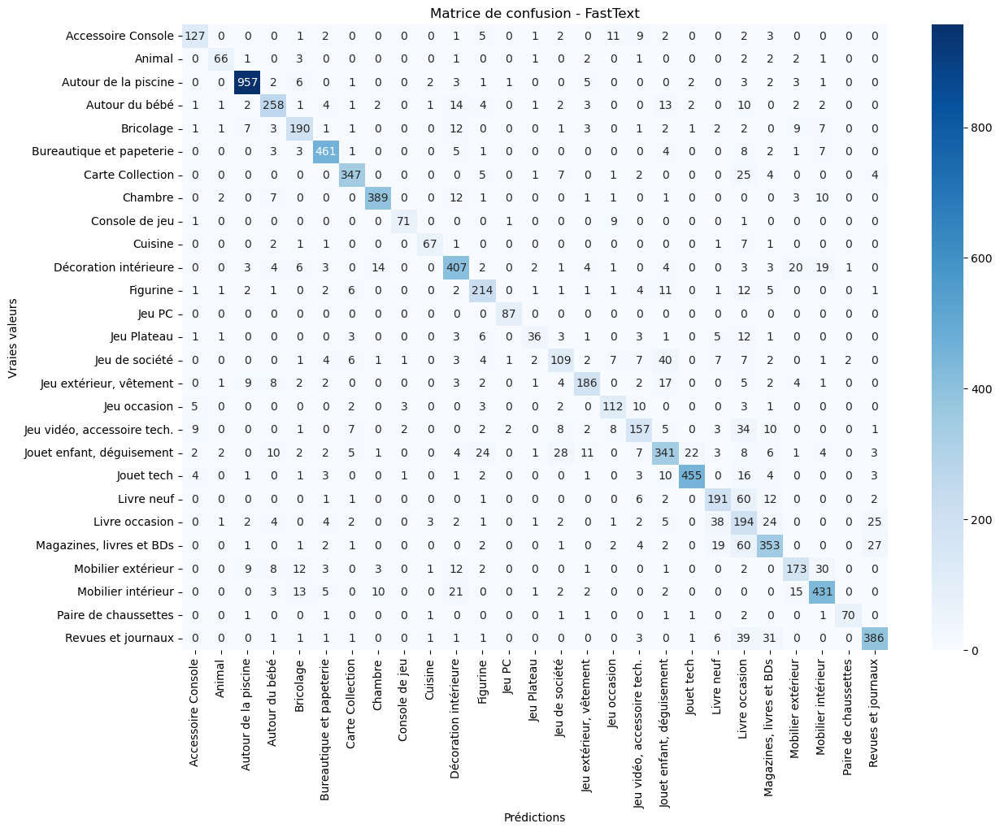


 Test avec lr=0.3, dim=100, epoch=100

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.83      0.77      0.80       166
                     Animal       0.86      0.80      0.83        82
       Autour de la piscine       0.96      0.97      0.97       989
             Autour du bébé       0.82      0.80      0.81       324
                  Bricolage       0.76      0.78      0.77       244
   Bureautique et papeterie       0.92      0.92      0.92       496
           Carte Collection       0.90      0.87      0.89       396
                    Chambre       0.92      0.90      0.91       427
             Console de jeu       0.91      0.84      0.88        83
                    Cuisine       0.88      0.84      0.86        81
      Décoration intérieure       0.80      0.82      0.81       497
                   Figurine       0.75      0.79      0.77       267
                     Jeu PC      

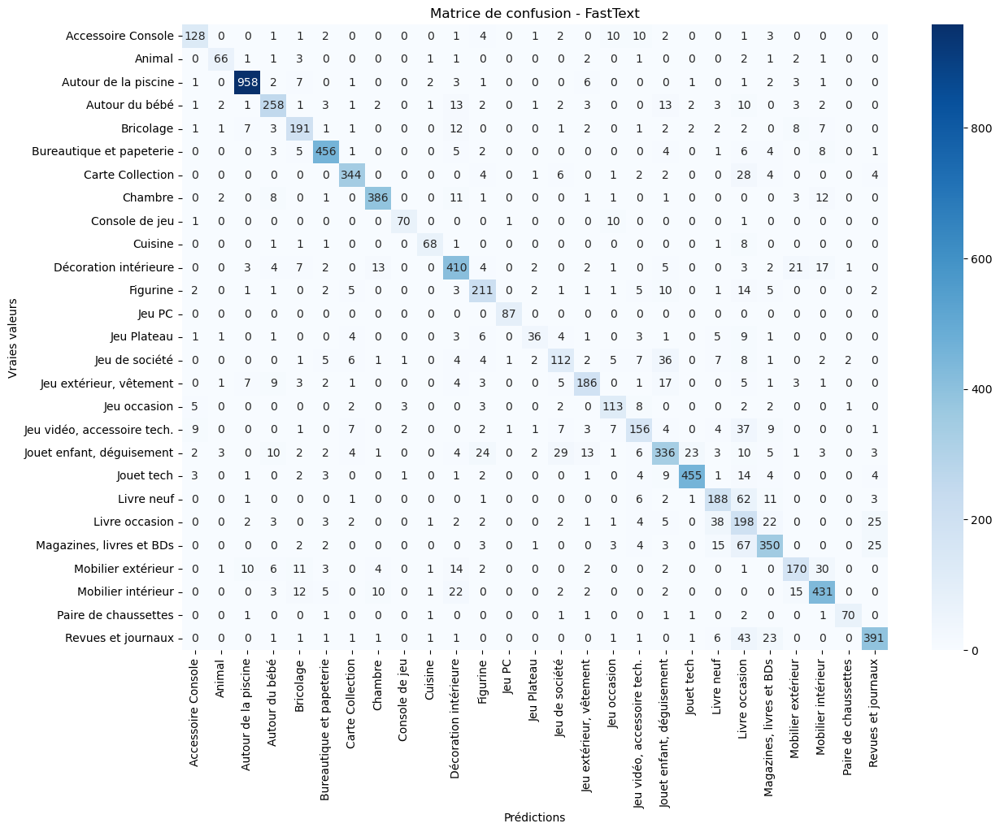


 Test avec lr=0.3, dim=100, epoch=200

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.84      0.77      0.81       166
                     Animal       0.83      0.79      0.81        82
       Autour de la piscine       0.96      0.97      0.96       989
             Autour du bébé       0.80      0.79      0.80       324
                  Bricolage       0.76      0.78      0.77       244
   Bureautique et papeterie       0.91      0.93      0.92       496
           Carte Collection       0.91      0.87      0.89       396
                    Chambre       0.93      0.91      0.92       427
             Console de jeu       0.92      0.86      0.89        83
                    Cuisine       0.92      0.84      0.88        81
      Décoration intérieure       0.80      0.82      0.81       497
                   Figurine       0.75      0.79      0.77       267
                     Jeu PC      

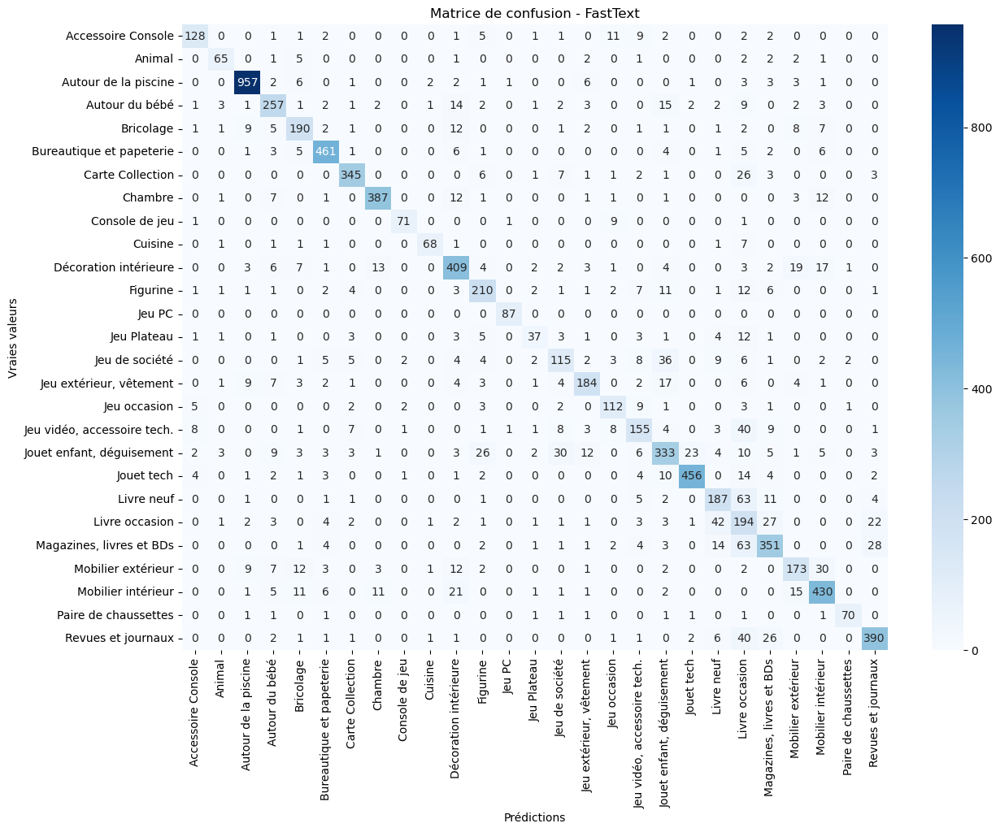


 Test avec lr=0.3, dim=150, epoch=50

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.85      0.79      0.82       166
                     Animal       0.87      0.79      0.83        82
       Autour de la piscine       0.96      0.96      0.96       989
             Autour du bébé       0.82      0.79      0.81       324
                  Bricolage       0.76      0.77      0.77       244
   Bureautique et papeterie       0.93      0.93      0.93       496
           Carte Collection       0.91      0.87      0.89       396
                    Chambre       0.92      0.91      0.92       427
             Console de jeu       0.92      0.84      0.88        83
                    Cuisine       0.91      0.83      0.86        81
      Décoration intérieure       0.80      0.82      0.81       497
                   Figurine       0.74      0.78      0.76       267
                     Jeu PC       

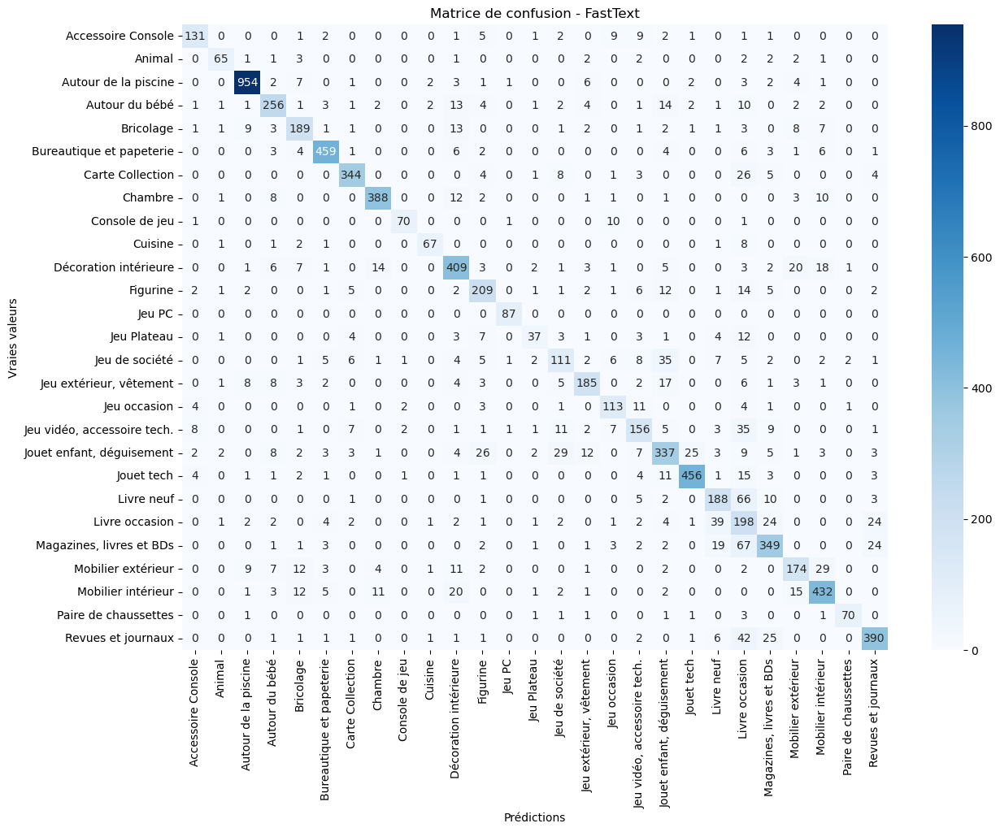


 Test avec lr=0.3, dim=150, epoch=100

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.83      0.78      0.81       166
                     Animal       0.82      0.80      0.81        82
       Autour de la piscine       0.96      0.97      0.96       989
             Autour du bébé       0.81      0.80      0.81       324
                  Bricolage       0.77      0.77      0.77       244
   Bureautique et papeterie       0.93      0.92      0.93       496
           Carte Collection       0.91      0.87      0.89       396
                    Chambre       0.93      0.91      0.92       427
             Console de jeu       0.91      0.86      0.88        83
                    Cuisine       0.88      0.83      0.85        81
      Décoration intérieure       0.80      0.82      0.81       497
                   Figurine       0.75      0.80      0.77       267
                     Jeu PC      

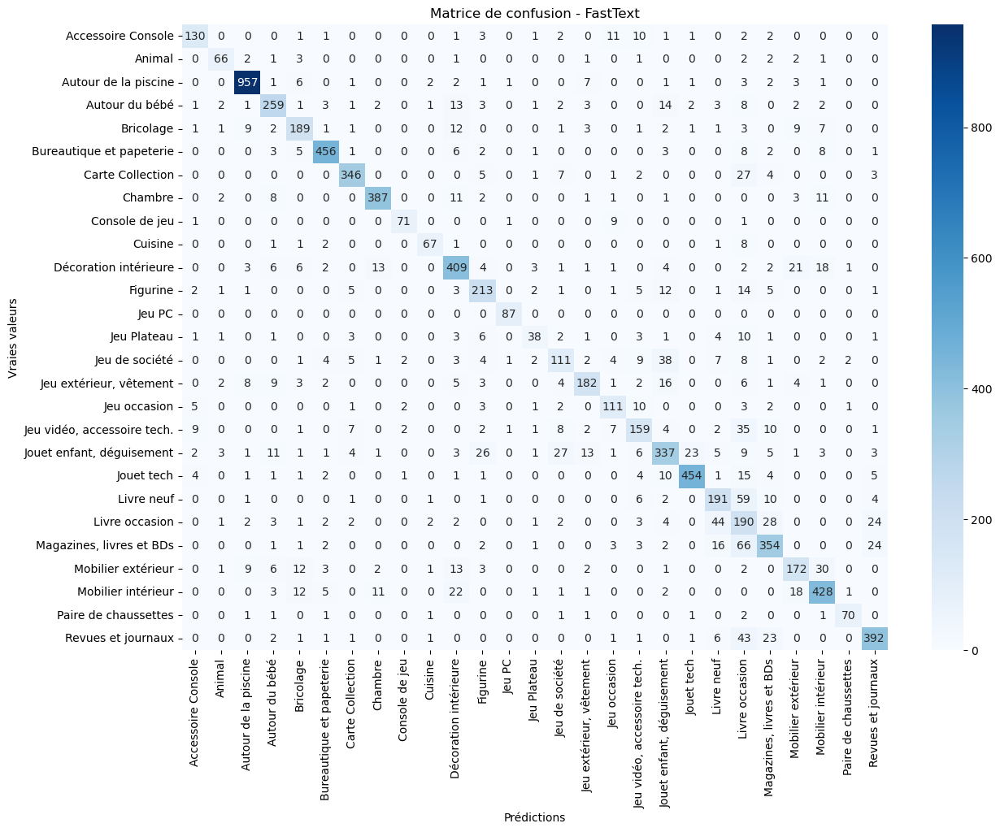


 Test avec lr=0.3, dim=150, epoch=200

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.85      0.76      0.80       166
                     Animal       0.86      0.80      0.83        82
       Autour de la piscine       0.97      0.97      0.97       989
             Autour du bébé       0.82      0.80      0.81       324
                  Bricolage       0.78      0.80      0.79       244
   Bureautique et papeterie       0.93      0.93      0.93       496
           Carte Collection       0.91      0.87      0.89       396
                    Chambre       0.93      0.90      0.91       427
             Console de jeu       0.92      0.86      0.89        83
                    Cuisine       0.93      0.85      0.89        81
      Décoration intérieure       0.80      0.83      0.82       497
                   Figurine       0.73      0.80      0.76       267
                     Jeu PC      

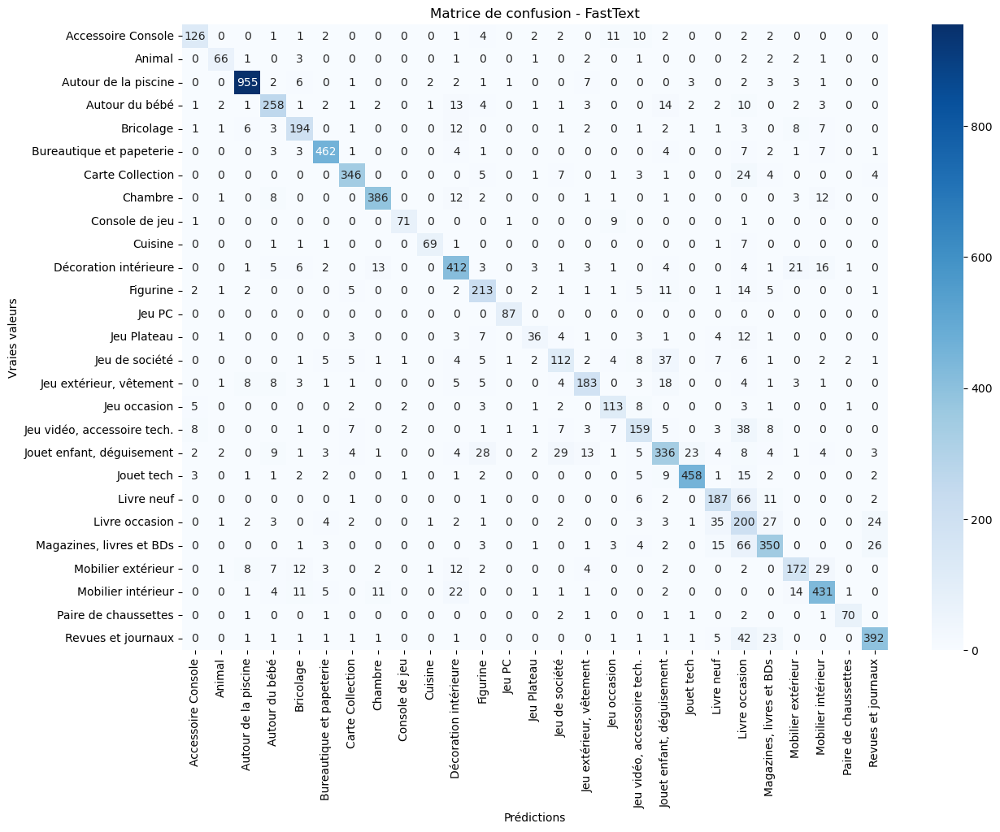


 Test avec lr=0.3, dim=200, epoch=50

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.82      0.78      0.80       166
                     Animal       0.86      0.80      0.83        82
       Autour de la piscine       0.96      0.97      0.97       989
             Autour du bébé       0.82      0.80      0.81       324
                  Bricolage       0.76      0.77      0.77       244
   Bureautique et papeterie       0.92      0.92      0.92       496
           Carte Collection       0.90      0.87      0.89       396
                    Chambre       0.93      0.91      0.92       427
             Console de jeu       0.91      0.86      0.88        83
                    Cuisine       0.92      0.83      0.87        81
      Décoration intérieure       0.81      0.82      0.82       497
                   Figurine       0.75      0.80      0.77       267
                     Jeu PC       

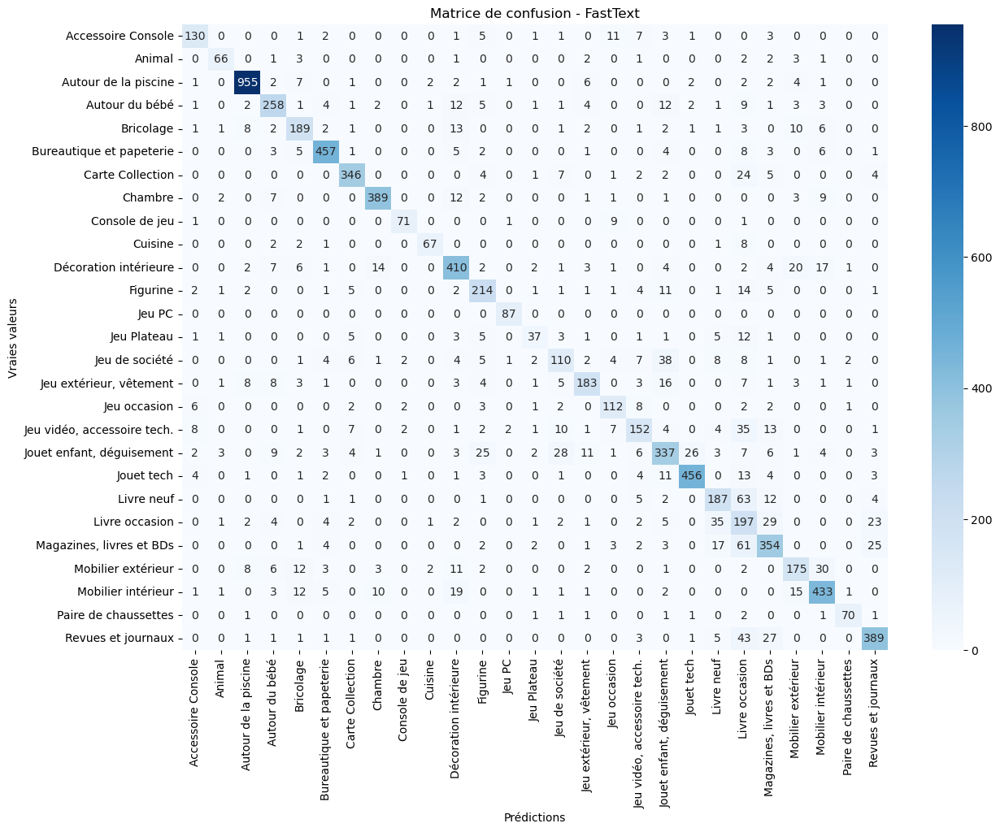


 Test avec lr=0.3, dim=200, epoch=100

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.82      0.77      0.79       166
                     Animal       0.83      0.79      0.81        82
       Autour de la piscine       0.96      0.97      0.97       989
             Autour du bébé       0.83      0.80      0.82       324
                  Bricolage       0.76      0.78      0.77       244
   Bureautique et papeterie       0.93      0.92      0.93       496
           Carte Collection       0.91      0.87      0.89       396
                    Chambre       0.92      0.90      0.91       427
             Console de jeu       0.90      0.84      0.87        83
                    Cuisine       0.92      0.83      0.87        81
      Décoration intérieure       0.80      0.82      0.81       497
                   Figurine       0.75      0.79      0.77       267
                     Jeu PC      

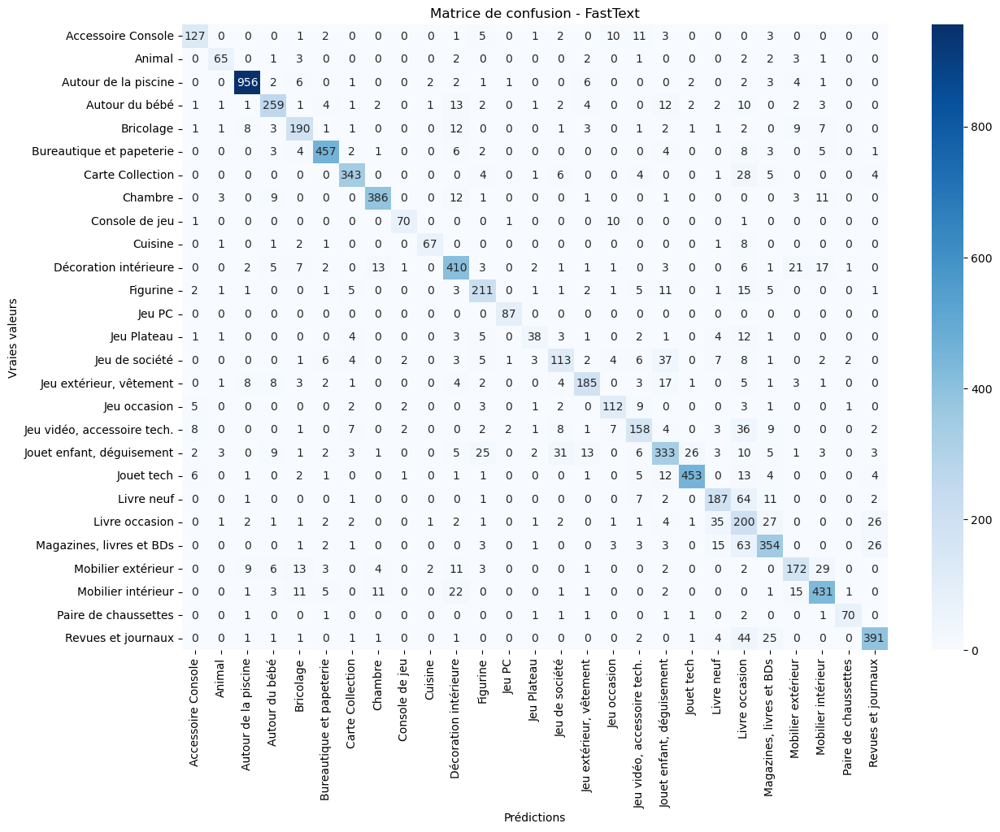


 Test avec lr=0.3, dim=200, epoch=200

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.85      0.77      0.81       166
                     Animal       0.83      0.79      0.81        82
       Autour de la piscine       0.96      0.97      0.97       989
             Autour du bébé       0.82      0.79      0.81       324
                  Bricolage       0.77      0.77      0.77       244
   Bureautique et papeterie       0.92      0.92      0.92       496
           Carte Collection       0.91      0.87      0.89       396
                    Chambre       0.93      0.91      0.92       427
             Console de jeu       0.91      0.86      0.88        83
                    Cuisine       0.91      0.84      0.87        81
      Décoration intérieure       0.80      0.83      0.82       497
                   Figurine       0.75      0.79      0.77       267
                     Jeu PC      

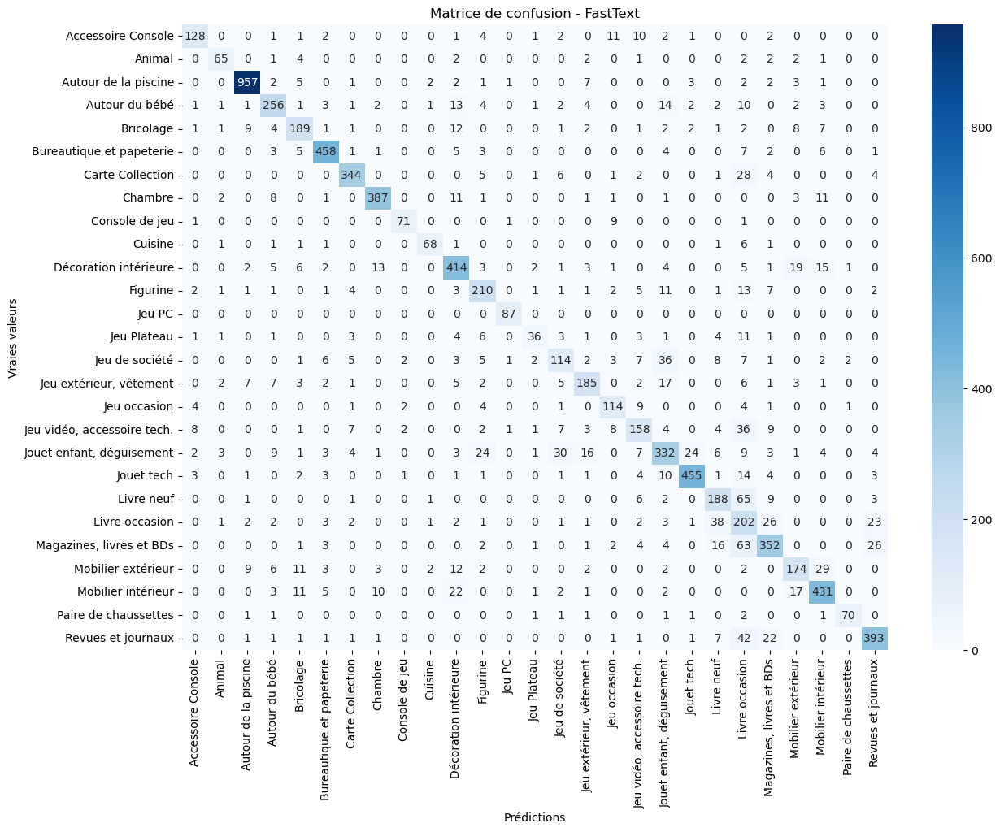


 Test avec lr=0.3, dim=300, epoch=50

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.82      0.78      0.80       166
                     Animal       0.86      0.79      0.82        82
       Autour de la piscine       0.97      0.97      0.97       989
             Autour du bébé       0.81      0.79      0.80       324
                  Bricolage       0.77      0.78      0.77       244
   Bureautique et papeterie       0.92      0.92      0.92       496
           Carte Collection       0.91      0.88      0.89       396
                    Chambre       0.93      0.91      0.92       427
             Console de jeu       0.92      0.86      0.89        83
                    Cuisine       0.87      0.85      0.86        81
      Décoration intérieure       0.80      0.83      0.82       497
                   Figurine       0.76      0.78      0.77       267
                     Jeu PC       

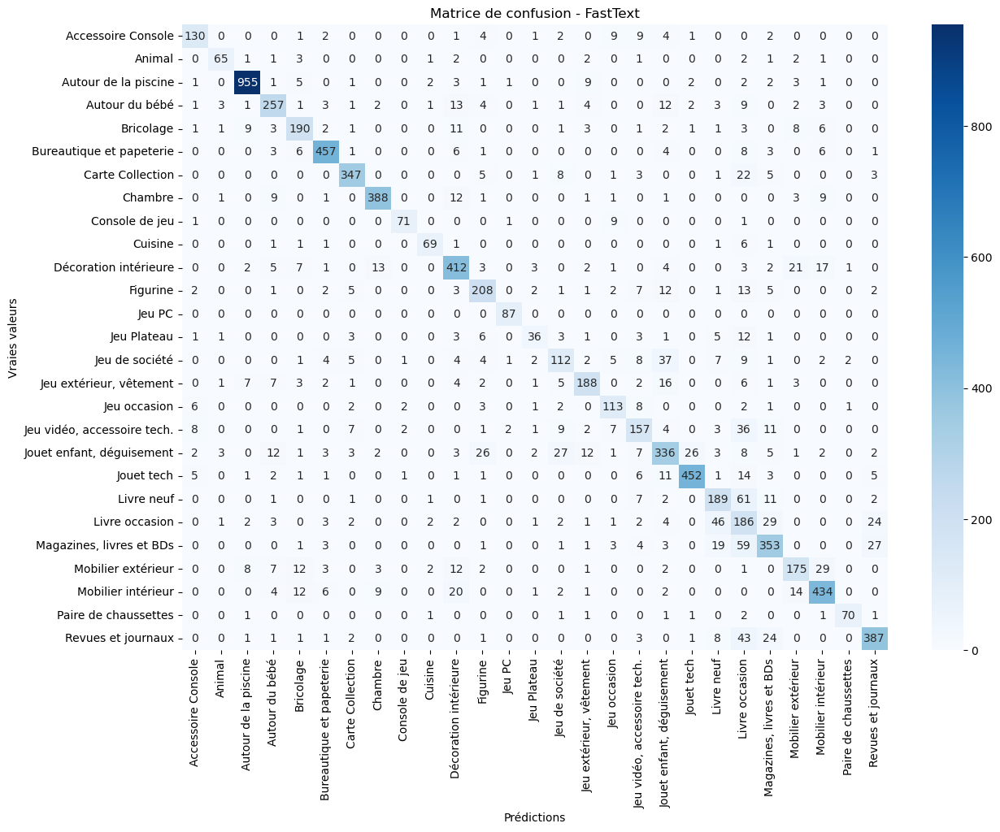


 Test avec lr=0.3, dim=300, epoch=100

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.84      0.77      0.80       166
                     Animal       0.86      0.80      0.83        82
       Autour de la piscine       0.97      0.97      0.97       989
             Autour du bébé       0.83      0.78      0.81       324
                  Bricolage       0.76      0.77      0.77       244
   Bureautique et papeterie       0.92      0.93      0.92       496
           Carte Collection       0.91      0.88      0.89       396
                    Chambre       0.92      0.91      0.92       427
             Console de jeu       0.91      0.86      0.88        83
                    Cuisine       0.90      0.85      0.87        81
      Décoration intérieure       0.80      0.82      0.81       497
                   Figurine       0.75      0.80      0.77       267
                     Jeu PC      

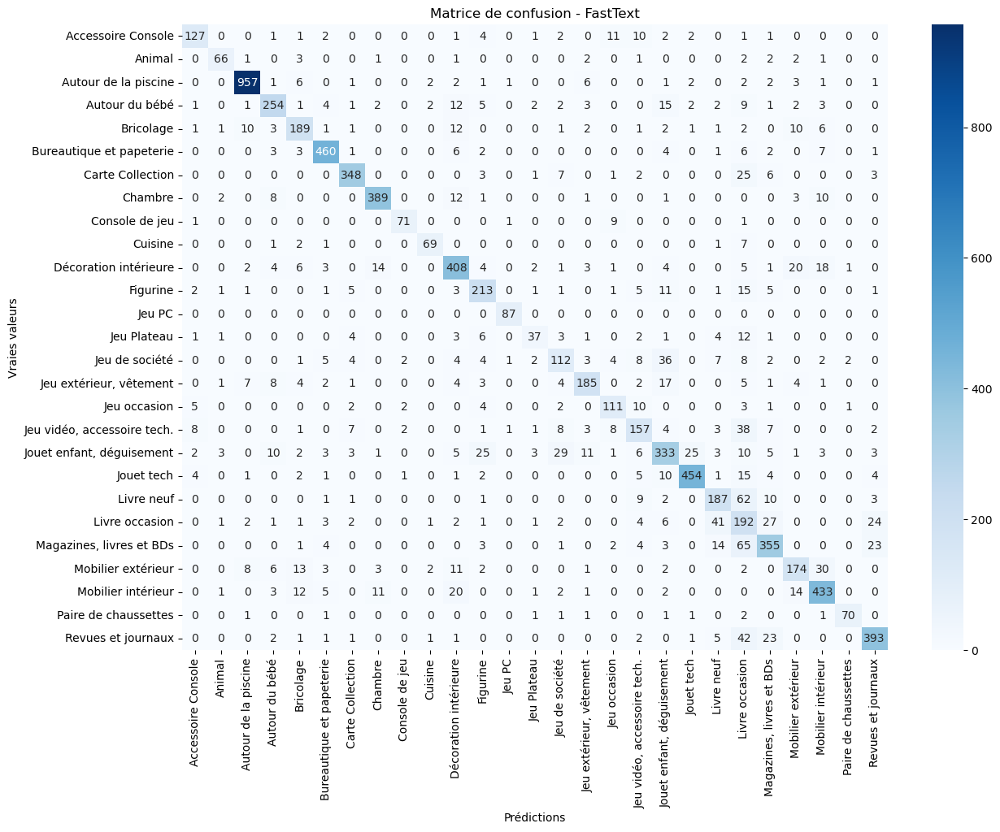


 Test avec lr=0.3, dim=300, epoch=200

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.84      0.76      0.80       166
                     Animal       0.83      0.79      0.81        82
       Autour de la piscine       0.96      0.97      0.96       989
             Autour du bébé       0.81      0.79      0.80       324
                  Bricolage       0.76      0.77      0.77       244
   Bureautique et papeterie       0.93      0.92      0.93       496
           Carte Collection       0.91      0.87      0.89       396
                    Chambre       0.92      0.91      0.91       427
             Console de jeu       0.91      0.84      0.88        83
                    Cuisine       0.91      0.84      0.87        81
      Décoration intérieure       0.80      0.82      0.81       497
                   Figurine       0.74      0.78      0.76       267
                     Jeu PC      

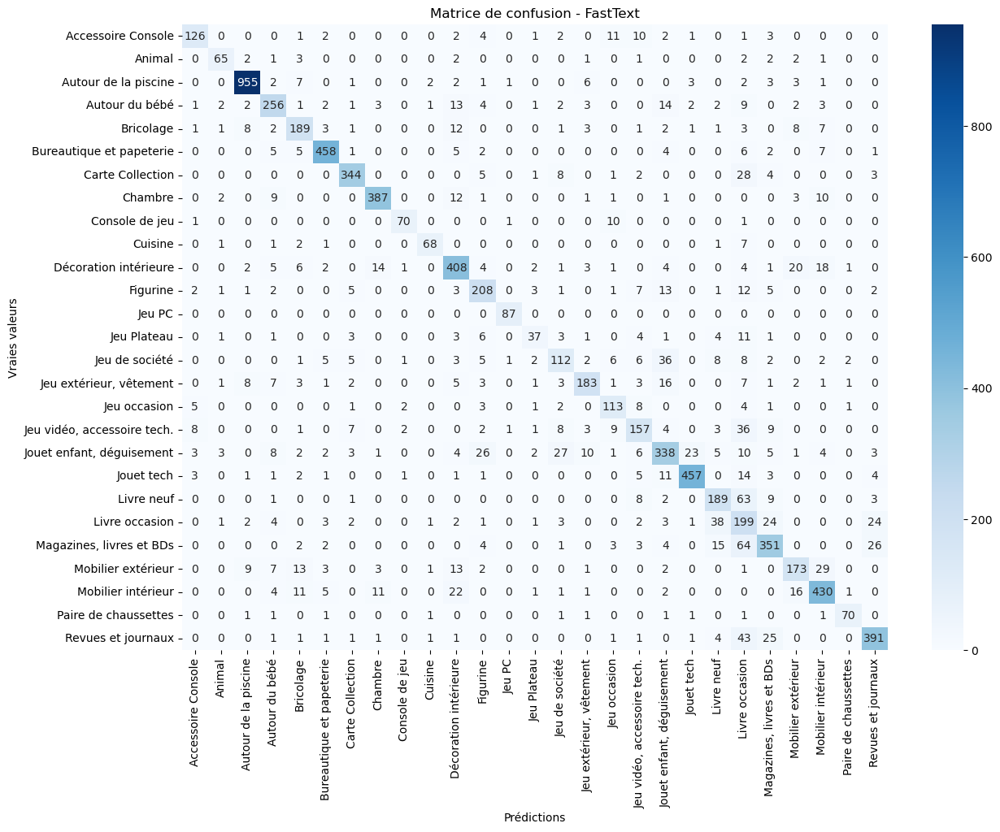


 Test avec lr=0.5, dim=100, epoch=50

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.85      0.79      0.82       166
                     Animal       0.85      0.78      0.82        82
       Autour de la piscine       0.97      0.97      0.97       989
             Autour du bébé       0.80      0.81      0.81       324
                  Bricolage       0.77      0.79      0.78       244
   Bureautique et papeterie       0.92      0.93      0.92       496
           Carte Collection       0.91      0.87      0.89       396
                    Chambre       0.92      0.91      0.91       427
             Console de jeu       0.92      0.84      0.88        83
                    Cuisine       0.88      0.84      0.86        81
      Décoration intérieure       0.80      0.82      0.81       497
                   Figurine       0.75      0.80      0.78       267
                     Jeu PC       

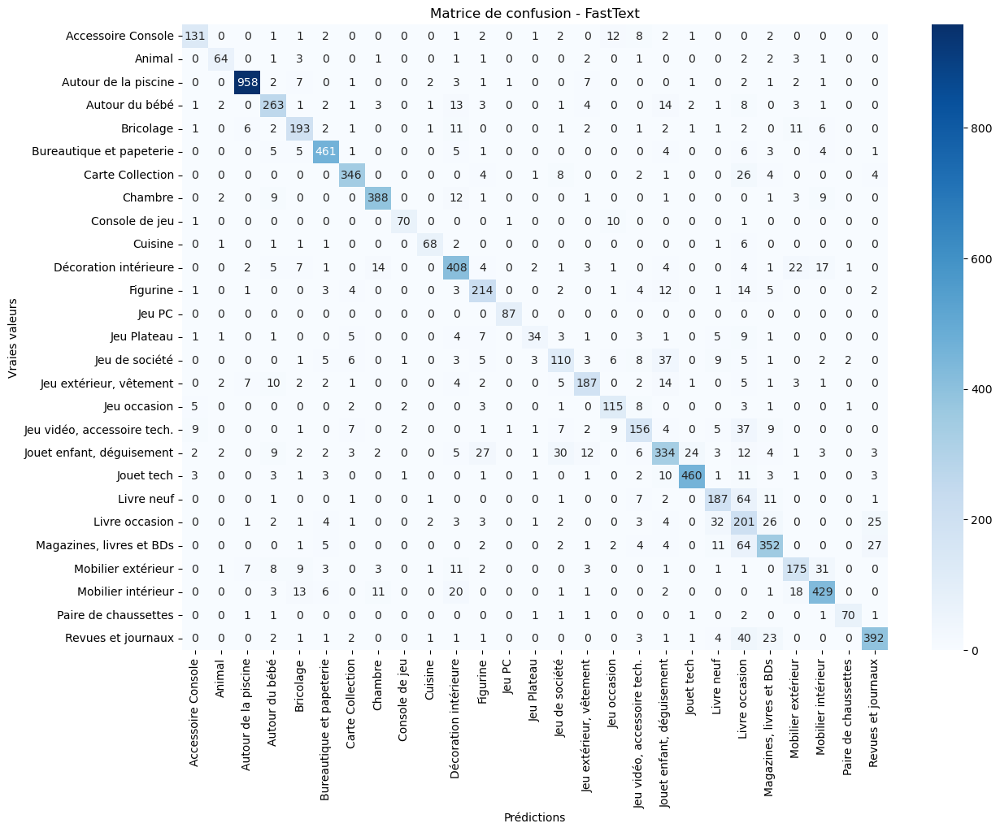


 Test avec lr=0.5, dim=100, epoch=100

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.86      0.81      0.83       166
                     Animal       0.90      0.80      0.85        82
       Autour de la piscine       0.97      0.97      0.97       989
             Autour du bébé       0.79      0.80      0.79       324
                  Bricolage       0.77      0.79      0.78       244
   Bureautique et papeterie       0.92      0.93      0.92       496
           Carte Collection       0.90      0.87      0.89       396
                    Chambre       0.92      0.92      0.92       427
             Console de jeu       0.93      0.84      0.89        83
                    Cuisine       0.88      0.80      0.84        81
      Décoration intérieure       0.79      0.83      0.81       497
                   Figurine       0.76      0.80      0.78       267
                     Jeu PC      

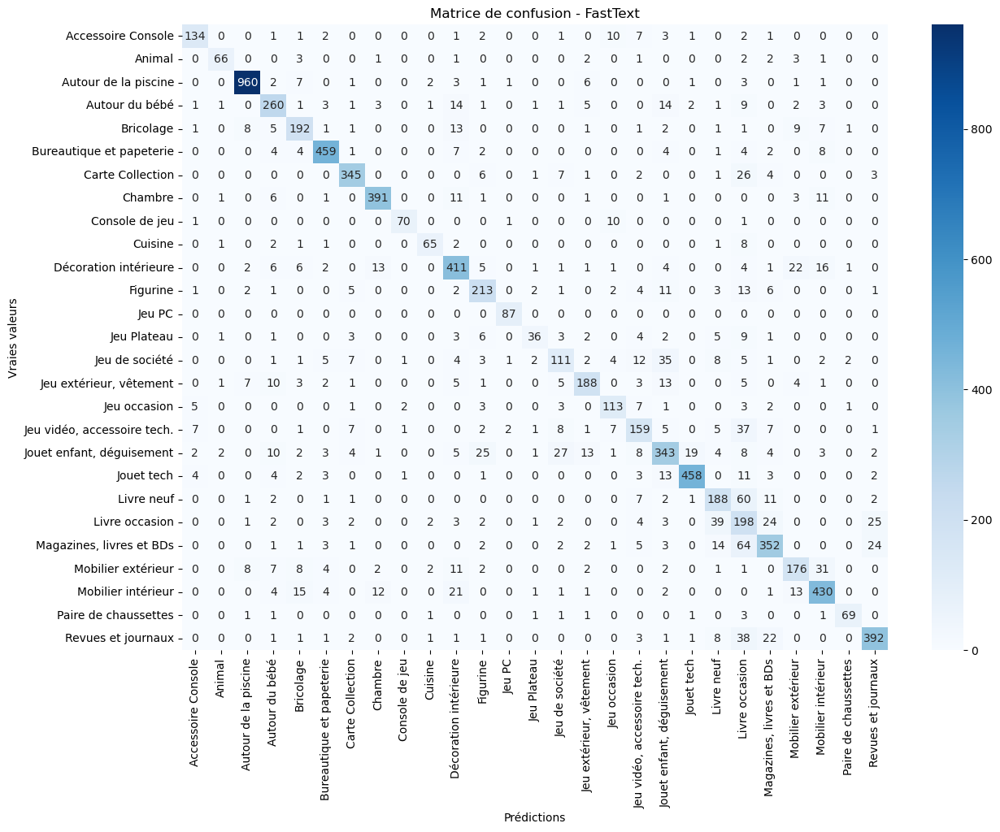


 Test avec lr=0.5, dim=100, epoch=200

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.86      0.78      0.82       166
                     Animal       0.84      0.79      0.82        82
       Autour de la piscine       0.97      0.97      0.97       989
             Autour du bébé       0.77      0.80      0.78       324
                  Bricolage       0.77      0.79      0.78       244
   Bureautique et papeterie       0.92      0.93      0.92       496
           Carte Collection       0.91      0.87      0.89       396
                    Chambre       0.92      0.91      0.91       427
             Console de jeu       0.92      0.86      0.89        83
                    Cuisine       0.91      0.84      0.87        81
      Décoration intérieure       0.79      0.84      0.81       497
                   Figurine       0.76      0.79      0.77       267
                     Jeu PC      

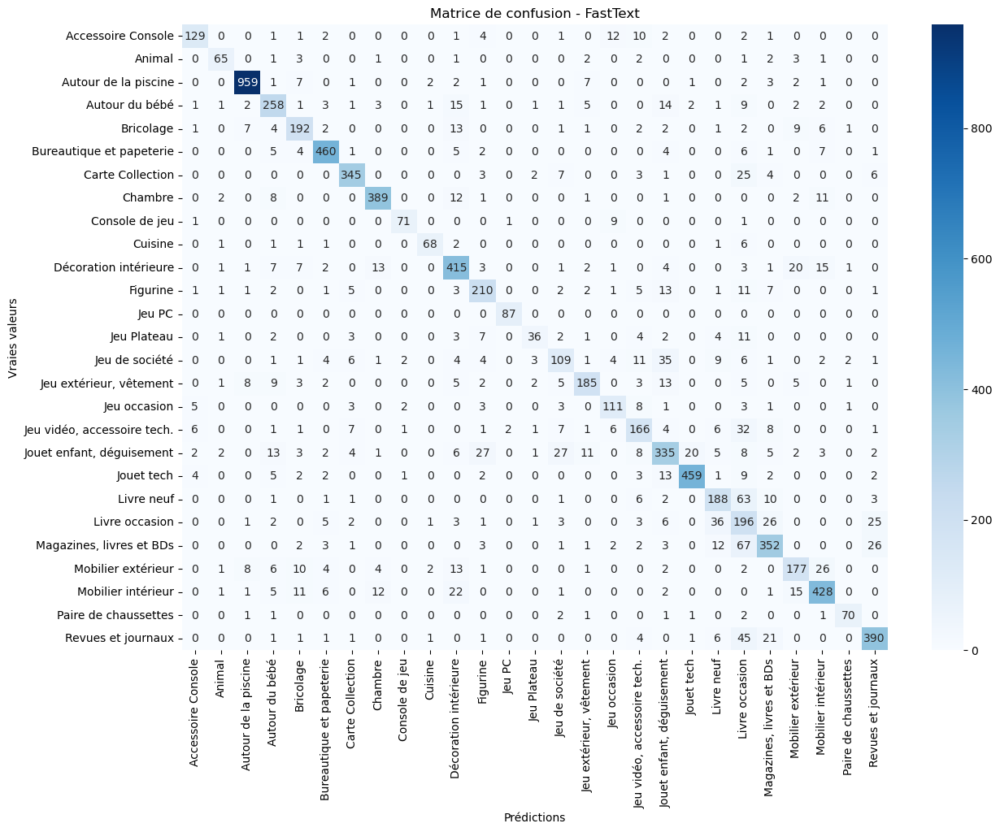


 Test avec lr=0.5, dim=150, epoch=50

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.84      0.76      0.80       166
                     Animal       0.86      0.79      0.82        82
       Autour de la piscine       0.97      0.97      0.97       989
             Autour du bébé       0.80      0.81      0.81       324
                  Bricolage       0.78      0.79      0.78       244
   Bureautique et papeterie       0.92      0.93      0.92       496
           Carte Collection       0.90      0.88      0.89       396
                    Chambre       0.92      0.91      0.91       427
             Console de jeu       0.92      0.84      0.88        83
                    Cuisine       0.91      0.84      0.87        81
      Décoration intérieure       0.80      0.81      0.81       497
                   Figurine       0.74      0.80      0.77       267
                     Jeu PC       

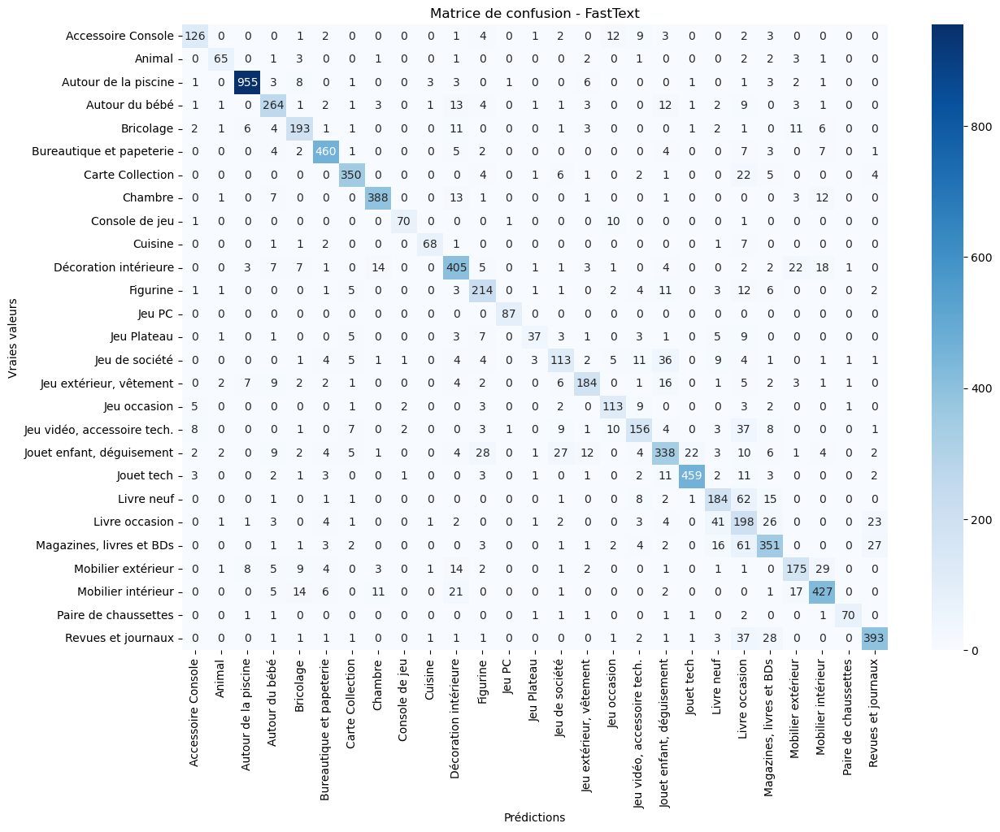


 Test avec lr=0.5, dim=150, epoch=100

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.84      0.77      0.80       166
                     Animal       0.87      0.79      0.83        82
       Autour de la piscine       0.97      0.97      0.97       989
             Autour du bébé       0.77      0.80      0.78       324
                  Bricolage       0.77      0.79      0.78       244
   Bureautique et papeterie       0.92      0.92      0.92       496
           Carte Collection       0.91      0.88      0.90       396
                    Chambre       0.93      0.91      0.92       427
             Console de jeu       0.92      0.86      0.89        83
                    Cuisine       0.90      0.85      0.87        81
      Décoration intérieure       0.79      0.82      0.81       497
                   Figurine       0.74      0.79      0.76       267
                     Jeu PC      

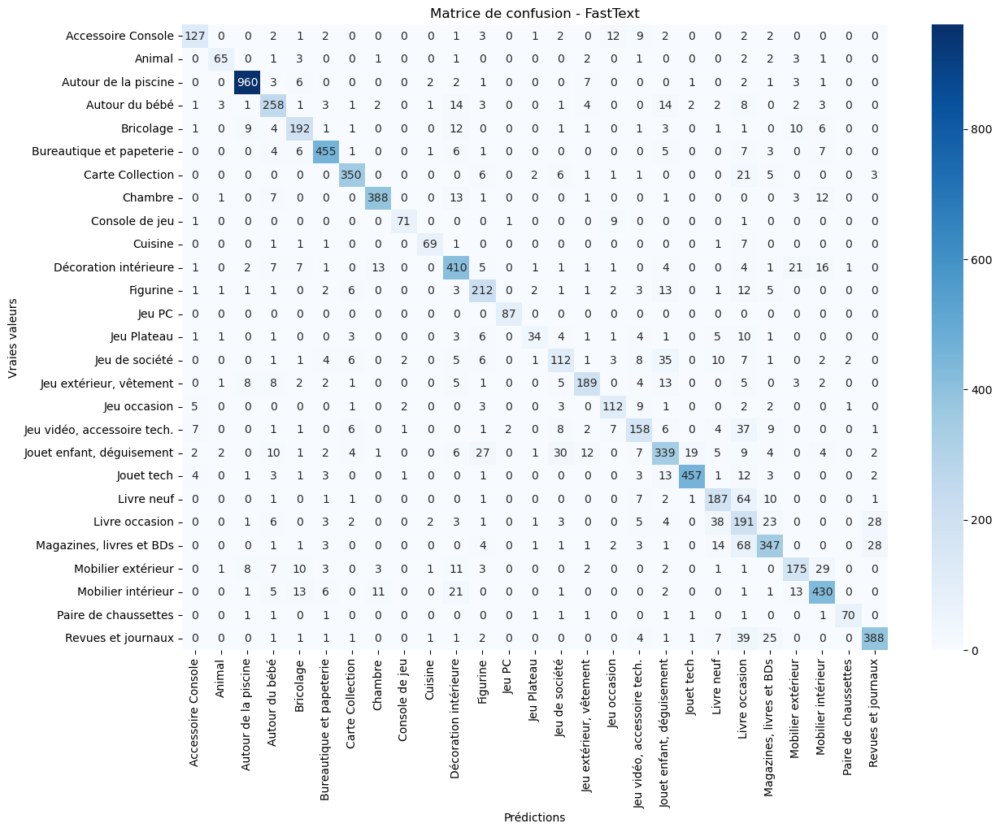


 Test avec lr=0.5, dim=150, epoch=200

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.85      0.77      0.81       166
                     Animal       0.83      0.79      0.81        82
       Autour de la piscine       0.97      0.97      0.97       989
             Autour du bébé       0.79      0.81      0.80       324
                  Bricolage       0.76      0.79      0.78       244
   Bureautique et papeterie       0.91      0.93      0.92       496
           Carte Collection       0.90      0.87      0.88       396
                    Chambre       0.91      0.91      0.91       427
             Console de jeu       0.92      0.84      0.88        83
                    Cuisine       0.92      0.83      0.87        81
      Décoration intérieure       0.78      0.82      0.80       497
                   Figurine       0.76      0.79      0.77       267
                     Jeu PC      

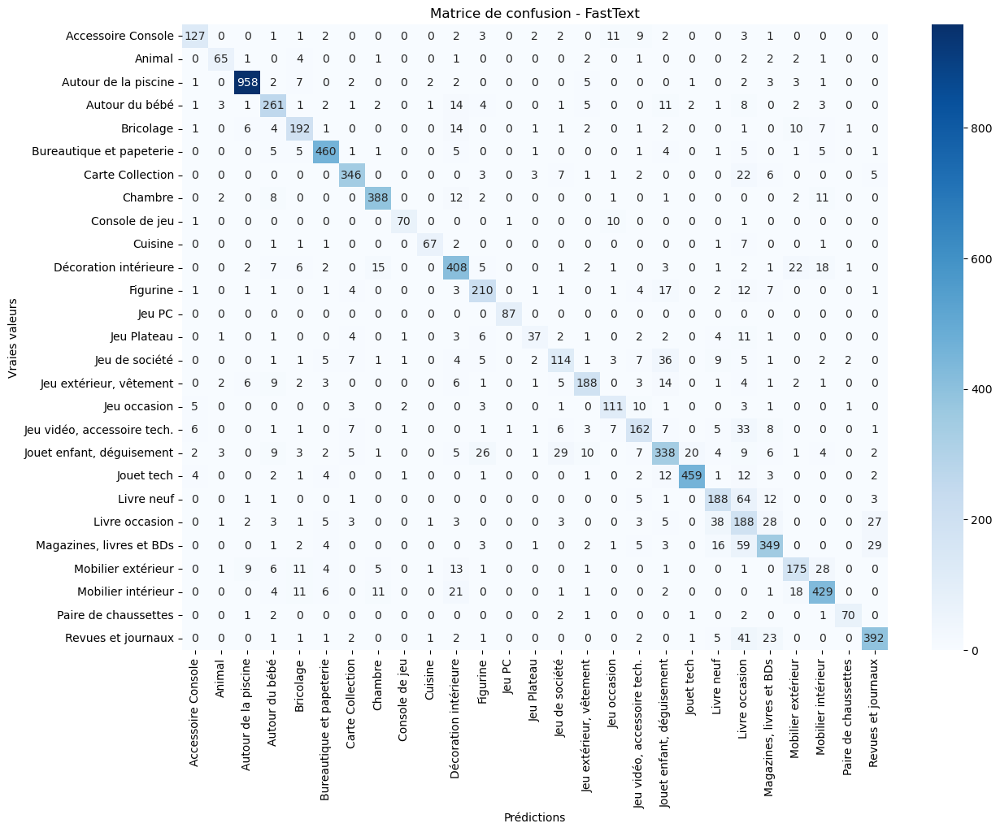


 Test avec lr=0.5, dim=200, epoch=50

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.85      0.79      0.82       166
                     Animal       0.84      0.78      0.81        82
       Autour de la piscine       0.97      0.97      0.97       989
             Autour du bébé       0.80      0.81      0.81       324
                  Bricolage       0.76      0.78      0.77       244
   Bureautique et papeterie       0.90      0.93      0.91       496
           Carte Collection       0.90      0.87      0.88       396
                    Chambre       0.92      0.91      0.92       427
             Console de jeu       0.90      0.84      0.87        83
                    Cuisine       0.89      0.84      0.87        81
      Décoration intérieure       0.80      0.82      0.81       497
                   Figurine       0.75      0.79      0.77       267
                     Jeu PC       

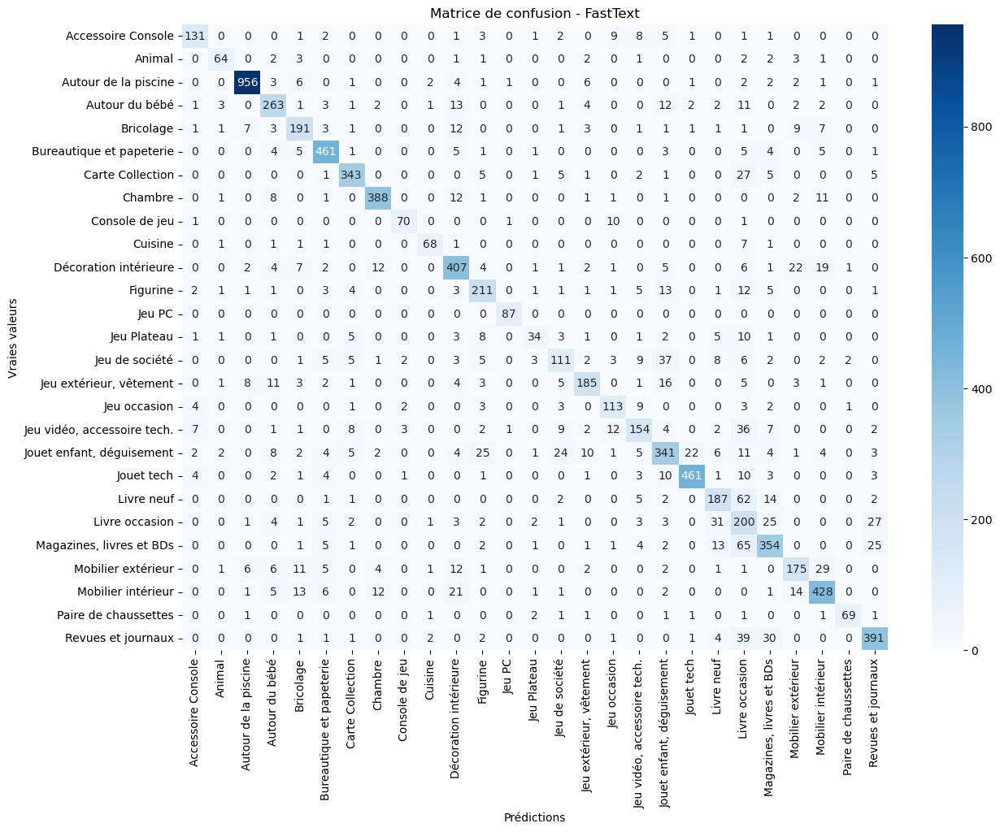


 Test avec lr=0.5, dim=200, epoch=100

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.84      0.79      0.81       166
                     Animal       0.88      0.82      0.85        82
       Autour de la piscine       0.97      0.97      0.97       989
             Autour du bébé       0.79      0.80      0.80       324
                  Bricolage       0.77      0.79      0.78       244
   Bureautique et papeterie       0.92      0.93      0.92       496
           Carte Collection       0.92      0.87      0.89       396
                    Chambre       0.92      0.91      0.91       427
             Console de jeu       0.90      0.84      0.87        83
                    Cuisine       0.92      0.84      0.88        81
      Décoration intérieure       0.80      0.82      0.81       497
                   Figurine       0.76      0.79      0.77       267
                     Jeu PC      

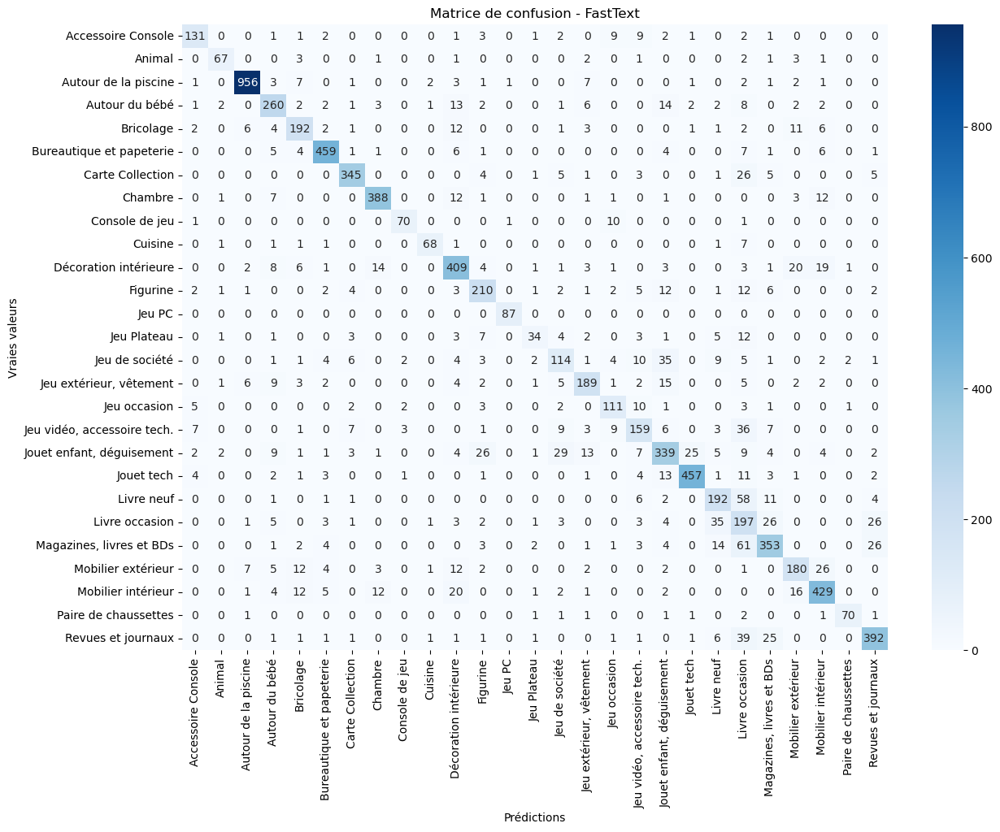


 Test avec lr=0.5, dim=200, epoch=200

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.85      0.78      0.81       166
                     Animal       0.87      0.79      0.83        82
       Autour de la piscine       0.97      0.97      0.97       989
             Autour du bébé       0.78      0.81      0.79       324
                  Bricolage       0.78      0.78      0.78       244
   Bureautique et papeterie       0.91      0.93      0.92       496
           Carte Collection       0.90      0.87      0.88       396
                    Chambre       0.92      0.90      0.91       427
             Console de jeu       0.93      0.86      0.89        83
                    Cuisine       0.91      0.84      0.87        81
      Décoration intérieure       0.79      0.82      0.81       497
                   Figurine       0.75      0.78      0.76       267
                     Jeu PC      

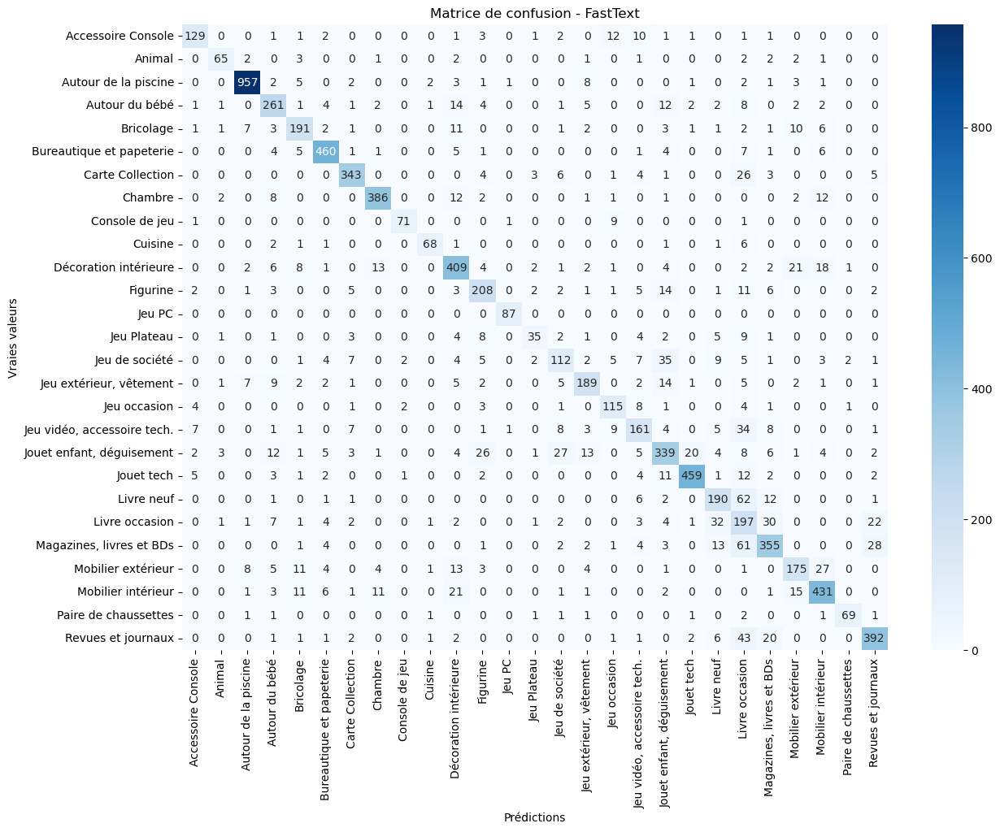


 Test avec lr=0.5, dim=300, epoch=50

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.86      0.80      0.83       166
                     Animal       0.89      0.79      0.84        82
       Autour de la piscine       0.97      0.97      0.97       989
             Autour du bébé       0.82      0.81      0.81       324
                  Bricolage       0.76      0.77      0.77       244
   Bureautique et papeterie       0.92      0.93      0.93       496
           Carte Collection       0.90      0.87      0.88       396
                    Chambre       0.91      0.91      0.91       427
             Console de jeu       0.90      0.84      0.87        83
                    Cuisine       0.88      0.85      0.87        81
      Décoration intérieure       0.79      0.82      0.81       497
                   Figurine       0.74      0.79      0.76       267
                     Jeu PC       

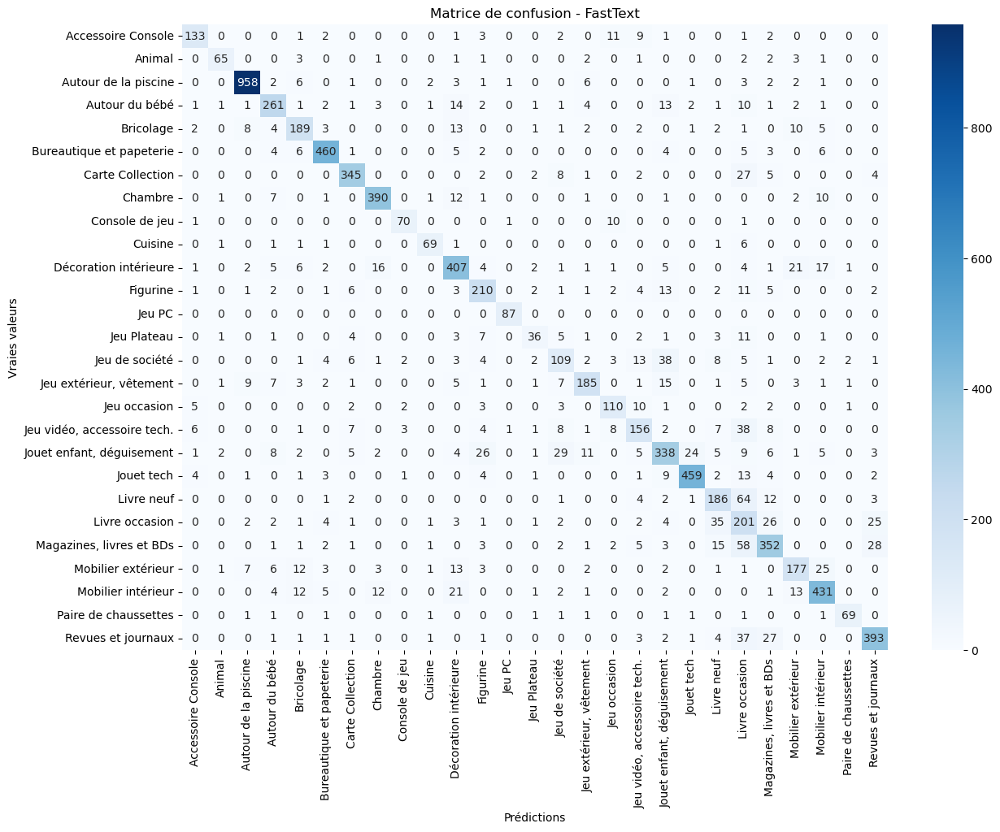


 Test avec lr=0.5, dim=300, epoch=100

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.85      0.79      0.82       166
                     Animal       0.86      0.80      0.83        82
       Autour de la piscine       0.97      0.97      0.97       989
             Autour du bébé       0.79      0.80      0.80       324
                  Bricolage       0.77      0.79      0.78       244
   Bureautique et papeterie       0.91      0.93      0.92       496
           Carte Collection       0.90      0.88      0.89       396
                    Chambre       0.93      0.91      0.92       427
             Console de jeu       0.93      0.84      0.89        83
                    Cuisine       0.93      0.80      0.86        81
      Décoration intérieure       0.80      0.82      0.81       497
                   Figurine       0.75      0.79      0.77       267
                     Jeu PC      

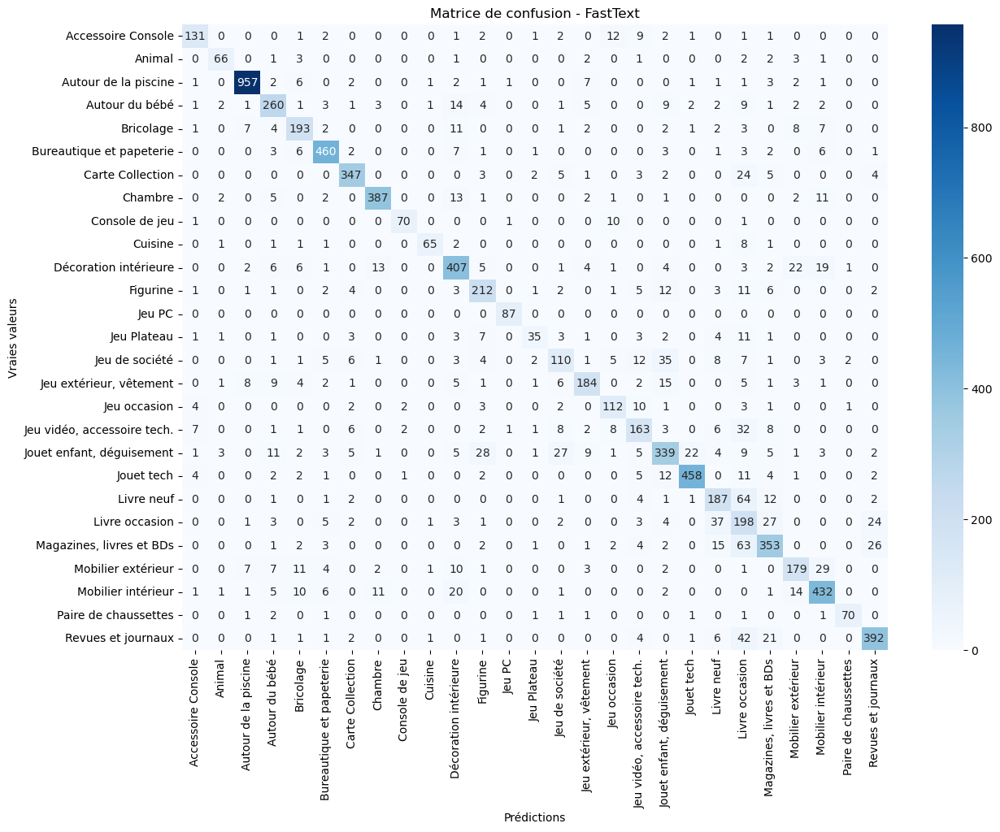


 Test avec lr=0.5, dim=300, epoch=200

 Rapport de classification :
                             precision    recall  f1-score   support

         Accessoire Console       0.84      0.78      0.81       166
                     Animal       0.84      0.79      0.82        82
       Autour de la piscine       0.97      0.96      0.97       989
             Autour du bébé       0.79      0.79      0.79       324
                  Bricolage       0.78      0.78      0.78       244
   Bureautique et papeterie       0.91      0.92      0.92       496
           Carte Collection       0.90      0.88      0.89       396
                    Chambre       0.92      0.90      0.91       427
             Console de jeu       0.92      0.84      0.88        83
                    Cuisine       0.89      0.83      0.86        81
      Décoration intérieure       0.78      0.82      0.80       497
                   Figurine       0.75      0.78      0.76       267
                     Jeu PC      

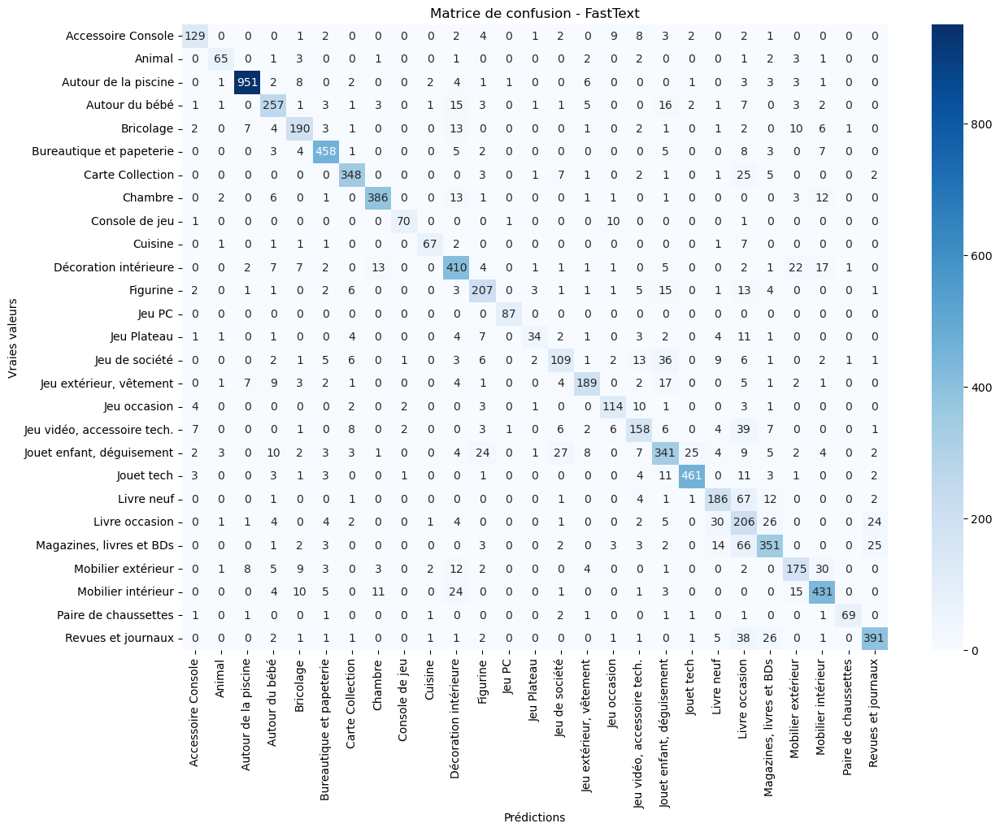


 Résultats du GridSearch FastText :
    learning_rate  dim  epoch  F1_score
37           0.50  100    100  0.817290
43           0.50  200    100  0.816368
46           0.50  300    100  0.815774
44           0.50  200    200  0.815679
36           0.50  100     50  0.815631
38           0.50  100    200  0.815463
29           0.30  150    200  0.815164
45           0.50  300     50  0.814741
39           0.50  150     50  0.814376
32           0.30  200    200  0.814328
42           0.50  200     50  0.814327
47           0.50  300    200  0.814275
41           0.50  150    200  0.813893
34           0.30  300    100  0.813628
24           0.30  100     50  0.813586
40           0.50  150    100  0.813531
30           0.30  200     50  0.813213
28           0.30  150    100  0.813093
31           0.30  200    100  0.813024
27           0.30  150     50  0.812979
25           0.30  100    100  0.812723
33           0.30  300     50  0.812557
35           0.30  300    200  0.812421
26 

'./fasttext_gridsearch_results.csv'

In [96]:
import itertools
import pandas as pd
import fasttext

# Définir les hyperparamètres à tester
learning_rates = [0.01, 0.1, 0.3, 0.5]
dims = [100, 150, 200, 300]
epochs = [50, 100, 200]

# Liste pour stocker les résultats
results = []

# Générer toutes les combinaisons d'hyperparamètres
param_grid = list(itertools.product(learning_rates, dims, epochs))

# Boucle sur chaque combinaison
for lr, dim, epoch in param_grid:
    print(f"\nEntraînement FastText - lr={lr}, dim={dim}, epoch={epoch}")

    # Entraînement du modèle FastText supervisé
    model = fasttext.train_supervised(
        input=train_file,
        lr=lr,
        epoch=epoch,
        wordNgrams=2,
        dim=dim,
        loss="softmax"
    )

    # Évaluation du modèle
    f1 = evaluate_fasttext(model, val_file, y_val)

    # Stocker les résultats
    results.append({
        "learning_rate": lr,
        "dim": dim,
        "epoch": epoch,
        "F1_score": f1
    })

# Création d’un DataFrame avec les résultats
df_results = pd.DataFrame(results)

# Tri décroissant selon le F1-score
df_results = df_results.sort_values(by="F1_score", ascending=False)

# Affichage des résultats
print("\nRésultats du Grid Search FastText :")
print(df_results)

# Sauvegarde dans un fichier CSV
results_file = "fasttext_gridsearch_results.csv"
df_results.to_csv(results_file, index=False)
print(f"\nRésultats enregistrés dans : {results_file}")
